In [2]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [8]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [10]:
pip install numpy

Note: you may need to restart the kernel to use updated packages.


In [12]:
pip install tqdm

Note: you may need to restart the kernel to use updated packages.


In [46]:
pip install torchinfo

Note: you may need to restart the kernel to use updated packages.


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, f1_score, precision_score, recall_score
from sklearn.preprocessing import label_binarize
from tqdm import tqdm

In [12]:
# Data Augmentation and Normalization
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.RandomResizedCrop(128),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/train/', transform=transform)
valid_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/valid/', transform=transform)
test_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/test/', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=8)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False, num_workers=8)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=8)

print("Number of training images: ", len(train_dataset))
print("Number of validation images: ", len(valid_dataset))
print("Number of testing images: ", len(test_dataset))


Number of training images:  80327
Number of validation images:  24364
Number of testing images:  305


In [4]:
import torch
import torch.nn as nn

class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        # Calculate the size of the flattened output from the last feature map
        self._to_linear = None
        self.convs = self._create_conv_layers()
        self._get_flattened_size()
        self.classifier = nn.Sequential(
            nn.Linear(self._to_linear, 4096),
            nn.ReLU(),
            nn.Linear(4096, 61)  # Assuming 61 output classes
        )
    
    def _create_conv_layers(self):
        layers = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        return layers

    def _get_flattened_size(self):
        # Create a dummy tensor to calculate the output size after the convolutions
        with torch.no_grad():
            dummy_input = torch.ones(1, 3, 128, 128)  # Batch size of 1, 3 channels, 128x128 image
            dummy_output = self.features(dummy_input)
            self._to_linear = dummy_output.numel()  # Number of elements in the flattened tensor

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)  # Flatten the tensor
        x = self.classifier(x)
        return x


In [6]:
pip install torchsummary


Note: you may need to restart the kernel to use updated packages.


In [8]:
from torchsummary import summary

# Assuming you have a GPU, but switch to 'cpu' if using a CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Instantiate the model and move it to the appropriate device
model = SimpleCNN().to(device)

# Generate and print the summary
summary(model, input_size=(3, 128, 128))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]             896
              ReLU-2         [-1, 32, 128, 128]               0
         MaxPool2d-3           [-1, 32, 64, 64]               0
            Conv2d-4           [-1, 64, 64, 64]          18,496
              ReLU-5           [-1, 64, 64, 64]               0
         MaxPool2d-6           [-1, 64, 32, 32]               0
            Conv2d-7          [-1, 128, 32, 32]          73,856
              ReLU-8          [-1, 128, 32, 32]               0
         MaxPool2d-9          [-1, 128, 16, 16]               0
           Linear-10                 [-1, 4096]     134,221,824
             ReLU-11                 [-1, 4096]               0
           Linear-12                   [-1, 61]         249,917
Total params: 134,564,989
Trainable params: 134,564,989
Non-trainable params: 0
-----------------------

In [24]:
model = SimpleCNN()
print(model)

# Dummy test to check the model
sample_input = torch.randn(1, 3, 128, 128)  # Batch size of 1
output = model(sample_input)
print("Output shape:", output.shape)


SimpleCNN(
  (features): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (convs): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), pa

In [16]:
# Check GPU availability
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device.type == 'cuda':
    print(f"Using GPU: {torch.cuda.get_device_name(0)}")
else:
    print("Using CPU")

Using GPU: NVIDIA GeForce RTX 4060 Laptop GPU


In [26]:
# Model, Loss, Optimizer
model = SimpleCNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

def train_model(model, train_loader, valid_loader, criterion, optimizer, num_epochs=20):
    history = {'train_loss': [], 'valid_loss': [], 'train_acc': [], 'valid_acc': []}

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        corrects = 0
        total = 0

        with tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}', leave=False) as tepoch:
            for images, labels in tepoch:
                images, labels = images.to(device), labels.to(device)
                optimizer.zero_grad()
                outputs = model(images)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()

                running_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                corrects += torch.sum(preds == labels.data)
                total += labels.size(0)
                tepoch.set_postfix(train_loss=running_loss / total, train_acc=corrects.double() / total)

        train_loss = running_loss / len(train_loader.dataset)
        train_acc = corrects.double() / total
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)

        model.eval()
        running_loss = 0.0
        corrects = 0
        total = 0

        with torch.no_grad():
            for images, labels in valid_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                running_loss += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                corrects += torch.sum(preds == labels.data)
                total += labels.size(0)

        valid_loss = running_loss / len(valid_loader.dataset)
        valid_acc = corrects.double() / total
        history['valid_loss'].append(valid_loss)
        history['valid_acc'].append(valid_acc)

        print(f'Epoch [{epoch+1}/{num_epochs}], '
              f'train_acc: {train_acc:.4f}, '
              f'train_loss: {train_loss:.4f}, '
              f'valid_loss: {valid_loss:.4f}, '
              f'valid_acc: {valid_acc:.4f}')

    return history


In [28]:
history = train_model(model, train_loader, valid_loader, criterion, optimizer)

Epoch [1/20], train_acc: 0.4004, train_loss: 2.1036, valid_loss: 1.7418, valid_acc: 0.4907


Epoch [2/20], train_acc: 0.5592, train_loss: 1.4665, valid_loss: 1.4856, valid_acc: 0.5504


Epoch [3/20], train_acc: 0.6178, train_loss: 1.2483, valid_loss: 1.2226, valid_acc: 0.6288


Epoch [4/20], train_acc: 0.6627, train_loss: 1.0917, valid_loss: 1.1139, valid_acc: 0.6604


Epoch [5/20], train_acc: 0.6917, train_loss: 0.9948, valid_loss: 0.9974, valid_acc: 0.6883


Epoch [6/20], train_acc: 0.7141, train_loss: 0.9162, valid_loss: 0.9455, valid_acc: 0.7019


Epoch [7/20], train_acc: 0.7334, train_loss: 0.8523, valid_loss: 0.9131, valid_acc: 0.7161


Epoch [8/20], train_acc: 0.7493, train_loss: 0.7968, valid_loss: 0.8835, valid_acc: 0.7232


Epoch [9/20], train_acc: 0.7603, train_loss: 0.7552, valid_loss: 0.7804, valid_acc: 0.7514


Epoch [10/20], train_acc: 0.7722, train_loss: 0.7152, valid_loss: 0.7457, valid_acc: 0.7599


Epoch [11/20], train_acc: 0.7836, train_loss: 0.6768, valid_loss: 0.7234, valid_acc: 0.7654


Epoch [12/20], train_acc: 0.7924, train_loss: 0.6474, valid_loss: 0.7145, valid_acc: 0.7706


Epoch [13/20], train_acc: 0.8010, train_loss: 0.6198, valid_loss: 0.6595, valid_acc: 0.7887


Epoch [14/20], train_acc: 0.8074, train_loss: 0.5996, valid_loss: 0.6410, valid_acc: 0.7906


Epoch [15/20], train_acc: 0.8132, train_loss: 0.5781, valid_loss: 0.6270, valid_acc: 0.7990


Epoch [16/20], train_acc: 0.8198, train_loss: 0.5577, valid_loss: 0.5924, valid_acc: 0.8081


Epoch [17/20], train_acc: 0.8241, train_loss: 0.5420, valid_loss: 0.5686, valid_acc: 0.8189


Epoch [18/20], train_acc: 0.8303, train_loss: 0.5194, valid_loss: 0.5818, valid_acc: 0.8091


Epoch [19/20], train_acc: 0.8372, train_loss: 0.5002, valid_loss: 0.5418, valid_acc: 0.8199


Epoch [20/20], train_acc: 0.8395, train_loss: 0.4910, valid_loss: 0.5414, valid_acc: 0.8211


In [36]:
# Assuming the model and optimizer states are intact after 20 epochs
# Start training from epoch 21 and continue for 10 more epochs
initial_epoch = 20
additional_epochs = 10

# Continue Training Function
def continue_training_model(model, train_loader, valid_loader, criterion, optimizer, initial_epoch, additional_epochs, history):
    total_epochs = initial_epoch + additional_epochs
    
    for epoch in range(initial_epoch, total_epochs):
        # Training Phase
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        with tqdm(train_loader, desc=f"Epoch {epoch+1}/{total_epochs}", leave=False) as tepoch:
            for images, labels in tepoch:
                images, labels = images.to(device), labels.to(device)
                
                optimizer.zero_grad()  # Reset gradients
                
                # Forward pass
                outputs = model(images)
                loss = criterion(outputs, labels)
                
                # Backward pass and optimization
                loss.backward()
                optimizer.step()
                
                # Statistics
                running_loss += loss.item() * images.size(0)
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()
                
                tepoch.set_postfix(train_loss=running_loss / total, train_acc=correct / total)
        
        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = correct / total
        
        # Validation Phase
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for images, labels in valid_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)
                
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()
        
        val_loss /= len(valid_loader.dataset)
        val_acc = val_correct / val_total
        
        # Append to history
        history['train_loss'].append(epoch_loss)
        history['valid_loss'].append(val_loss)
        history['train_acc'].append(epoch_acc)
        history['valid_acc'].append(val_acc)
        
        # Print the full summary for the epoch
        print(f"Epoch [{epoch+1}/{total_epochs}] - "
              f"Train Loss: {epoch_loss:.4f}, Train Accuracy: {epoch_acc:.4f}, "
              f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}")
    
    return history

# Continue training for 10 more epochs
history = continue_training_model(model, train_loader, valid_loader, criterion, optimizer, initial_epoch, additional_epochs, history)


Epoch [21/30] - Train Loss: 0.4749, Train Accuracy: 0.8447, Validation Loss: 0.5389, Validation Accuracy: 0.8221


Epoch [22/30] - Train Loss: 0.4599, Train Accuracy: 0.8485, Validation Loss: 0.5115, Validation Accuracy: 0.8331


Epoch [23/30] - Train Loss: 0.4482, Train Accuracy: 0.8537, Validation Loss: 0.5075, Validation Accuracy: 0.8337


Epoch [24/30] - Train Loss: 0.4403, Train Accuracy: 0.8559, Validation Loss: 0.4967, Validation Accuracy: 0.8352


Epoch [25/30] - Train Loss: 0.4276, Train Accuracy: 0.8576, Validation Loss: 0.4766, Validation Accuracy: 0.8428


Epoch [26/30] - Train Loss: 0.4228, Train Accuracy: 0.8602, Validation Loss: 0.4669, Validation Accuracy: 0.8479


Epoch [27/30] - Train Loss: 0.4151, Train Accuracy: 0.8633, Validation Loss: 0.4531, Validation Accuracy: 0.8498


Epoch [28/30] - Train Loss: 0.4031, Train Accuracy: 0.8662, Validation Loss: 0.4444, Validation Accuracy: 0.8541


Epoch [29/30] - Train Loss: 0.3949, Train Accuracy: 0.8688, Validation Loss: 0.4376, Validation Accuracy: 0.8549


Epoch [30/30] - Train Loss: 0.3844, Train Accuracy: 0.8721, Validation Loss: 0.4599, Validation Accuracy: 0.8505


In [38]:
# Save the model
torch.save(model.state_dict(), 'basic_cnn1.pth')
print("Model saved as basic_cnn1.pth")

Model saved as basic_cnn1.pth


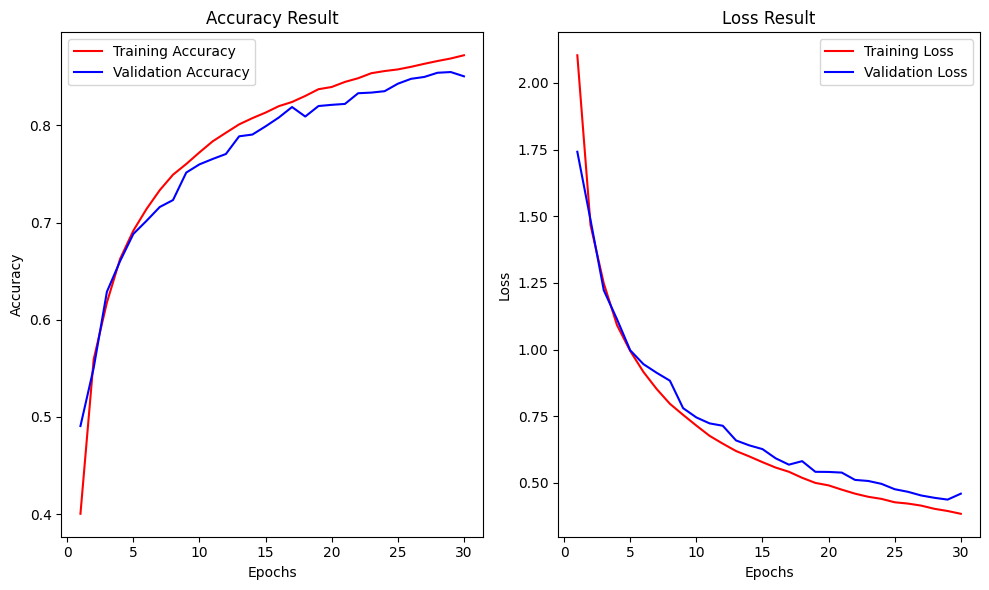

In [42]:
import matplotlib.pyplot as plt

def plot_results(history):
    epochs = range(1, len(history['train_loss']) + 1)
    plt.figure(figsize=(10, 6))

    # Move tensors to CPU before converting to numpy
    train_acc = [acc.cpu().numpy() if isinstance(acc, torch.Tensor) else acc for acc in history['train_acc']]
    valid_acc = [acc.cpu().numpy() if isinstance(acc, torch.Tensor) else acc for acc in history['valid_acc']]
    train_loss = [loss.cpu().numpy() if isinstance(loss, torch.Tensor) else loss for loss in history['train_loss']]
    valid_loss = [loss.cpu().numpy() if isinstance(loss, torch.Tensor) else loss for loss in history['valid_loss']]

    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_acc, 'r', label='Training Accuracy')
    plt.plot(epochs, valid_acc, 'b', label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Accuracy Result')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_loss, 'r', label='Training Loss')
    plt.plot(epochs, valid_loss, 'b', label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Loss Result')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_results(history)


In [44]:
def evaluate(model, data_loader):
    model.eval()
    running_loss = 0.0
    corrects = 0
    total = 0
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            corrects += torch.sum(preds == labels.data)
            total += labels.size(0)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    avg_loss = running_loss / len(data_loader.dataset)
    accuracy = corrects.double() / total

    return avg_loss, accuracy, all_labels, all_preds

# Evaluate on the training set
train_loss, train_acc, train_labels, train_preds = evaluate(model, train_loader)
print(f'Training Loss: {train_loss:.4f} Accuracy: {train_acc:.4f}')

# Evaluate on the validation set
valid_loss, valid_acc, valid_labels, valid_preds = evaluate(model, valid_loader)
print(f'Validation Loss: {valid_loss:.4f} Accuracy: {valid_acc:.4f}')

# Evaluate on the test set
test_loss, test_acc, test_labels, test_preds = evaluate(model, test_loader)
print(f'Test Loss: {test_loss:.4f} Accuracy: {test_acc:.4f}')


Training Loss: 0.3955 Accuracy: 0.8700
Validation Loss: 0.4599 Accuracy: 0.8507
Test Loss: 0.7025 Accuracy: 0.7836


In [50]:
from sklearn.metrics import classification_report

# Generate and print the classification report
def generate_classification_report(labels, preds, class_names):
    report = classification_report(labels, preds, target_names=class_names, digits=4)
    print("Classification Report:")
    print(report)

# Assuming `test_labels` and `test_preds` are your ground truth and predicted labels respectively,
# and `class_names` contains the names of your classes
generate_classification_report(test_labels, test_preds, class_names)


Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab     1.0000    1.0000    1.0000         5
                                 Apple___Black_rot     1.0000    1.0000    1.0000         5
                          Apple___Cedar_apple_rust     1.0000    1.0000    1.0000         5
                                   Apple___healthy     1.0000    1.0000    1.0000         5
                    Cauliflower_Bacterial spot rot     0.8000    0.8000    0.8000         5
                             Cauliflower_Black Rot     1.0000    1.0000    1.0000         5
                          Cauliflower_Downy Mildew     1.0000    0.6000    0.7500         5
                               Cauliflower_Healthy     1.0000    1.0000    1.0000         5
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot     0.8000    0.8000    0.8000         5
                       Corn_(maize)___Common_rust_     1

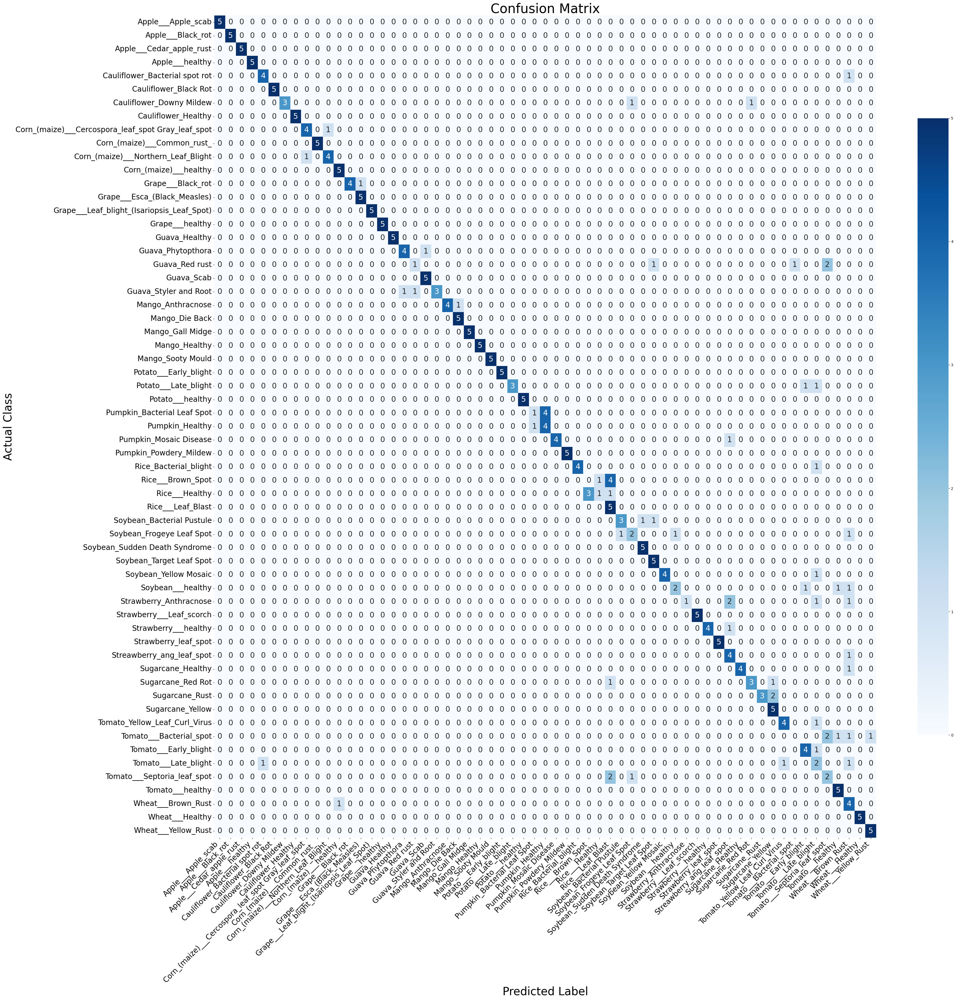

In [52]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate confusion matrix
cm = confusion_matrix(test_labels, test_preds, labels=range(len(class_names)))

plt.figure(figsize=(40, 40))  # Increase the figure size for better readability
sns.heatmap(cm, annot=True, fmt='d', annot_kws={'size': 20}, cmap="Blues", 
            xticklabels=class_names, yticklabels=class_names, cbar_kws={'shrink': 0.75})
plt.xlabel('Predicted Label', fontsize=30)
plt.ylabel("Actual Class", fontsize=30)
plt.title('Confusion Matrix', fontsize=35)
plt.xticks(fontsize=20, rotation=45, ha="right")  # Rotate x-axis labels for better readability
plt.yticks(fontsize=20, rotation=0)  # Keep y-axis labels horizontal
plt.show()


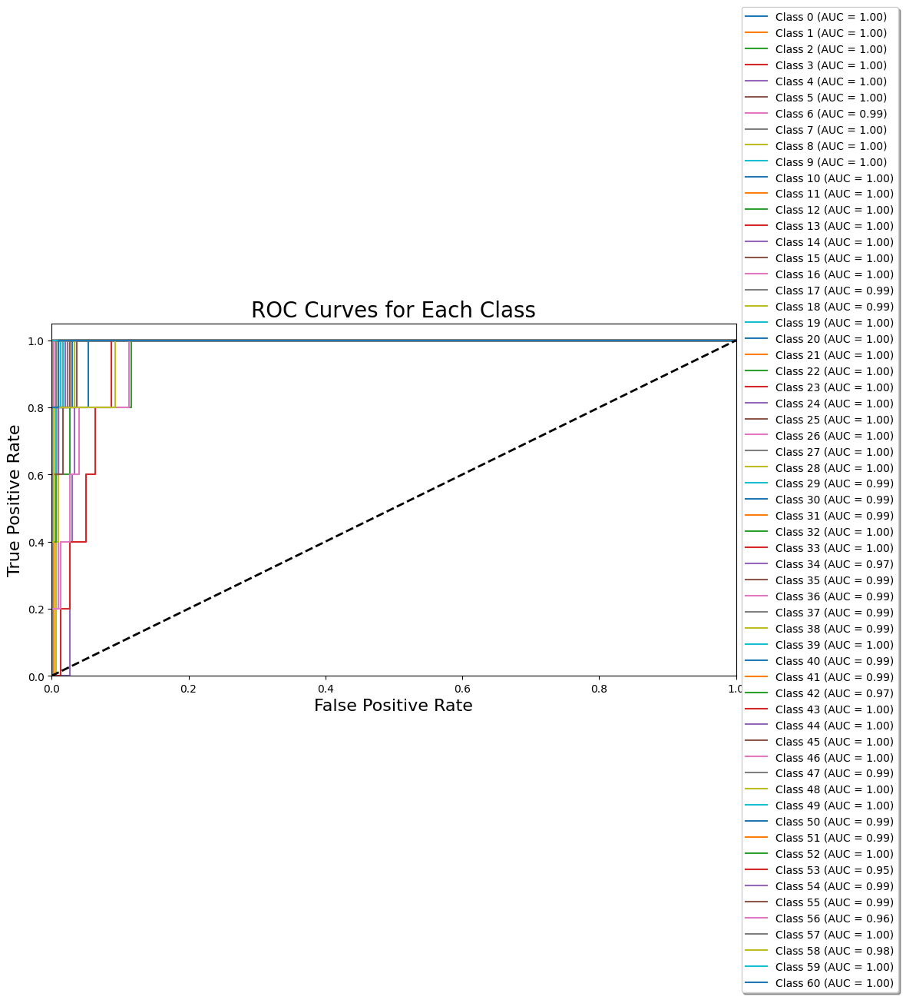

In [54]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import numpy as np
import torch
import matplotlib.pyplot as plt

# Define the plot_roc_curves function
def plot_roc_curves(model, data_loader, num_classes):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # Get probabilities
            probs = torch.nn.functional.softmax(outputs, dim=1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(probs.cpu().numpy())

    # Binarize the labels
    y_true = label_binarize(all_labels, classes=range(num_classes))
    y_score = np.array(all_preds)

    # Compute ROC curves and ROC AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(14, 10))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curves for Each Class', fontsize=20)

    # Position the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fancybox=True, shadow=True, ncol=1)
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for legend

    plt.show()

# Plot ROC curves for the test set
plot_roc_curves(model, test_loader, len(class_names))


# Transfer Learning Implementation

In [15]:
pip install torchvision

Note: you may need to restart the kernel to use updated packages.


In [33]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader,random_split,TensorDataset
from torchvision.utils import make_grid
from torchvision.transforms import ToTensor
from torchvision.datasets import ImageFolder
import torchvision.transforms as transforms
import torchvision.models as models

In [35]:
# List available GPUs and their memory usage
for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)}")
    print(f"  Memory Allocated: {torch.cuda.memory_allocated(i)}")
    print(f"  Memory Cached: {torch.cuda.memory_reserved(i)}")

GPU 0: NVIDIA GeForce RTX 4060 Laptop GPU
  Memory Allocated: 31805952
  Memory Cached: 35651584


## Resnet Model

In [38]:
# device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
# # Set device
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# # model.to(device)

In [40]:
# Define the ResNet model
model = models.resnet50(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, len(train_dataset.classes))

C:\Users\ACER\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ACER\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [42]:
# Move model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device.type == 'cuda':
    print(f"Using GPU: {torch.cuda.get_device_name(0)}")
else:
    print("Using CPU")
model = model.to(device)

Using GPU: NVIDIA GeForce RTX 4060 Laptop GPU


In [21]:
# Define transformations for data augmentation and normalization
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.RandomResizedCrop(128),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
# Load datasets
train_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/train/', transform=transform)
valid_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/valid/', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=8, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False, num_workers=8, pin_memory=True)

In [23]:
# # Wrap model with DataParallel if more than one GPU is available
# if torch.cuda.device_count() > 1:
#     model = nn.DataParallel(model)

# model.to(device)

In [25]:
# Define criterion and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# Gradient accumulation settings
accumulation_steps = 4

# Train the model
def train_model(model, train_loader, valid_loader, criterion, optimizer, num_epochs=20):
    history = {'train_loss': [], 'valid_loss': [], 'train_acc': [], 'valid_acc': []}
    
    for epoch in range(num_epochs):
        # Training Phase
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        for i, (images, labels) in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")):
            images, labels = images.to(device), labels.to(device)
            
            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            # Backward pass and optimization
            loss = loss / accumulation_steps  # Scale loss for gradient accumulation
            loss.backward()
            
            if (i + 1) % accumulation_steps == 0:
                optimizer.step()
                optimizer.zero_grad()
            
            # Statistics
            running_loss += loss.item() * accumulation_steps
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
        epoch_loss = running_loss / len(train_loader)
        epoch_acc = correct / total
        
        # Validation Phase
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for images, labels in valid_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()
        
        val_loss /= len(valid_loader)
        val_acc = val_correct / val_total
        
        # Save history
        history['train_loss'].append(epoch_loss)
        history['valid_loss'].append(val_loss)
        history['train_acc'].append(epoch_acc)
        history['valid_acc'].append(val_acc)
        
        # Print the full summary for the epoch
        print(f"Epoch [{epoch+1}/{num_epochs}], "
              f"train_acc: {epoch_acc:.4f}, train_loss: {epoch_loss:.4f}, "
              f"valid_loss: {val_loss:.4f}, valid_acc: {val_acc:.4f}")
    
    return history


In [29]:
# Train the model
history = train_model(model, train_loader, valid_loader, criterion, optimizer)

Epoch 1/20: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:19<00:00,  7.85it/s]


Epoch [1/20], train_acc: 0.7918, train_loss: 0.7115, valid_loss: 0.3438, valid_acc: 0.8847


Epoch 2/20: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:18<00:00,  7.87it/s]


Epoch [2/20], train_acc: 0.8920, train_loss: 0.3259, valid_loss: 0.2550, valid_acc: 0.9131


Epoch 3/20: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:35<00:00,  7.49it/s]


Epoch [3/20], train_acc: 0.9095, train_loss: 0.2688, valid_loss: 0.2268, valid_acc: 0.9204


Epoch 4/20: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:55<00:00,  7.07it/s]


Epoch [4/20], train_acc: 0.9193, train_loss: 0.2373, valid_loss: 0.2142, valid_acc: 0.9259


Epoch 5/20: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:52<00:00,  7.13it/s]


Epoch [5/20], train_acc: 0.9253, train_loss: 0.2187, valid_loss: 0.1840, valid_acc: 0.9362


Epoch 6/20: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:48<00:00,  7.20it/s]


Epoch [6/20], train_acc: 0.9308, train_loss: 0.2031, valid_loss: 0.1764, valid_acc: 0.9366


Epoch 7/20: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:49<00:00,  7.17it/s]


Epoch [7/20], train_acc: 0.9350, train_loss: 0.1916, valid_loss: 0.1836, valid_acc: 0.9327


Epoch 8/20: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:49<00:00,  7.18it/s]


Epoch [8/20], train_acc: 0.9375, train_loss: 0.1825, valid_loss: 0.1776, valid_acc: 0.9373


Epoch 9/20: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:34<00:00,  7.51it/s]


Epoch [9/20], train_acc: 0.9407, train_loss: 0.1743, valid_loss: 0.1648, valid_acc: 0.9415


Epoch 10/20: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:35<00:00,  7.48it/s]


Epoch [10/20], train_acc: 0.9433, train_loss: 0.1668, valid_loss: 0.1508, valid_acc: 0.9466


Epoch 11/20: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:34<00:00,  7.51it/s]


Epoch [11/20], train_acc: 0.9427, train_loss: 0.1658, valid_loss: 0.1425, valid_acc: 0.9495


Epoch 12/20: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:32<00:00,  7.55it/s]


Epoch [12/20], train_acc: 0.9471, train_loss: 0.1547, valid_loss: 0.1500, valid_acc: 0.9471


Epoch 13/20: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:31<00:00,  7.59it/s]


Epoch [13/20], train_acc: 0.9476, train_loss: 0.1517, valid_loss: 0.1395, valid_acc: 0.9518


Epoch 14/20: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:31<00:00,  7.57it/s]


Epoch [14/20], train_acc: 0.9489, train_loss: 0.1481, valid_loss: 0.1267, valid_acc: 0.9561


Epoch 15/20: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:32<00:00,  7.54it/s]


Epoch [15/20], train_acc: 0.9496, train_loss: 0.1447, valid_loss: 0.1348, valid_acc: 0.9528


Epoch 16/20: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:18<00:00,  7.88it/s]


Epoch [16/20], train_acc: 0.9521, train_loss: 0.1407, valid_loss: 0.1309, valid_acc: 0.9538


Epoch 17/20: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:30<00:00,  7.60it/s]


Epoch [17/20], train_acc: 0.9532, train_loss: 0.1366, valid_loss: 0.1238, valid_acc: 0.9564


Epoch 18/20: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:31<00:00,  7.58it/s]


Epoch [18/20], train_acc: 0.9539, train_loss: 0.1342, valid_loss: 0.1222, valid_acc: 0.9581


Epoch 19/20: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:18<00:00,  7.88it/s]


Epoch [19/20], train_acc: 0.9535, train_loss: 0.1323, valid_loss: 0.1230, valid_acc: 0.9562


Epoch 20/20: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:17<00:00,  7.90it/s]


Epoch [20/20], train_acc: 0.9562, train_loss: 0.1264, valid_loss: 0.1162, valid_acc: 0.9594


In [35]:
# Save the model
torch.save(model.state_dict(), 'resnet50.pth')
print("Model saved as resnet50.pth")

Model saved as resnet50.pth


In [68]:
import torch
import torch.nn as nn
from torchinfo import summary
from torchvision import models

# Define the ResNet model
model = models.resnet50(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, len(train_dataset.classes))

# Example batch size
batch_size = 32

# Use the summary function to print the model summary
summary(model, input_size=(batch_size, 3, 224, 224))


Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [32, 61]                  --
├─Conv2d: 1-1                            [32, 64, 112, 112]        9,408
├─BatchNorm2d: 1-2                       [32, 64, 112, 112]        128
├─ReLU: 1-3                              [32, 64, 112, 112]        --
├─MaxPool2d: 1-4                         [32, 64, 56, 56]          --
├─Sequential: 1-5                        [32, 256, 56, 56]         --
│    └─Bottleneck: 2-1                   [32, 256, 56, 56]         --
│    │    └─Conv2d: 3-1                  [32, 64, 56, 56]          4,096
│    │    └─BatchNorm2d: 3-2             [32, 64, 56, 56]          128
│    │    └─ReLU: 3-3                    [32, 64, 56, 56]          --
│    │    └─Conv2d: 3-4                  [32, 64, 56, 56]          36,864
│    │    └─BatchNorm2d: 3-5             [32, 64, 56, 56]          128
│    │    └─ReLU: 3-6                    [32, 64, 56, 56]          --
│ 

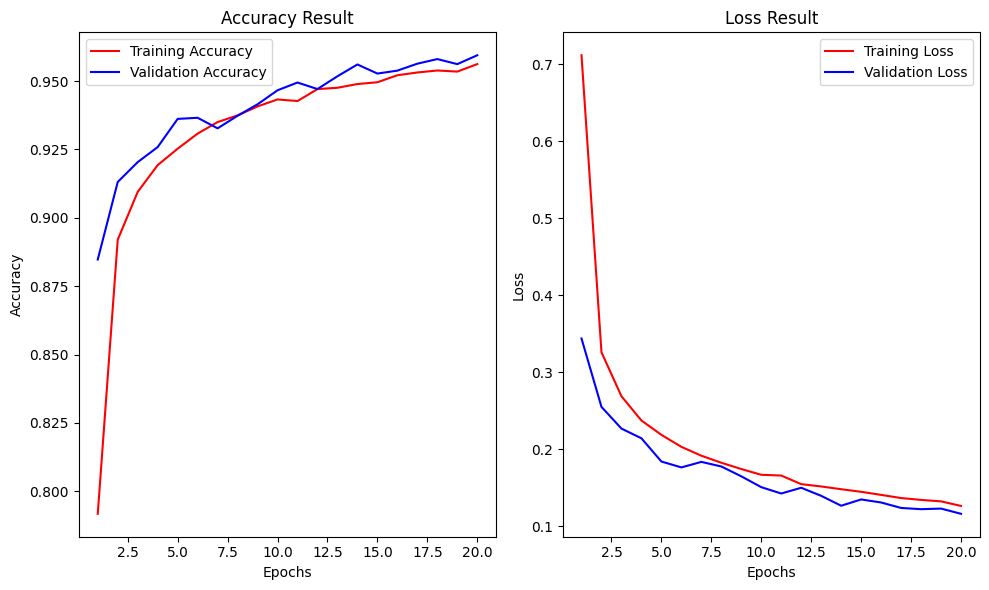

In [37]:
# Plotting results
epochs = range(1, len(history['train_loss']) + 1)
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs, history['train_acc'], 'r', label='Training Accuracy')
plt.plot(epochs, history['valid_acc'], 'b', label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Result')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, history['train_loss'], 'r', label='Training Loss')
plt.plot(epochs, history['valid_loss'], 'b', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Result')
plt.legend()

plt.tight_layout()
plt.show()


In [39]:
# Evaluate the model
def evaluate(model, data_loader):
    model.eval()
    running_loss = 0.0
    corrects = 0
    total = 0
    all_labels = []
    all_preds = []
    
    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            corrects += torch.sum(preds == labels.data)
            total += labels.size(0)
            
            # Collect all labels and predictions for classification report
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
    
    avg_loss = running_loss / len(data_loader.dataset)
    accuracy = corrects.double() / total
    
    return avg_loss, accuracy, all_labels, all_preds

# Evaluate on the training set
train_loss, train_acc, train_labels, train_preds = evaluate(model, train_loader)
print(f'Training Loss: {train_loss:.4f} Accuracy: {train_acc:.4f}')

# Evaluate on the validation set
valid_loss, valid_acc, valid_labels, valid_preds = evaluate(model, valid_loader)
print(f'Validation Loss: {valid_loss:.4f} Accuracy: {valid_acc:.4f}')

Training Loss: 0.0969 Accuracy: 0.9659
Validation Loss: 0.1121 Accuracy: 0.9598


In [41]:
# Generate classification report for training set
class_names = train_dataset.classes
print("Training Set Classification Report:")
print(classification_report(train_labels, train_preds, target_names=class_names))

Training Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.97      0.99      0.98      2016
                                 Apple___Black_rot       0.99      0.98      0.99      1987
                          Apple___Cedar_apple_rust       1.00      1.00      1.00      1760
                                   Apple___healthy       1.00      0.98      0.99      2008
                    Cauliflower_Bacterial spot rot       0.99      0.99      0.99       173
                             Cauliflower_Black Rot       0.99      0.83      0.90       100
                          Cauliflower_Downy Mildew       0.87      0.97      0.91       177
                               Cauliflower_Healthy       0.99      1.00      0.99       206
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.97      0.94      0.95      2729
                       Corn_(maize)___Commo

In [43]:
# Generate classification report for validation set
print("Validation Set Classification Report:")
print(classification_report(valid_labels, valid_preds, target_names=class_names))

Validation Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.97      0.99      0.98       504
                                 Apple___Black_rot       0.99      0.98      0.99       497
                          Apple___Cedar_apple_rust       1.00      1.00      1.00       440
                                   Apple___healthy       0.99      0.98      0.98       502
                    Cauliflower_Bacterial spot rot       0.98      0.98      0.98        93
                             Cauliflower_Black Rot       1.00      0.93      0.96        70
                          Cauliflower_Downy Mildew       0.88      0.98      0.93        95
                               Cauliflower_Healthy       0.97      0.99      0.98       104
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.96      0.94      0.95       820
                       Corn_(maize)___Com

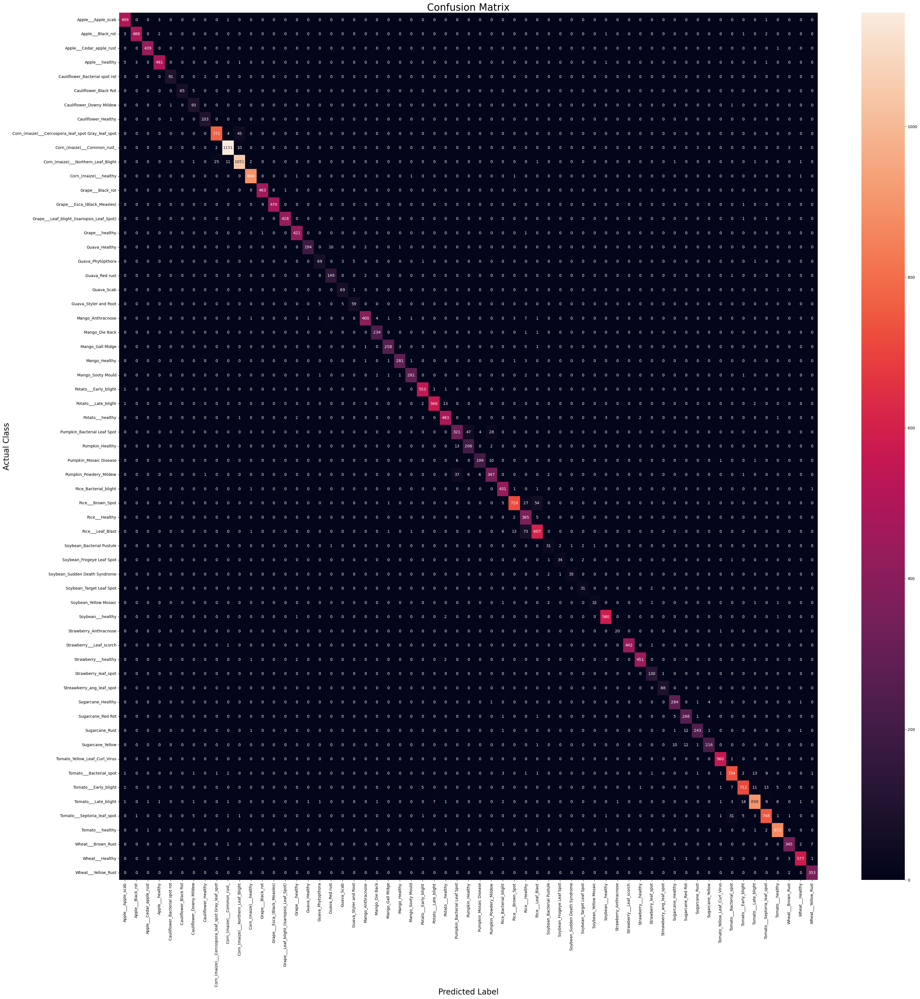

In [45]:
# Generate confusion matrix
cm = confusion_matrix(valid_labels, valid_preds, labels=range(len(class_names)))
plt.figure(figsize=(40, 40))
sns.heatmap(cm, annot=True, fmt='d', annot_kws={'size': 10}, xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label', fontsize=20)
plt.ylabel("Actual Class", fontsize=20)
plt.title('Confusion Matrix', fontsize=25)
plt.show()

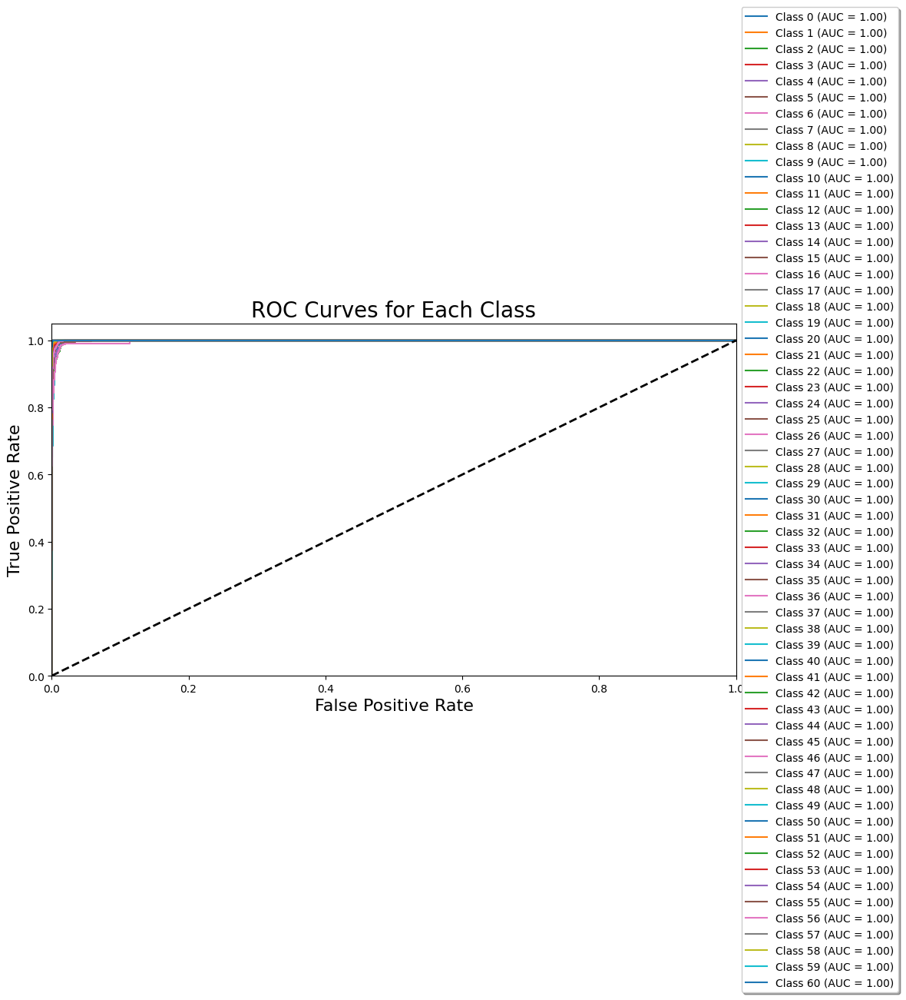

In [49]:
# Plot ROC curves
def plot_roc_curves(model, data_loader, num_classes):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # Get probabilities
            probs = torch.nn.functional.softmax(outputs, dim=1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(probs.cpu().numpy())

    # Binarize the labels
    y_true = label_binarize(all_labels, classes=range(num_classes))
    y_score = np.array(all_preds)

    # Compute ROC curves and ROC AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(14, 10))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curves for Each Class', fontsize=20)

    # Position the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fancybox=True, shadow=True, ncol=1)
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for legend

    plt.show()

# Plot ROC curves for the validation set
plot_roc_curves(model, valid_loader, len(class_names))


C:\Users\ACER\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ACER\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\ACER\AppData\Local\Temp\ipykernel_15888\2932440252.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.

Test Loss: 0.0676 Accuracy: 0.9770
Test Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      1.00      1.00         5
                                 Apple___Black_rot       1.00      1.00      1.00         5
                          Apple___Cedar_apple_rust       1.00      1.00      1.00         5
                                   Apple___healthy       1.00      1.00      1.00         5
                    Cauliflower_Bacterial spot rot       1.00      1.00      1.00         5
                             Cauliflower_Black Rot       1.00      1.00      1.00         5
                          Cauliflower_Downy Mildew       1.00      1.00      1.00         5
                               Cauliflower_Healthy       1.00      1.00      1.00         5
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       1.00      1.00      1.00         5
            

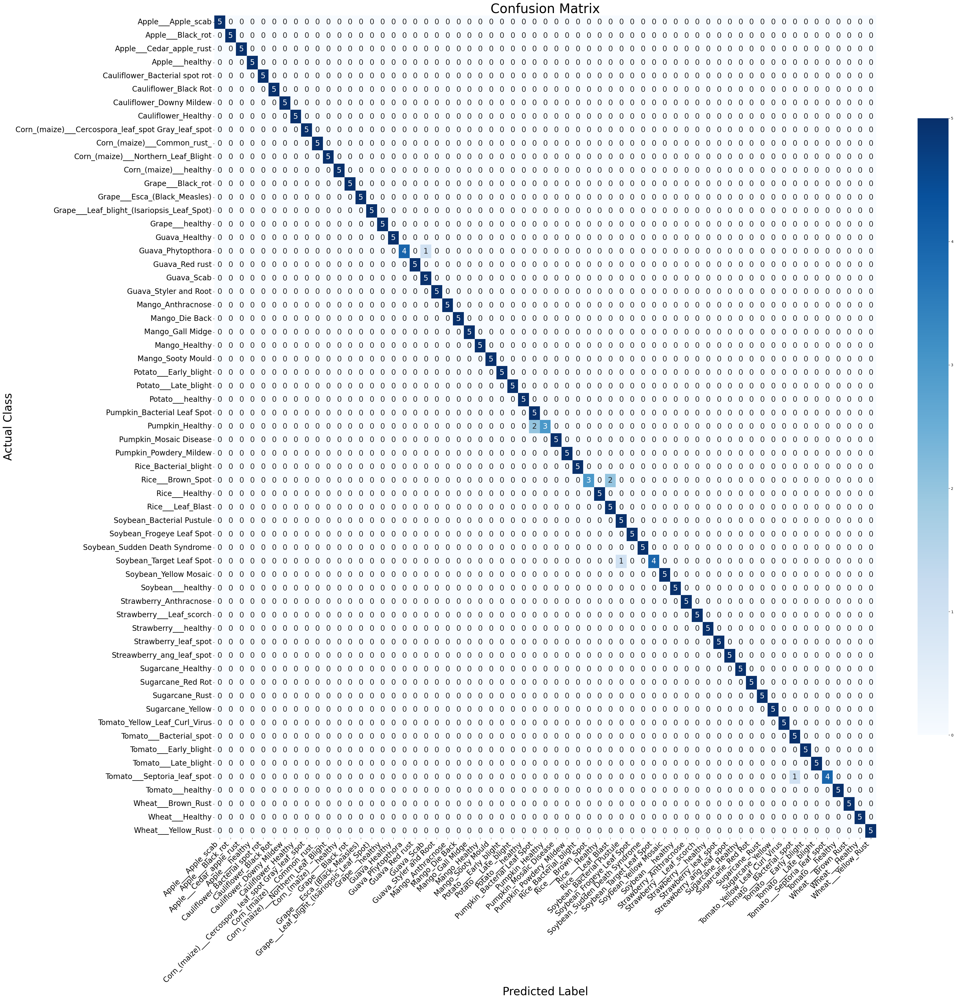

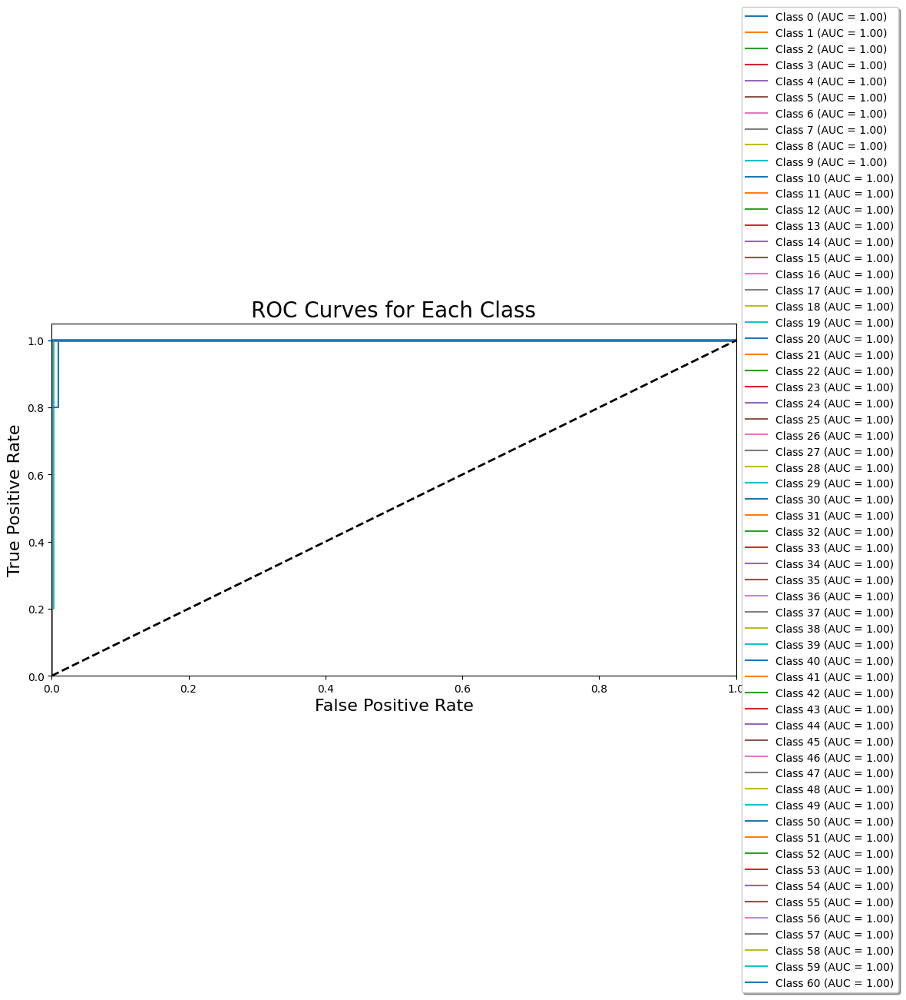

In [61]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the criterion
criterion = nn.CrossEntropyLoss()

# Load the test dataset
test_transform = transforms.Compose([
    transforms.Resize(128),
    transforms.CenterCrop(128),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/test/', transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=8, pin_memory=True)

# Load the ResNet50 model
model = models.resnet50(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, len(test_dataset.classes))
model.load_state_dict(torch.load('resnet50.pth'))
model = model.to(device)

# Evaluate the model on the test set
def evaluate(model, data_loader):
    model.eval()
    running_loss = 0.0
    corrects = 0
    total = 0
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            corrects += torch.sum(preds == labels.data)
            total += labels.size(0)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    avg_loss = running_loss / len(data_loader.dataset)
    accuracy = corrects.double() / total

    return avg_loss, accuracy, all_labels, all_preds

# Evaluate on the test set
test_loss, test_acc, test_labels, test_preds = evaluate(model, test_loader)
print(f'Test Loss: {test_loss:.4f} Accuracy: {test_acc:.4f}')

# Generate classification report for the test set
class_names = test_dataset.classes
print("Test Set Classification Report:")
print(classification_report(test_labels, test_preds, target_names=class_names, zero_division=0))

# Generate confusion matrix
cm = confusion_matrix(test_labels, test_preds, labels=range(len(class_names)))

plt.figure(figsize=(40, 40))  # Increase the figure size for better readability
sns.heatmap(cm, annot=True, fmt='d', annot_kws={'size': 20}, cmap="Blues", 
            xticklabels=class_names, yticklabels=class_names, cbar_kws={'shrink': 0.75})
plt.xlabel('Predicted Label', fontsize=30)
plt.ylabel("Actual Class", fontsize=30)
plt.title('Confusion Matrix', fontsize=35)
plt.xticks(fontsize=20, rotation=45, ha="right")  # Rotate x-axis labels for better readability
plt.yticks(fontsize=20, rotation=0)  # Keep y-axis labels horizontal
plt.show()

# Define the plot_roc_curves function
def plot_roc_curves(model, data_loader, num_classes):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # Get probabilities
            probs = torch.nn.functional.softmax(outputs, dim=1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(probs.cpu().numpy())

    # Binarize the labels
    y_true = label_binarize(all_labels, classes=range(num_classes))
    y_score = np.array(all_preds)

    # Compute ROC curves and ROC AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(14, 10))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curves for Each Class', fontsize=20)

    # Position the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fancybox=True, shadow=True, ncol=1)
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for legend

    plt.show()

# Plot ROC curves for the test set
plot_roc_curves(model, test_loader, len(class_names))


### VGG16 Model

In [72]:
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import torch.backends.cudnn as cudnn
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models
from torch.utils.data import DataLoader
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import seaborn as sns
import numpy as np

In [74]:
# Define the VGG16 model
model = models.vgg16(pretrained=True)
model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(train_dataset.classes))

In [76]:
# Move model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device.type == 'cuda':
    print(f"Using GPU: {torch.cuda.get_device_name(0)}")
else:
    print("Using CPU")
model = model.to(device)

Using GPU: NVIDIA GeForce RTX 4060 Laptop GPU


In [18]:
# device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
# # Set device
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# # model.to(device)

In [78]:
# Define transformations for data augmentation and normalization
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.RandomResizedCrop(128),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load datasets
train_dataset = torchvision.datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/train/', transform=transform)
valid_dataset = torchvision.datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/valid/', transform=transform)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=8, pin_memory=True)
valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=16, shuffle=False, num_workers=8, pin_memory=True)

In [33]:
# # Wrap model with DataParallel if more than one GPU is available
# if torch.cuda.device_count() > 1:
#     model = nn.DataParallel(model)

# model.to(device)

In [22]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm

# Assuming the model is already defined as VGG16 with pretrained=True
# Unfreeze more layers for fine-tuning
for param in model.features[:10].parameters():
    param.requires_grad = False

# Define criterion and optimizer with a different optimizer and learning rate scheduler
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(filter(lambda p: p.requires_grad, model.parameters()), lr=0.001, momentum=0.9, weight_decay=1e-4)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3)

# Gradient accumulation settings
accumulation_steps = 4

# Updated Mixed Precision Training Setup
scaler = torch.amp.GradScaler()

# Function to print current learning rate
def print_lr(optimizer):
    for param_group in optimizer.param_groups:
        print(f"Current learning rate: {param_group['lr']}")

# Train the model with real-time progress updates
def train_model(model, train_loader, valid_loader, criterion, optimizer, scheduler, num_epochs=20):
    history = {'train_loss': [], 'valid_loss': [], 'train_acc': [], 'valid_acc': []}
    
    for epoch in range(num_epochs):
        # Training Phase
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        for i, (images, labels) in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")):
            images, labels = images.to(device), labels.to(device)
            
            optimizer.zero_grad()  # Reset gradients
            
            # Mixed precision forward pass
            with torch.amp.autocast(device_type='cuda'):  # Specify 'cuda' for GPU
                outputs = model(images)
                loss = criterion(outputs, labels)
                
            # Scaled backward pass
            scaler.scale(loss).backward()
            
            if (i + 1) % accumulation_steps == 0:
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad()
            
            # Statistics
            running_loss += loss.item() * accumulation_steps
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
        epoch_loss = running_loss / len(train_loader)
        epoch_acc = correct / total
        
        # Validation Phase
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for images, labels in valid_loader:
                images, labels = images.to(device), labels.to(device)
                with torch.amp.autocast(device_type='cuda'):  # Specify 'cuda' for GPU
                    outputs = model(images)
                    loss = criterion(outputs, labels)
                    val_loss += loss.item()
                    
                    _, predicted = torch.max(outputs.data, 1)
                    val_total += labels.size(0)
                    val_correct += (predicted == labels).sum().item()
        
        val_loss /= len(valid_loader)
        val_acc = val_correct / val_total
        
        # Save history
        history['train_loss'].append(epoch_loss)
        history['valid_loss'].append(val_loss)
        history['train_acc'].append(epoch_acc)
        history['valid_acc'].append(val_acc)
        
        # Adjust learning rate and print it
        scheduler.step(val_loss)
        print_lr(optimizer)
        
        # Print the full summary for the epoch
        print(f"\nEpoch [{epoch+1}/{num_epochs}] - "
              f"Train Loss: {epoch_loss:.4f}, Train Accuracy: {epoch_acc:.4f}, "
              f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}")
    
    return history

# Train the model
#history = train_model(model, train_loader, valid_loader, criterion, optimizer, scheduler, num_epochs=10)


In [26]:
# Train the model
history = train_model(model, train_loader, valid_loader, criterion, optimizer, scheduler, num_epochs=20)

Epoch 1/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:46<00:00, 12.36it/s]


Current learning rate: 0.001

Epoch [1/20] - Train Loss: 5.7152, Train Accuracy: 0.5803, Validation Loss: 0.9708, Validation Accuracy: 0.6975


Epoch 2/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:42<00:00, 12.48it/s]


Current learning rate: 0.001

Epoch [2/20] - Train Loss: 3.2306, Train Accuracy: 0.7420, Validation Loss: 0.6828, Validation Accuracy: 0.7836


Epoch 3/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:51<00:00, 12.21it/s]


Current learning rate: 0.001

Epoch [3/20] - Train Loss: 2.6732, Train Accuracy: 0.7840, Validation Loss: 0.5843, Validation Accuracy: 0.8145


Epoch 4/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:43<00:00, 12.45it/s]


Current learning rate: 0.001

Epoch [4/20] - Train Loss: 2.3100, Train Accuracy: 0.8139, Validation Loss: 0.6021, Validation Accuracy: 0.8015


Epoch 5/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:50<00:00, 12.23it/s]


Current learning rate: 0.001

Epoch [5/20] - Train Loss: 2.0511, Train Accuracy: 0.8342, Validation Loss: 0.4925, Validation Accuracy: 0.8357


Epoch 6/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:57<00:00, 12.03it/s]


Current learning rate: 0.001

Epoch [6/20] - Train Loss: 1.8926, Train Accuracy: 0.8438, Validation Loss: 0.4586, Validation Accuracy: 0.8482


Epoch 7/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:40<00:00, 12.54it/s]


Current learning rate: 0.001

Epoch [7/20] - Train Loss: 1.8076, Train Accuracy: 0.8531, Validation Loss: 0.4264, Validation Accuracy: 0.8578


Epoch 8/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:24<00:00, 13.05it/s]


Current learning rate: 0.001

Epoch [8/20] - Train Loss: 1.7207, Train Accuracy: 0.8575, Validation Loss: 0.3927, Validation Accuracy: 0.8696


Epoch 9/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:14<00:00, 13.41it/s]


Current learning rate: 0.001

Epoch [9/20] - Train Loss: 1.6272, Train Accuracy: 0.8643, Validation Loss: 0.3788, Validation Accuracy: 0.8726


Epoch 10/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:11<00:00, 13.53it/s]


Current learning rate: 0.001

Epoch [10/20] - Train Loss: 1.5442, Train Accuracy: 0.8728, Validation Loss: 0.3896, Validation Accuracy: 0.8694


Epoch 11/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:20<00:00, 13.18it/s]


Current learning rate: 0.001

Epoch [11/20] - Train Loss: 1.4904, Train Accuracy: 0.8769, Validation Loss: 0.3446, Validation Accuracy: 0.8849


Epoch 12/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:18<00:00, 13.28it/s]


Current learning rate: 0.001

Epoch [12/20] - Train Loss: 1.4059, Train Accuracy: 0.8828, Validation Loss: 0.3576, Validation Accuracy: 0.8792


Epoch 13/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:21<00:00, 13.16it/s]


Current learning rate: 0.001

Epoch [13/20] - Train Loss: 1.3842, Train Accuracy: 0.8838, Validation Loss: 0.3734, Validation Accuracy: 0.8750


Epoch 14/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:17<00:00, 13.30it/s]


Current learning rate: 0.001

Epoch [14/20] - Train Loss: 1.3119, Train Accuracy: 0.8900, Validation Loss: 0.3261, Validation Accuracy: 0.8869


Epoch 15/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:07<00:00, 13.68it/s]


Current learning rate: 0.001

Epoch [15/20] - Train Loss: 1.2982, Train Accuracy: 0.8917, Validation Loss: 0.3161, Validation Accuracy: 0.8937


Epoch 16/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:13<00:00, 13.44it/s]


Current learning rate: 0.001

Epoch [16/20] - Train Loss: 1.2503, Train Accuracy: 0.8958, Validation Loss: 0.3071, Validation Accuracy: 0.8951


Epoch 17/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:15<00:00, 13.38it/s]


Current learning rate: 0.001

Epoch [17/20] - Train Loss: 1.2352, Train Accuracy: 0.8951, Validation Loss: 0.2931, Validation Accuracy: 0.8996


Epoch 18/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:12<00:00, 13.49it/s]


Current learning rate: 0.001

Epoch [18/20] - Train Loss: 1.2066, Train Accuracy: 0.8976, Validation Loss: 0.2967, Validation Accuracy: 0.8990


Epoch 19/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:33<00:00, 12.75it/s]


Current learning rate: 0.001

Epoch [19/20] - Train Loss: 1.1610, Train Accuracy: 0.9025, Validation Loss: 0.3023, Validation Accuracy: 0.8980


Epoch 20/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:41<00:00, 12.50it/s]


Current learning rate: 0.001

Epoch [20/20] - Train Loss: 1.1338, Train Accuracy: 0.9039, Validation Loss: 0.2926, Validation Accuracy: 0.9034


In [28]:
# Save the model
torch.save(model.state_dict(), 'vgg16.pth')
print("Model saved as vgg16.pth")

Model saved as vgg16.pth


In [80]:
import torch
import torch.nn as nn
from torchinfo import summary
from torchvision import models

# Define the VGG16 model
model = models.vgg16(pretrained=True)
model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(train_dataset.classes))

# Example batch size
batch_size = 16

# Use the summary function to print the model summary
summary(model, input_size=(batch_size, 3, 224, 224))


Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      [16, 61]                  --
├─Sequential: 1-1                        [16, 512, 7, 7]           --
│    └─Conv2d: 2-1                       [16, 64, 224, 224]        1,792
│    └─ReLU: 2-2                         [16, 64, 224, 224]        --
│    └─Conv2d: 2-3                       [16, 64, 224, 224]        36,928
│    └─ReLU: 2-4                         [16, 64, 224, 224]        --
│    └─MaxPool2d: 2-5                    [16, 64, 112, 112]        --
│    └─Conv2d: 2-6                       [16, 128, 112, 112]       73,856
│    └─ReLU: 2-7                         [16, 128, 112, 112]       --
│    └─Conv2d: 2-8                       [16, 128, 112, 112]       147,584
│    └─ReLU: 2-9                         [16, 128, 112, 112]       --
│    └─MaxPool2d: 2-10                   [16, 128, 56, 56]         --
│    └─Conv2d: 2-11                      [16, 256, 56, 56]         29

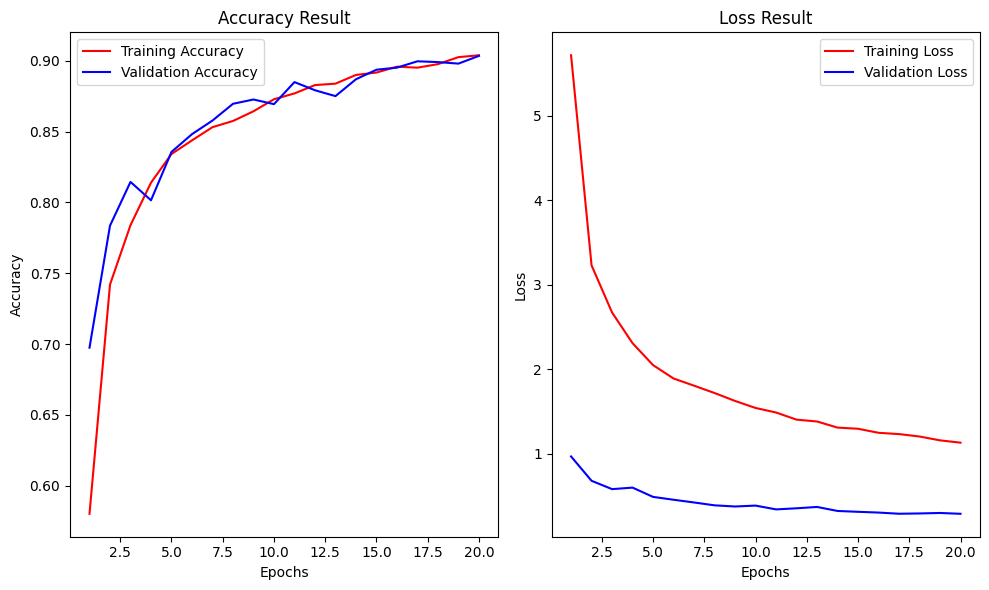

In [30]:
# Plotting results
epochs = range(1, len(history['train_loss']) + 1)
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs, history['train_acc'], 'r', label='Training Accuracy')
plt.plot(epochs, history['valid_acc'], 'b', label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Result')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, history['train_loss'], 'r', label='Training Loss')
plt.plot(epochs, history['valid_loss'], 'b', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Result')
plt.legend()

plt.tight_layout()
plt.show()

In [32]:
# Evaluate the model
def evaluate(model, data_loader):
    model.eval()
    running_loss = 0.0
    corrects = 0
    total = 0
    all_labels = []
    all_preds = []
    
    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            corrects += torch.sum(preds == labels.data)
            total += labels.size(0)
            
            # Collect all labels and predictions for classification report
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
    
    avg_loss = running_loss / len(data_loader.dataset)
    accuracy = corrects.double() / total
    
    return avg_loss, accuracy, all_labels, all_preds

# Evaluate on the training set
train_loss, train_acc, train_labels, train_preds = evaluate(model, train_loader)
print(f'Training Loss: {train_loss:.4f} Accuracy: {train_acc:.4f}')

# Evaluate on the validation set
valid_loss, valid_acc, valid_labels, valid_preds = evaluate(model, valid_loader)
print(f'Validation Loss: {valid_loss:.4f} Accuracy: {valid_acc:.4f}')

Training Loss: 0.2518 Accuracy: 0.9150
Validation Loss: 0.2919 Accuracy: 0.9035


In [34]:
# Generate classification report for training set
class_names = train_dataset.classes
print("Training Set Classification Report:")
print(classification_report(train_labels, train_preds, target_names=class_names))


Training Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.95      0.97      0.96      2016
                                 Apple___Black_rot       0.92      0.98      0.95      1987
                          Apple___Cedar_apple_rust       0.96      0.98      0.97      1760
                                   Apple___healthy       0.97      0.94      0.95      2008
                    Cauliflower_Bacterial spot rot       0.95      0.96      0.95       173
                             Cauliflower_Black Rot       0.90      0.92      0.91       100
                          Cauliflower_Downy Mildew       0.84      0.66      0.74       177
                               Cauliflower_Healthy       0.97      0.97      0.97       206
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.84      0.94      0.89      2729
                       Corn_(maize)___Commo

In [36]:
# Generate classification report for validation set
print("Validation Set Classification Report:")
print(classification_report(valid_labels, valid_preds, target_names=class_names))


Validation Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.95      0.97      0.96       504
                                 Apple___Black_rot       0.92      0.98      0.95       497
                          Apple___Cedar_apple_rust       0.95      0.98      0.97       440
                                   Apple___healthy       0.97      0.96      0.96       502
                    Cauliflower_Bacterial spot rot       0.95      0.95      0.95        93
                             Cauliflower_Black Rot       0.92      0.86      0.89        70
                          Cauliflower_Downy Mildew       0.85      0.64      0.73        95
                               Cauliflower_Healthy       0.94      0.96      0.95       104
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.85      0.94      0.89       820
                       Corn_(maize)___Com

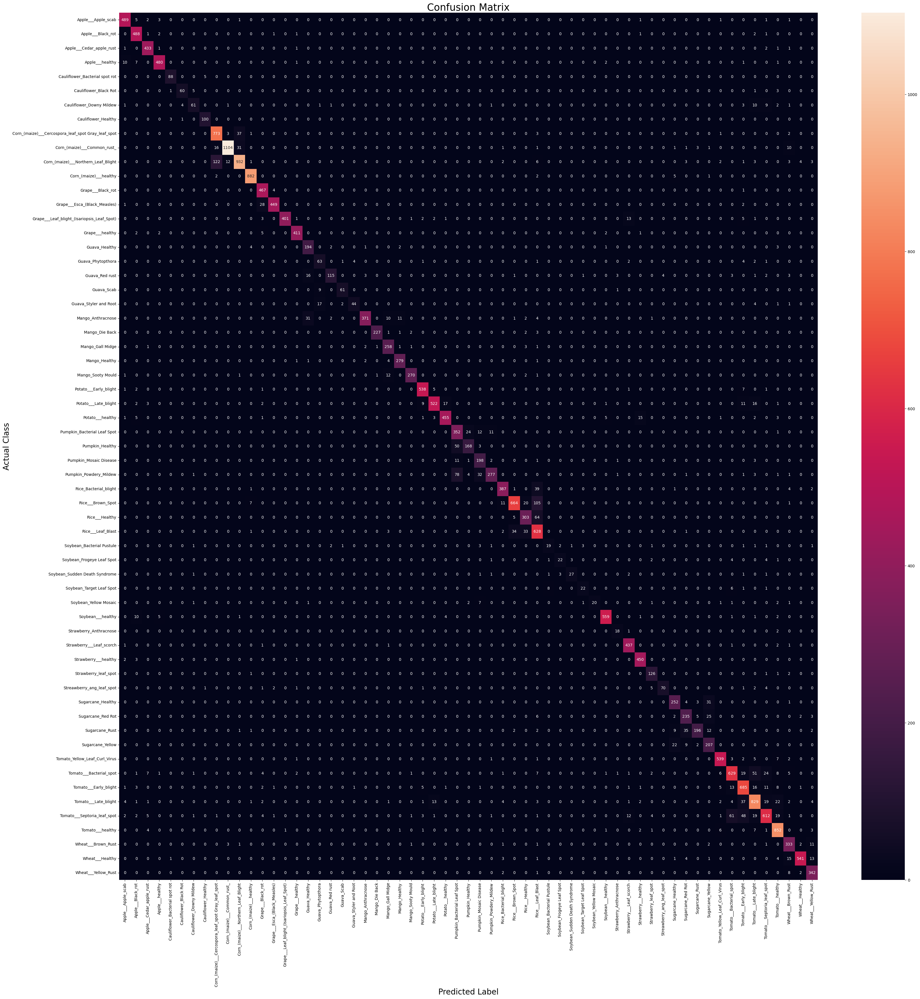

In [38]:
# Generate confusion matrix
cm = confusion_matrix(valid_labels, valid_preds, labels=range(len(class_names)))
plt.figure(figsize=(40, 40))
sns.heatmap(cm, annot=True, fmt='d', annot_kws={'size': 10}, xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label', fontsize=20)
plt.ylabel("Actual Class", fontsize=20)
plt.title('Confusion Matrix', fontsize=25)
plt.show()


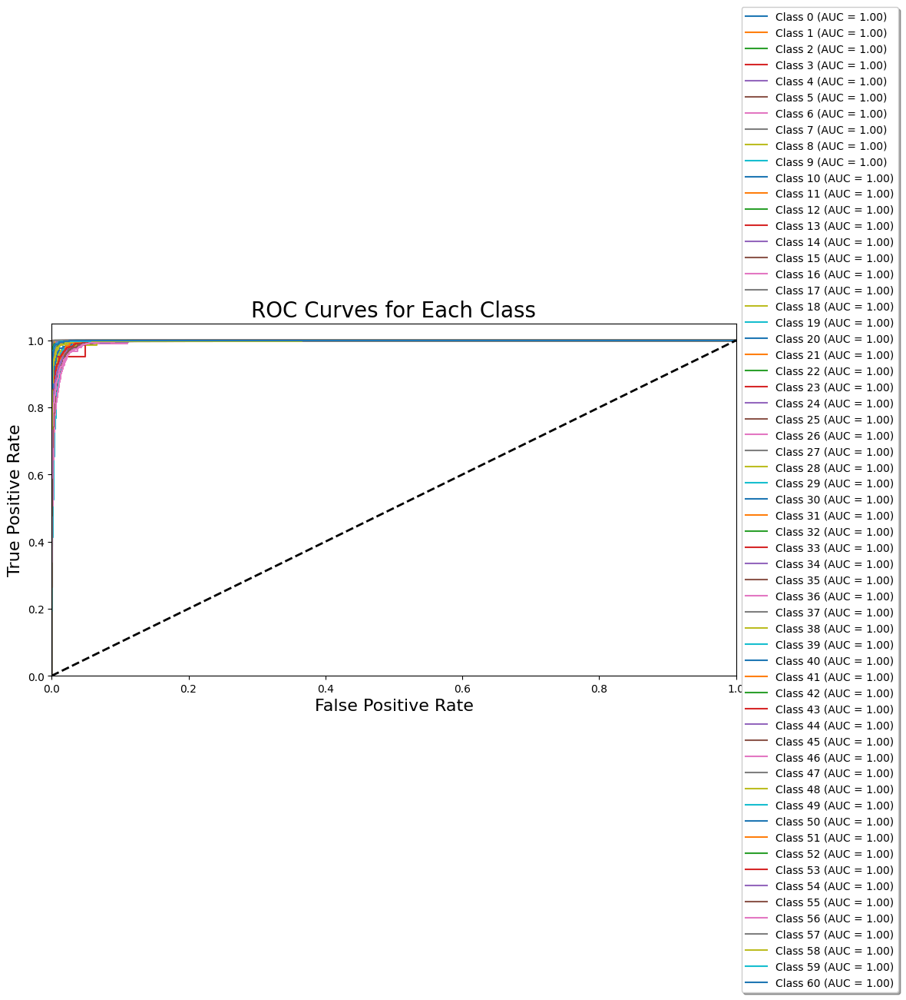

In [59]:
# Plot ROC curves
def plot_roc_curves(model, data_loader, num_classes):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # Get probabilities
            probs = torch.nn.functional.softmax(outputs, dim=1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(probs.cpu().numpy())

    # Binarize the labels
    y_true = label_binarize(all_labels, classes=range(num_classes))
    y_score = np.array(all_preds)

    # Compute ROC curves and ROC AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(14, 10))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curves for Each Class', fontsize=20)

    # Position the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fancybox=True, shadow=True, ncol=1)
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for legend

    plt.show()

# Plot ROC curves for the validation set
plot_roc_curves(model, valid_loader, len(class_names))


C:\Users\ACER\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ACER\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\ACER\AppData\Local\Temp\ipykernel_15888\73261710.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pyto

Test Loss: 0.3356 Accuracy: 0.8787
Test Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      1.00      1.00         5
                                 Apple___Black_rot       1.00      1.00      1.00         5
                          Apple___Cedar_apple_rust       1.00      1.00      1.00         5
                                   Apple___healthy       1.00      1.00      1.00         5
                    Cauliflower_Bacterial spot rot       1.00      1.00      1.00         5
                             Cauliflower_Black Rot       1.00      0.80      0.89         5
                          Cauliflower_Downy Mildew       1.00      1.00      1.00         5
                               Cauliflower_Healthy       1.00      1.00      1.00         5
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       1.00      0.80      0.89         5
            

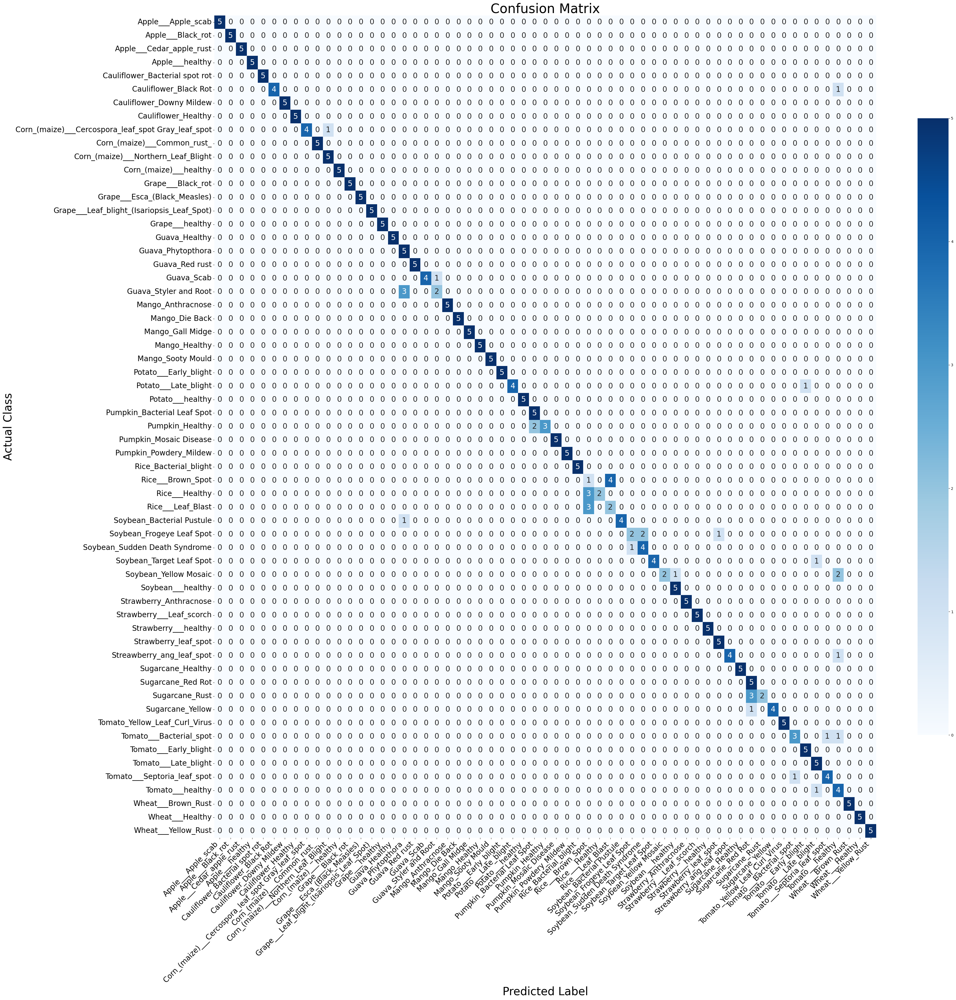

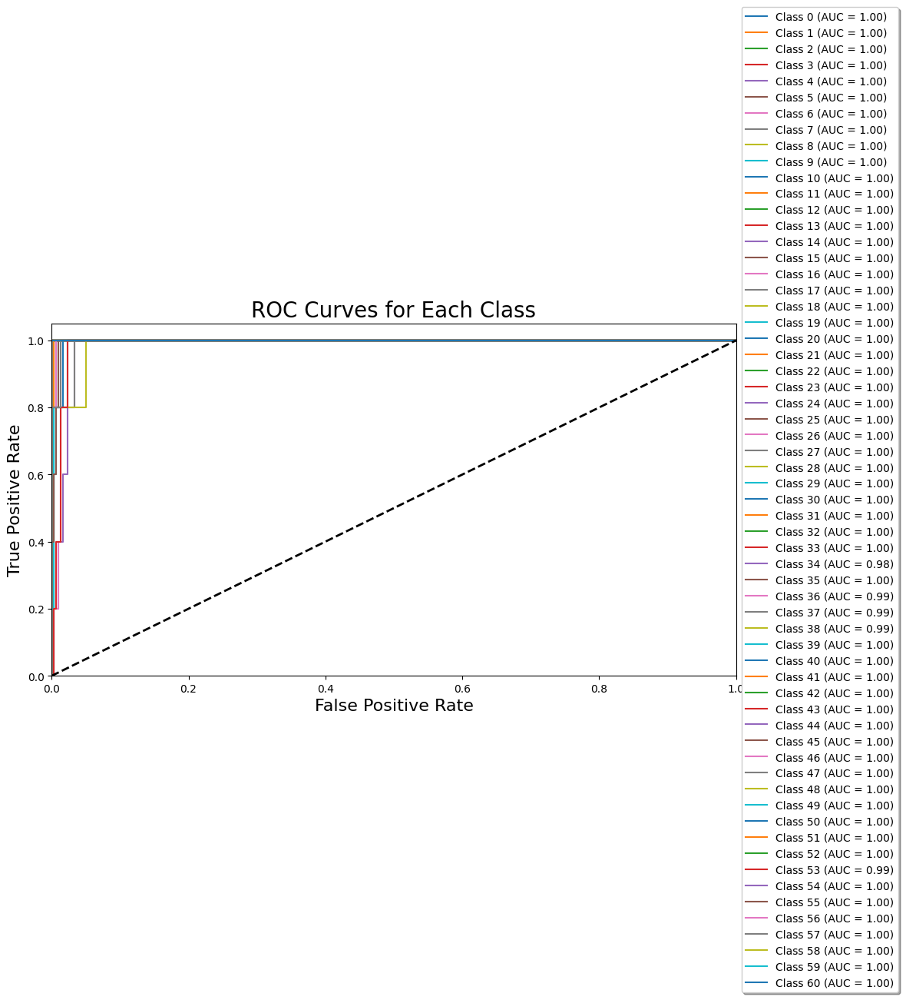

In [59]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the criterion
criterion = nn.CrossEntropyLoss()

# Load the test dataset
test_transform = transforms.Compose([
    transforms.Resize(128),
    transforms.CenterCrop(128),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/test/', transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=8, pin_memory=True)

# Load the VGG16 model
model = models.vgg16(pretrained=True)
model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(test_dataset.classes))
model.load_state_dict(torch.load('vgg16.pth'))
model = model.to(device)

# Evaluate the model on the test set
def evaluate(model, data_loader):
    model.eval()
    running_loss = 0.0
    corrects = 0
    total = 0
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            corrects += torch.sum(preds == labels.data)
            total += labels.size(0)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    avg_loss = running_loss / len(data_loader.dataset)
    accuracy = corrects.double() / total

    return avg_loss, accuracy, all_labels, all_preds

# Evaluate on the test set
test_loss, test_acc, test_labels, test_preds = evaluate(model, test_loader)
print(f'Test Loss: {test_loss:.4f} Accuracy: {test_acc:.4f}')

# Generate classification report for the test set
class_names = test_dataset.classes
print("Test Set Classification Report:")
print(classification_report(test_labels, test_preds, target_names=class_names, zero_division=0))

# Generate confusion matrix
cm = confusion_matrix(test_labels, test_preds, labels=range(len(class_names)))

plt.figure(figsize=(40, 40))  # Increase the figure size for better readability
sns.heatmap(cm, annot=True, fmt='d', annot_kws={'size': 20}, cmap="Blues", 
            xticklabels=class_names, yticklabels=class_names, cbar_kws={'shrink': 0.75})
plt.xlabel('Predicted Label', fontsize=30)
plt.ylabel("Actual Class", fontsize=30)
plt.title('Confusion Matrix', fontsize=35)
plt.xticks(fontsize=20, rotation=45, ha="right")  # Rotate x-axis labels for better readability
plt.yticks(fontsize=20, rotation=0)  # Keep y-axis labels horizontal
plt.show()

# Define the plot_roc_curves function
def plot_roc_curves(model, data_loader, num_classes):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # Get probabilities
            probs = torch.nn.functional.softmax(outputs, dim=1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(probs.cpu().numpy())

    # Binarize the labels
    y_true = label_binarize(all_labels, classes=range(num_classes))
    y_score = np.array(all_preds)

    # Compute ROC curves and ROC AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(14, 10))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curves for Each Class', fontsize=20)

    # Position the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fancybox=True, shadow=True, ncol=1)
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for legend

    plt.show()

# Plot ROC curves for the test set
plot_roc_curves(model, test_loader, len(class_names))


### VGG19 Model

In [26]:
# device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
# # Set device
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# # model.to(device)

In [82]:
# Define the VGG19 model
model = models.vgg19(pretrained=True)
model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(train_dataset.classes))

C:\Users\ACER\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [84]:
# Move model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device.type == 'cuda':
    print(f"Using GPU: {torch.cuda.get_device_name(0)}")
else:
    print("Using CPU")
model = model.to(device)

Using GPU: NVIDIA GeForce RTX 4060 Laptop GPU


In [86]:
# Define transformations for data augmentation and normalization
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.RandomResizedCrop(128),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load datasets
train_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/train/', transform=transform)
valid_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/valid/', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=8, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=16, shuffle=False, num_workers=8, pin_memory=True)

In [27]:
# # Wrap model with DataParallel if more than one GPU is available
# if torch.cuda.device_count() > 1:
#     model = nn.DataParallel(model)

# model.to(device)

In [31]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm

# Unfreeze more layers for fine-tuning
for param in model.features[:10].parameters():
    param.requires_grad = False

# Define criterion and optimizer with a different optimizer and learning rate scheduler
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(filter(lambda p: p.requires_grad, model.parameters()), lr=0.001, momentum=0.9, weight_decay=1e-4)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3)

# Gradient accumulation settings
accumulation_steps = 4

# Updated Mixed Precision Training Setup
scaler = torch.amp.GradScaler()

# Function to print current learning rate
def print_lr(optimizer):
    for param_group in optimizer.param_groups:
        print(f"Current learning rate: {param_group['lr']}")

# Train the model with real-time progress updates
def train_model(model, train_loader, valid_loader, criterion, optimizer, scheduler, num_epochs=20):
    history = {'train_loss': [], 'valid_loss': [], 'train_acc': [], 'valid_acc': []}
    
    for epoch in range(num_epochs):
        # Training Phase
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        for i, (images, labels) in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")):
            images, labels = images.to(device), labels.to(device)
            
            optimizer.zero_grad()  # Reset gradients
            
            # Mixed precision forward pass
            with torch.amp.autocast(device_type='cuda'):  # Specify 'cuda' for GPU
                outputs = model(images)
                loss = criterion(outputs, labels)
                
            # Scaled backward pass
            scaler.scale(loss).backward()
            
            if (i + 1) % accumulation_steps == 0:
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad()
            
            # Statistics
            running_loss += loss.item() * accumulation_steps
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
        epoch_loss = running_loss / len(train_loader)
        epoch_acc = correct / total
        
        # Validation Phase
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for images, labels in valid_loader:
                images, labels = images.to(device), labels.to(device)
                with torch.amp.autocast(device_type='cuda'):  # Specify 'cuda' for GPU
                    outputs = model(images)
                    loss = criterion(outputs, labels)
                    val_loss += loss.item()
                    
                    _, predicted = torch.max(outputs.data, 1)
                    val_total += labels.size(0)
                    val_correct += (predicted == labels).sum().item()
        
        val_loss /= len(valid_loader)
        val_acc = val_correct / val_total
        
        # Save history
        history['train_loss'].append(epoch_loss)
        history['valid_loss'].append(val_loss)
        history['train_acc'].append(epoch_acc)
        history['valid_acc'].append(val_acc)
        
        # Adjust learning rate and print it
        scheduler.step(val_loss)
        print_lr(optimizer)
        
        # Print the full summary for the epoch
        print(f"\nEpoch [{epoch+1}/{num_epochs}] - "
              f"Train Loss: {epoch_loss:.4f}, Train Accuracy: {epoch_acc:.4f}, "
              f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}")
    
    return history

# Train the model
#history = train_model(model, train_loader, valid_loader, criterion, optimizer, scheduler, num_epochs=10)


In [35]:
# Train the model
history = train_model(model, train_loader, valid_loader, criterion, optimizer, scheduler, num_epochs=20)

Epoch 1/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:40<00:00, 12.55it/s]


Current learning rate: 0.001

Epoch [1/20] - Train Loss: 5.8822, Train Accuracy: 0.5698, Validation Loss: 0.9054, Validation Accuracy: 0.7103


Epoch 2/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:48<00:00, 12.28it/s]


Current learning rate: 0.001

Epoch [2/20] - Train Loss: 3.3226, Train Accuracy: 0.7383, Validation Loss: 0.7567, Validation Accuracy: 0.7599


Epoch 3/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:49<00:00, 12.27it/s]


Current learning rate: 0.001

Epoch [3/20] - Train Loss: 2.7267, Train Accuracy: 0.7822, Validation Loss: 0.6012, Validation Accuracy: 0.8042


Epoch 4/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:41<00:00, 12.50it/s]


Current learning rate: 0.001

Epoch [4/20] - Train Loss: 2.3855, Train Accuracy: 0.8081, Validation Loss: 0.5573, Validation Accuracy: 0.8158


Epoch 5/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:39<00:00, 12.58it/s]


Current learning rate: 0.001

Epoch [5/20] - Train Loss: 2.1559, Train Accuracy: 0.8250, Validation Loss: 0.5401, Validation Accuracy: 0.8192


Epoch 6/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:36<00:00, 12.65it/s]


Current learning rate: 0.001

Epoch [6/20] - Train Loss: 1.9602, Train Accuracy: 0.8403, Validation Loss: 0.4793, Validation Accuracy: 0.8406


Epoch 7/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:48<00:00, 12.28it/s]


Current learning rate: 0.001

Epoch [7/20] - Train Loss: 1.8512, Train Accuracy: 0.8486, Validation Loss: 0.4742, Validation Accuracy: 0.8394


Epoch 8/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:48<00:00, 12.28it/s]


Current learning rate: 0.001

Epoch [8/20] - Train Loss: 1.7479, Train Accuracy: 0.8562, Validation Loss: 0.4402, Validation Accuracy: 0.8533


Epoch 9/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:51<00:00, 12.22it/s]


Current learning rate: 0.001

Epoch [9/20] - Train Loss: 1.6964, Train Accuracy: 0.8606, Validation Loss: 0.4237, Validation Accuracy: 0.8543


Epoch 10/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:45<00:00, 12.39it/s]


Current learning rate: 0.001

Epoch [10/20] - Train Loss: 1.5924, Train Accuracy: 0.8689, Validation Loss: 0.3888, Validation Accuracy: 0.8696


Epoch 11/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:52<00:00, 12.17it/s]


Current learning rate: 0.001

Epoch [11/20] - Train Loss: 1.5097, Train Accuracy: 0.8746, Validation Loss: 0.3613, Validation Accuracy: 0.8790


Epoch 12/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [07:03<00:00, 11.86it/s]


Current learning rate: 0.001

Epoch [12/20] - Train Loss: 1.4667, Train Accuracy: 0.8781, Validation Loss: 0.3654, Validation Accuracy: 0.8758


Epoch 13/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [07:02<00:00, 11.89it/s]


Current learning rate: 0.001

Epoch [13/20] - Train Loss: 1.4140, Train Accuracy: 0.8827, Validation Loss: 0.3111, Validation Accuracy: 0.8929


Epoch 14/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:59<00:00, 11.97it/s]


Current learning rate: 0.001

Epoch [14/20] - Train Loss: 1.3656, Train Accuracy: 0.8872, Validation Loss: 0.3384, Validation Accuracy: 0.8880


Epoch 15/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:57<00:00, 12.02it/s]


Current learning rate: 0.001

Epoch [15/20] - Train Loss: 1.3598, Train Accuracy: 0.8863, Validation Loss: 0.3664, Validation Accuracy: 0.8778


Epoch 16/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:57<00:00, 12.03it/s]


Current learning rate: 0.001

Epoch [16/20] - Train Loss: 1.2839, Train Accuracy: 0.8946, Validation Loss: 0.3433, Validation Accuracy: 0.8838


Epoch 17/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:47<00:00, 12.31it/s]


Current learning rate: 0.001

Epoch [17/20] - Train Loss: 1.2776, Train Accuracy: 0.8925, Validation Loss: 0.2931, Validation Accuracy: 0.8990


Epoch 18/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:41<00:00, 12.52it/s]


Current learning rate: 0.001

Epoch [18/20] - Train Loss: 1.2429, Train Accuracy: 0.8966, Validation Loss: 0.3155, Validation Accuracy: 0.8928


Epoch 19/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:52<00:00, 12.18it/s]


Current learning rate: 0.001

Epoch [19/20] - Train Loss: 1.2212, Train Accuracy: 0.8989, Validation Loss: 0.3249, Validation Accuracy: 0.8905


Epoch 20/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:39<00:00, 12.56it/s]


Current learning rate: 0.001

Epoch [20/20] - Train Loss: 1.2075, Train Accuracy: 0.8984, Validation Loss: 0.2947, Validation Accuracy: 0.8998


In [37]:
# Save the model
torch.save(model.state_dict(), 'vgg19.pth')
print("Model saved as vgg19.pth")

Model saved as vgg19.pth


In [88]:
import torch
import torch.nn as nn
from torchinfo import summary
from torchvision import models

# Define the VGG19 model
model = models.vgg19(pretrained=True)
model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(train_dataset.classes))

# Example batch size
batch_size = 16

# Use the summary function to print the model summary
summary(model, input_size=(batch_size, 3, 224, 224))


Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      [16, 61]                  --
├─Sequential: 1-1                        [16, 512, 7, 7]           --
│    └─Conv2d: 2-1                       [16, 64, 224, 224]        1,792
│    └─ReLU: 2-2                         [16, 64, 224, 224]        --
│    └─Conv2d: 2-3                       [16, 64, 224, 224]        36,928
│    └─ReLU: 2-4                         [16, 64, 224, 224]        --
│    └─MaxPool2d: 2-5                    [16, 64, 112, 112]        --
│    └─Conv2d: 2-6                       [16, 128, 112, 112]       73,856
│    └─ReLU: 2-7                         [16, 128, 112, 112]       --
│    └─Conv2d: 2-8                       [16, 128, 112, 112]       147,584
│    └─ReLU: 2-9                         [16, 128, 112, 112]       --
│    └─MaxPool2d: 2-10                   [16, 128, 56, 56]         --
│    └─Conv2d: 2-11                      [16, 256, 56, 56]         29

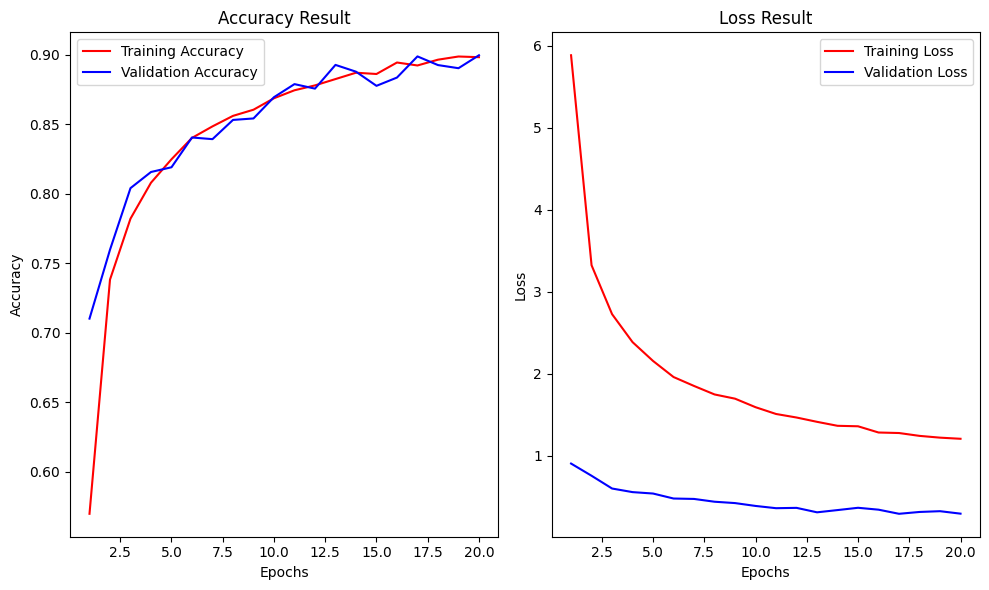

In [39]:

# Plotting results
epochs = range(1, len(history['train_loss']) + 1)
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs, history['train_acc'], 'r', label='Training Accuracy')
plt.plot(epochs, history['valid_acc'], 'b', label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Result')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, history['train_loss'], 'r', label='Training Loss')
plt.plot(epochs, history['valid_loss'], 'b', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Result')
plt.legend()

plt.tight_layout()
plt.show()


In [41]:
# Evaluate the model
def evaluate(model, data_loader):
    model.eval()
    running_loss = 0.0
    corrects = 0
    total = 0
    all_labels = []
    all_preds = []
    
    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            corrects += torch.sum(preds == labels.data)
            total += labels.size(0)
            
            # Collect all labels and predictions for classification report
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
    
    avg_loss = running_loss / len(data_loader.dataset)
    accuracy = corrects.double() / total
    
    return avg_loss, accuracy, all_labels, all_preds

# Evaluate on the training set
train_loss, train_acc, train_labels, train_preds = evaluate(model, train_loader)
print(f'Training Loss: {train_loss:.4f} Accuracy: {train_acc:.4f}')

# Evaluate on the validation set
valid_loss, valid_acc, valid_labels, valid_preds = evaluate(model, valid_loader)
print(f'Validation Loss: {valid_loss:.4f} Accuracy: {valid_acc:.4f}')


Training Loss: 0.2561 Accuracy: 0.9141
Validation Loss: 0.2900 Accuracy: 0.9020


In [43]:
# Generate classification report for training set
class_names = train_dataset.classes
print("Training Set Classification Report:")
print(classification_report(train_labels, train_preds, target_names=class_names))


Training Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.97      0.96      0.96      2016
                                 Apple___Black_rot       0.99      0.93      0.96      1987
                          Apple___Cedar_apple_rust       0.97      0.98      0.98      1760
                                   Apple___healthy       0.97      0.93      0.95      2008
                    Cauliflower_Bacterial spot rot       0.98      0.96      0.97       173
                             Cauliflower_Black Rot       0.98      0.90      0.94       100
                          Cauliflower_Downy Mildew       0.76      0.77      0.77       177
                               Cauliflower_Healthy       0.99      0.97      0.98       206
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.85      0.93      0.89      2729
                       Corn_(maize)___Commo

In [45]:
# Generate classification report for validation set
print("Validation Set Classification Report:")
print(classification_report(valid_labels, valid_preds, target_names=class_names))


Validation Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.96      0.97      0.97       504
                                 Apple___Black_rot       0.99      0.91      0.95       497
                          Apple___Cedar_apple_rust       0.97      0.99      0.98       440
                                   Apple___healthy       0.98      0.93      0.95       502
                    Cauliflower_Bacterial spot rot       0.98      0.97      0.97        93
                             Cauliflower_Black Rot       1.00      0.86      0.92        70
                          Cauliflower_Downy Mildew       0.75      0.78      0.76        95
                               Cauliflower_Healthy       0.97      0.97      0.97       104
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.87      0.91      0.89       820
                       Corn_(maize)___Com

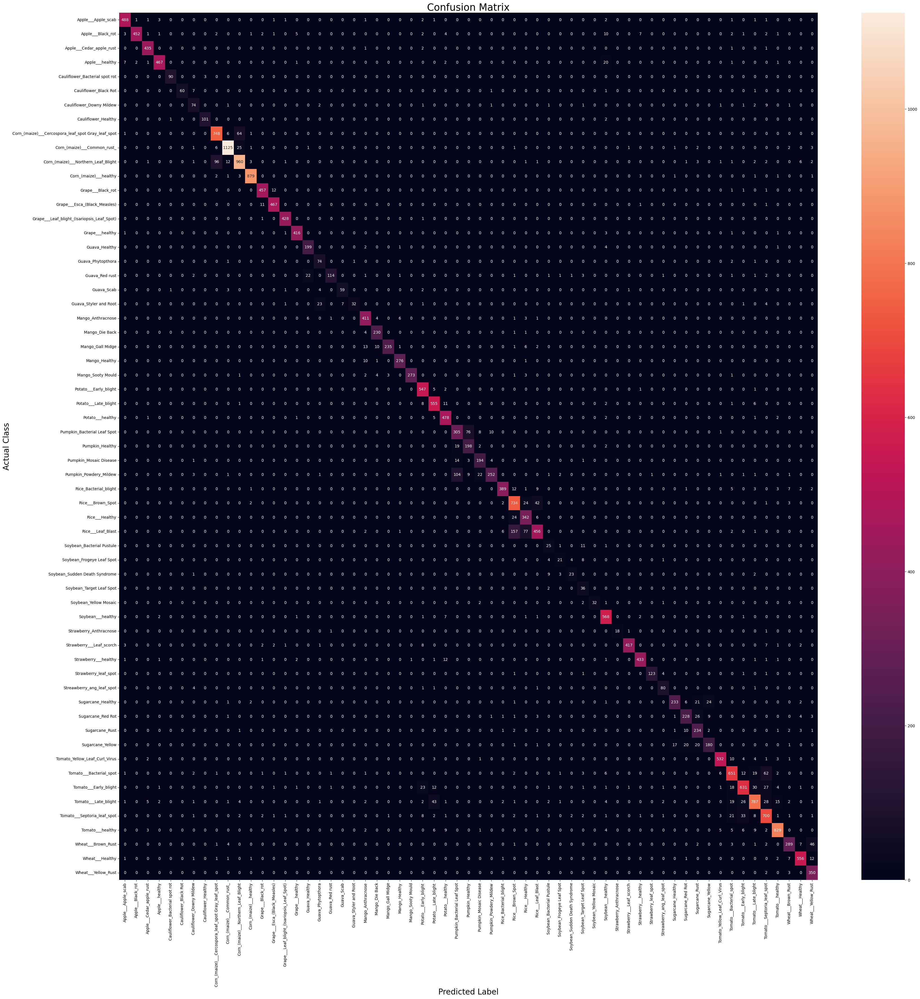

In [47]:
# Generate confusion matrix
cm = confusion_matrix(valid_labels, valid_preds, labels=range(len(class_names)))
plt.figure(figsize=(40, 40))
sns.heatmap(cm, annot=True, fmt='d', annot_kws={'size': 10}, xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label', fontsize=20)
plt.ylabel("Actual Class", fontsize=20)
plt.title('Confusion Matrix', fontsize=25)
plt.show()


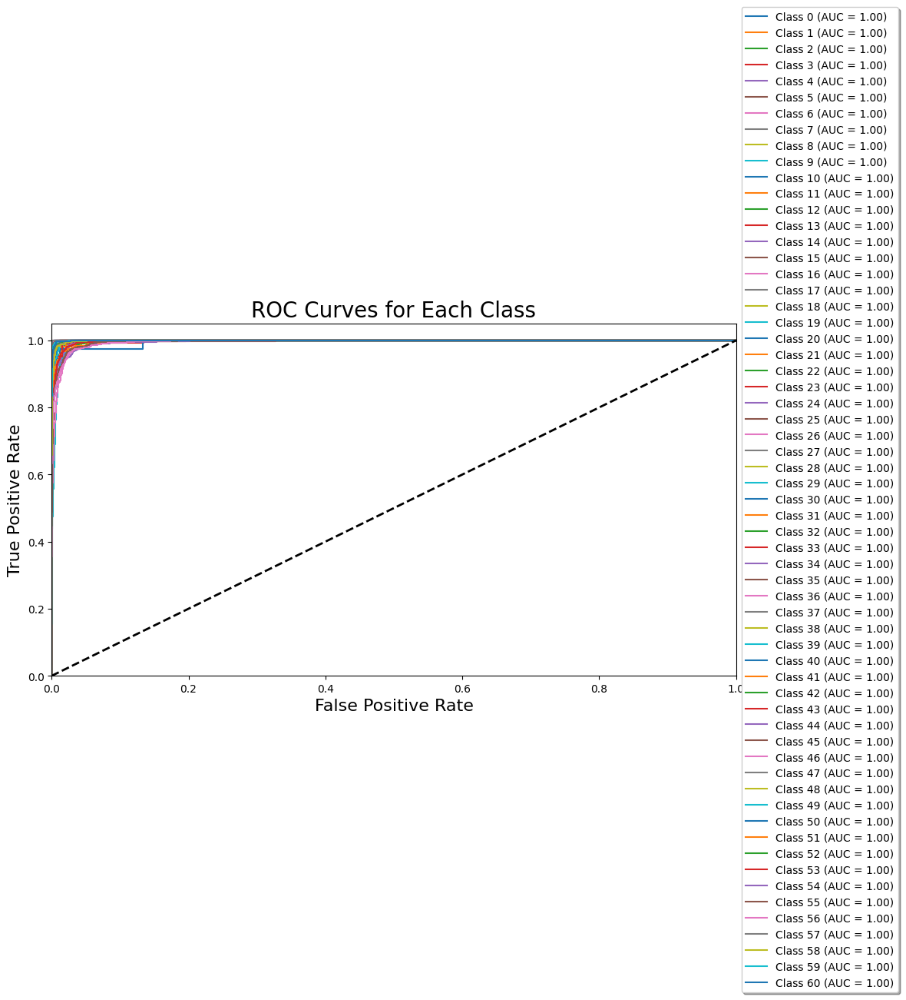

In [63]:
# Plot ROC curves
def plot_roc_curves(model, data_loader, num_classes):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # Get probabilities
            probs = torch.nn.functional.softmax(outputs, dim=1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(probs.cpu().numpy())

    # Binarize the labels
    y_true = label_binarize(all_labels, classes=range(num_classes))
    y_score = np.array(all_preds)

    # Compute ROC curves and ROC AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(14, 10))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curves for Each Class', fontsize=20)

    # Position the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fancybox=True, shadow=True, ncol=1)
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for legend

    plt.show()

# Plot ROC curves for the validation set
plot_roc_curves(model, valid_loader, len(class_names))


C:\Users\ACER\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ACER\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\ACER\AppData\Local\Temp\ipykernel_15888\2687702962.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/py

Test Loss: 0.3390 Accuracy: 0.8918
Test Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      0.80      0.89         5
                                 Apple___Black_rot       1.00      1.00      1.00         5
                          Apple___Cedar_apple_rust       1.00      1.00      1.00         5
                                   Apple___healthy       1.00      1.00      1.00         5
                    Cauliflower_Bacterial spot rot       1.00      1.00      1.00         5
                             Cauliflower_Black Rot       1.00      1.00      1.00         5
                          Cauliflower_Downy Mildew       0.83      1.00      0.91         5
                               Cauliflower_Healthy       1.00      1.00      1.00         5
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.80      0.80      0.80         5
            

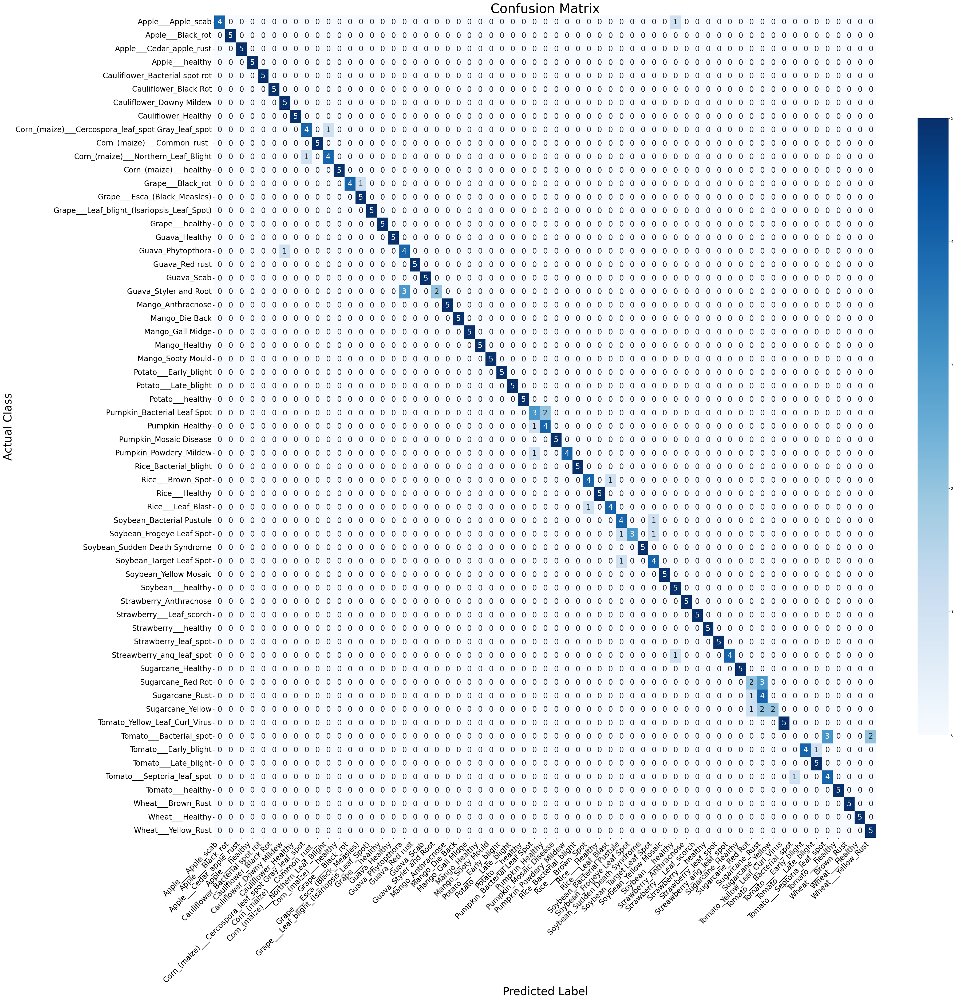

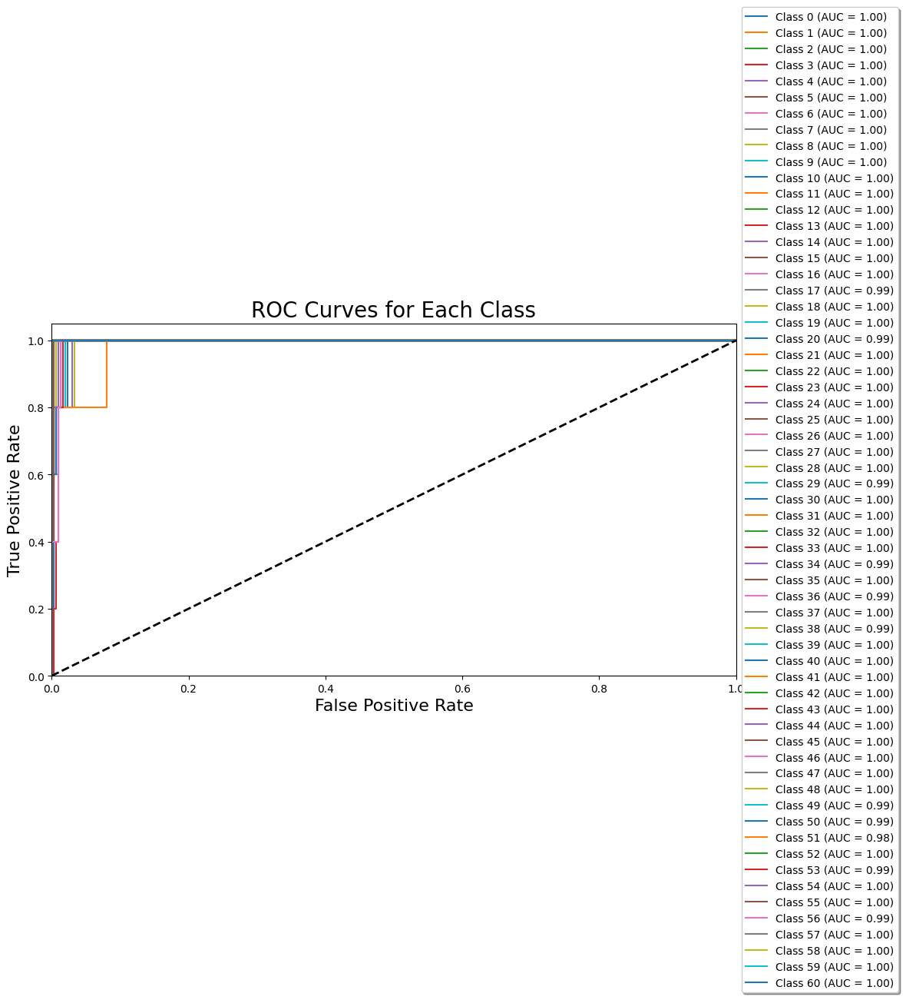

In [57]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the criterion
criterion = nn.CrossEntropyLoss()

# Load the test dataset
test_transform = transforms.Compose([
    transforms.Resize(128),
    transforms.CenterCrop(128),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/test/', transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=8, pin_memory=True)

# Load the VGG19 model
model = models.vgg19(pretrained=True)
model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(test_dataset.classes))
model.load_state_dict(torch.load('vgg19.pth'))
model = model.to(device)

# Evaluate the model on the test set
def evaluate(model, data_loader):
    model.eval()
    running_loss = 0.0
    corrects = 0
    total = 0
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            corrects += torch.sum(preds == labels.data)
            total += labels.size(0)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    avg_loss = running_loss / len(data_loader.dataset)
    accuracy = corrects.double() / total

    return avg_loss, accuracy, all_labels, all_preds

# Evaluate on the test set
test_loss, test_acc, test_labels, test_preds = evaluate(model, test_loader)
print(f'Test Loss: {test_loss:.4f} Accuracy: {test_acc:.4f}')

# Generate classification report for the test set
class_names = test_dataset.classes
print("Test Set Classification Report:")
print(classification_report(test_labels, test_preds, target_names=class_names, zero_division=0))

# Generate confusion matrix
cm = confusion_matrix(test_labels, test_preds, labels=range(len(class_names)))

plt.figure(figsize=(40, 40))  # Increase the figure size for better readability
sns.heatmap(cm, annot=True, fmt='d', annot_kws={'size': 20}, cmap="Blues", 
            xticklabels=class_names, yticklabels=class_names, cbar_kws={'shrink': 0.75})
plt.xlabel('Predicted Label', fontsize=30)
plt.ylabel("Actual Class", fontsize=30)
plt.title('Confusion Matrix', fontsize=35)
plt.xticks(fontsize=20, rotation=45, ha="right")  # Rotate x-axis labels for better readability
plt.yticks(fontsize=20, rotation=0)  # Keep y-axis labels horizontal
plt.show()

# Define the plot_roc_curves function
def plot_roc_curves(model, data_loader, num_classes):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # Get probabilities
            probs = torch.nn.functional.softmax(outputs, dim=1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(probs.cpu().numpy())

    # Binarize the labels
    y_true = label_binarize(all_labels, classes=range(num_classes))
    y_score = np.array(all_preds)

    # Compute ROC curves and ROC AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(14, 10))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curves for Each Class', fontsize=20)

    # Position the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fancybox=True, shadow=True, ncol=1)
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for legend

    plt.show()

# Plot ROC curves for the test set
plot_roc_curves(model, test_loader, len(class_names))


## AlexNet

In [15]:
# device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
# # Set device
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# # model.to(device)

In [17]:
# Define the AlexNet model
model = models.alexnet(pretrained=True)
model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(train_dataset.classes))

C:\Users\ACER\anaconda3\envs\planttest\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ACER\anaconda3\envs\planttest\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [19]:
# Move model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device.type == 'cuda':
    print(f"Using GPU: {torch.cuda.get_device_name(0)}")
else:
    print("Using CPU")
model = model.to(device)

Using GPU: NVIDIA GeForce RTX 4060 Laptop GPU


In [21]:
# Define transformations for data augmentation and normalization
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.RandomResizedCrop(128),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load datasets
train_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/train/', transform=transform)
valid_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/valid/', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=8, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=16, shuffle=False, num_workers=8, pin_memory=True)

In [23]:
# # Wrap model with DataParallel if more than one GPU is available
# if torch.cuda.device_count() > 1:
#     model = nn.DataParallel(model)

# model.to(device)


In [27]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm

# Unfreeze more layers for fine-tuning
for param in model.features[:10].parameters():
    param.requires_grad = False

# Define criterion and optimizer with a different optimizer and learning rate scheduler
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(filter(lambda p: p.requires_grad, model.parameters()), lr=0.001, momentum=0.9, weight_decay=1e-4)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3)

# Gradient accumulation settings
accumulation_steps = 4

# Updated Mixed Precision Training Setup
scaler = torch.amp.GradScaler()

# Function to print current learning rate
def print_lr(optimizer):
    for param_group in optimizer.param_groups:
        print(f"Current learning rate: {param_group['lr']}")

# Train the model with real-time progress updates
def train_model(model, train_loader, valid_loader, criterion, optimizer, scheduler, num_epochs=20):
    history = {'train_loss': [], 'valid_loss': [], 'train_acc': [], 'valid_acc': []}
    
    for epoch in range(num_epochs):
        # Training Phase
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        for i, (images, labels) in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")):
            images, labels = images.to(device), labels.to(device)
            
            optimizer.zero_grad()  # Reset gradients
            
            # Mixed precision forward pass
            with torch.amp.autocast(device_type='cuda'):  # Specify 'cuda' for GPU
                outputs = model(images)
                loss = criterion(outputs, labels)
                
            # Scaled backward pass
            scaler.scale(loss).backward()
            
            if (i + 1) % accumulation_steps == 0:
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad()
            
            # Statistics
            running_loss += loss.item() * accumulation_steps
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
        epoch_loss = running_loss / len(train_loader)
        epoch_acc = correct / total
        
        # Validation Phase
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for images, labels in valid_loader:
                images, labels = images.to(device), labels.to(device)
                with torch.amp.autocast(device_type='cuda'):  # Specify 'cuda' for GPU
                    outputs = model(images)
                    loss = criterion(outputs, labels)
                    val_loss += loss.item()
                    
                    _, predicted = torch.max(outputs.data, 1)
                    val_total += labels.size(0)
                    val_correct += (predicted == labels).sum().item()
        
        val_loss /= len(valid_loader)
        val_acc = val_correct / val_total
        
        # Save history
        history['train_loss'].append(epoch_loss)
        history['valid_loss'].append(val_loss)
        history['train_acc'].append(epoch_acc)
        history['valid_acc'].append(val_acc)
        
        # Adjust learning rate and print it
        scheduler.step(val_loss)
        print_lr(optimizer)
        
        # Print the full summary for the epoch
        print(f"\nEpoch [{epoch+1}/{num_epochs}] - "
              f"Train Loss: {epoch_loss:.4f}, Train Accuracy: {epoch_acc:.4f}, "
              f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}")
    
    return history


In [31]:
# Train the model
history = train_model(model, train_loader, valid_loader, criterion, optimizer, scheduler, num_epochs=20)

Epoch 1/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:20<00:00, 13.20it/s]


Current learning rate: 0.001

Epoch [1/20] - Train Loss: 5.9036, Train Accuracy: 0.5709, Validation Loss: 1.1111, Validation Accuracy: 0.6583


Epoch 2/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:32<00:00, 12.78it/s]


Current learning rate: 0.001

Epoch [2/20] - Train Loss: 4.1707, Train Accuracy: 0.6736, Validation Loss: 0.9132, Validation Accuracy: 0.7058


Epoch 3/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:33<00:00, 12.77it/s]


Current learning rate: 0.001

Epoch [3/20] - Train Loss: 3.7308, Train Accuracy: 0.7026, Validation Loss: 0.8169, Validation Accuracy: 0.7357


Epoch 4/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:28<00:00, 12.91it/s]


Current learning rate: 0.001

Epoch [4/20] - Train Loss: 3.4182, Train Accuracy: 0.7259, Validation Loss: 0.7706, Validation Accuracy: 0.7461


Epoch 5/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:27<00:00, 12.95it/s]


Current learning rate: 0.001

Epoch [5/20] - Train Loss: 3.2450, Train Accuracy: 0.7371, Validation Loss: 0.7039, Validation Accuracy: 0.7679


Epoch 6/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:24<00:00, 13.07it/s]


Current learning rate: 0.001

Epoch [6/20] - Train Loss: 3.0811, Train Accuracy: 0.7502, Validation Loss: 0.7100, Validation Accuracy: 0.7678


Epoch 7/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:23<00:00, 13.11it/s]


Current learning rate: 0.001

Epoch [7/20] - Train Loss: 2.9671, Train Accuracy: 0.7571, Validation Loss: 0.6741, Validation Accuracy: 0.7743


Epoch 8/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:24<00:00, 13.05it/s]


Current learning rate: 0.001

Epoch [8/20] - Train Loss: 2.8780, Train Accuracy: 0.7623, Validation Loss: 0.6722, Validation Accuracy: 0.7776


Epoch 9/20: 100%|██████████████████████████████████████████████████████████████████| 5021/5021 [06:20<00:00, 13.18it/s]


Current learning rate: 0.001

Epoch [9/20] - Train Loss: 2.8086, Train Accuracy: 0.7677, Validation Loss: 0.6459, Validation Accuracy: 0.7779


Epoch 10/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:36<00:00, 12.68it/s]


Current learning rate: 0.001

Epoch [10/20] - Train Loss: 2.7161, Train Accuracy: 0.7772, Validation Loss: 0.6162, Validation Accuracy: 0.7946


Epoch 11/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:32<00:00, 12.80it/s]


Current learning rate: 0.001

Epoch [11/20] - Train Loss: 2.6661, Train Accuracy: 0.7789, Validation Loss: 0.6068, Validation Accuracy: 0.7987


Epoch 12/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:36<00:00, 12.66it/s]


Current learning rate: 0.001

Epoch [12/20] - Train Loss: 2.5784, Train Accuracy: 0.7856, Validation Loss: 0.5948, Validation Accuracy: 0.8013


Epoch 13/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:34<00:00, 12.73it/s]


Current learning rate: 0.001

Epoch [13/20] - Train Loss: 2.5234, Train Accuracy: 0.7906, Validation Loss: 0.5694, Validation Accuracy: 0.8068


Epoch 14/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:29<00:00, 12.88it/s]


Current learning rate: 0.001

Epoch [14/20] - Train Loss: 2.4949, Train Accuracy: 0.7936, Validation Loss: 0.5757, Validation Accuracy: 0.8098


Epoch 15/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:26<00:00, 13.00it/s]


Current learning rate: 0.001

Epoch [15/20] - Train Loss: 2.4704, Train Accuracy: 0.7937, Validation Loss: 0.5691, Validation Accuracy: 0.8091


Epoch 16/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:23<00:00, 13.10it/s]


Current learning rate: 0.001

Epoch [16/20] - Train Loss: 2.4409, Train Accuracy: 0.7968, Validation Loss: 0.5511, Validation Accuracy: 0.8151


Epoch 17/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:20<00:00, 13.20it/s]


Current learning rate: 0.001

Epoch [17/20] - Train Loss: 2.3904, Train Accuracy: 0.8000, Validation Loss: 0.5442, Validation Accuracy: 0.8179


Epoch 18/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:26<00:00, 12.99it/s]


Current learning rate: 0.001

Epoch [18/20] - Train Loss: 2.3597, Train Accuracy: 0.8038, Validation Loss: 0.5687, Validation Accuracy: 0.8114


Epoch 19/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:26<00:00, 12.98it/s]


Current learning rate: 0.001

Epoch [19/20] - Train Loss: 2.3217, Train Accuracy: 0.8067, Validation Loss: 0.5239, Validation Accuracy: 0.8202


Epoch 20/20: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:24<00:00, 13.06it/s]


Current learning rate: 0.001

Epoch [20/20] - Train Loss: 2.2710, Train Accuracy: 0.8097, Validation Loss: 0.5095, Validation Accuracy: 0.8286


In [33]:
# Assuming the model and optimizer states are intact after 20 epochs
# Start training from epoch 21 and continue for 5 more epochs
initial_epoch = 20
additional_epochs = 5

# Continue Training Function
def continue_training_model(model, train_loader, valid_loader, criterion, optimizer, scheduler, initial_epoch, additional_epochs, history):
    total_epochs = initial_epoch + additional_epochs
    
    for epoch in range(initial_epoch, total_epochs):
        # Training Phase
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        for i, (images, labels) in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{total_epochs}")):
            images, labels = images.to(device), labels.to(device)
            
            optimizer.zero_grad()  # Reset gradients
            
            # Mixed precision forward pass
            with torch.amp.autocast(device_type='cuda'):  # Specify 'cuda' for GPU
                outputs = model(images)
                loss = criterion(outputs, labels)
                
            # Scaled backward pass
            scaler.scale(loss).backward()
            
            if (i + 1) % accumulation_steps == 0:
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad()
            
            # Statistics
            running_loss += loss.item() * accumulation_steps
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
        epoch_loss = running_loss / len(train_loader)
        epoch_acc = correct / total
        
        # Validation Phase
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for images, labels in valid_loader:
                images, labels = images.to(device), labels.to(device)
                with torch.amp.autocast(device_type='cuda'):  # Specify 'cuda' for GPU
                    outputs = model(images)
                    loss = criterion(outputs, labels)
                    val_loss += loss.item()
                    
                    _, predicted = torch.max(outputs.data, 1)
                    val_total += labels.size(0)
                    val_correct += (predicted == labels).sum().item()
        
        val_loss /= len(valid_loader)
        val_acc = val_correct / val_total
        
        # Append to history
        history['train_loss'].append(epoch_loss)
        history['valid_loss'].append(val_loss)
        history['train_acc'].append(epoch_acc)
        history['valid_acc'].append(val_acc)
        
        # Adjust learning rate and print it
        scheduler.step(val_loss)
        print_lr(optimizer)
        
        # Print the full summary for the epoch
        print(f"\nEpoch [{epoch+1}/{total_epochs}] - "
              f"Train Loss: {epoch_loss:.4f}, Train Accuracy: {epoch_acc:.4f}, "
              f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}")
    
    return history

# Continue training for 5 more epochs
history = continue_training_model(model, train_loader, valid_loader, criterion, optimizer, scheduler, initial_epoch, additional_epochs, history)


Epoch 21/25: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:29<00:00, 12.89it/s]


Current learning rate: 0.001

Epoch [21/25] - Train Loss: 2.2727, Train Accuracy: 0.8104, Validation Loss: 0.5232, Validation Accuracy: 0.8252


Epoch 22/25: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:10<00:00, 13.54it/s]


Current learning rate: 0.001

Epoch [22/25] - Train Loss: 2.2285, Train Accuracy: 0.8133, Validation Loss: 0.5020, Validation Accuracy: 0.8299


Epoch 23/25: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:17<00:00, 13.32it/s]


Current learning rate: 0.001

Epoch [23/25] - Train Loss: 2.2072, Train Accuracy: 0.8141, Validation Loss: 0.5096, Validation Accuracy: 0.8299


Epoch 24/25: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:33<00:00, 12.76it/s]


Current learning rate: 0.001

Epoch [24/25] - Train Loss: 2.1810, Train Accuracy: 0.8177, Validation Loss: 0.4981, Validation Accuracy: 0.8306


Epoch 25/25: 100%|█████████████████████████████████████████████████████████████████| 5021/5021 [06:38<00:00, 12.60it/s]


Current learning rate: 0.001

Epoch [25/25] - Train Loss: 2.1782, Train Accuracy: 0.8166, Validation Loss: 0.5150, Validation Accuracy: 0.8240


In [35]:
# Save the model
torch.save(model.state_dict(), 'alexnet.pth')
print("Model saved as alexnet.pth")

Model saved as alexnet.pth


In [92]:
import torch
import torch.nn as nn
from torchinfo import summary
from torchvision import models

# Define the AlexNet model with explicit weights argument
model = models.alexnet(weights=models.AlexNet_Weights.IMAGENET1K_V1)
model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(train_dataset.classes))

# Example batch size
batch_size = 16

# Use the summary function to print the model summary
summary(model, input_size=(batch_size, 3, 224, 224))


Layer (type:depth-idx)                   Output Shape              Param #
AlexNet                                  [16, 61]                  --
├─Sequential: 1-1                        [16, 256, 6, 6]           --
│    └─Conv2d: 2-1                       [16, 64, 55, 55]          23,296
│    └─ReLU: 2-2                         [16, 64, 55, 55]          --
│    └─MaxPool2d: 2-3                    [16, 64, 27, 27]          --
│    └─Conv2d: 2-4                       [16, 192, 27, 27]         307,392
│    └─ReLU: 2-5                         [16, 192, 27, 27]         --
│    └─MaxPool2d: 2-6                    [16, 192, 13, 13]         --
│    └─Conv2d: 2-7                       [16, 384, 13, 13]         663,936
│    └─ReLU: 2-8                         [16, 384, 13, 13]         --
│    └─Conv2d: 2-9                       [16, 256, 13, 13]         884,992
│    └─ReLU: 2-10                        [16, 256, 13, 13]         --
│    └─Conv2d: 2-11                      [16, 256, 13, 13]        

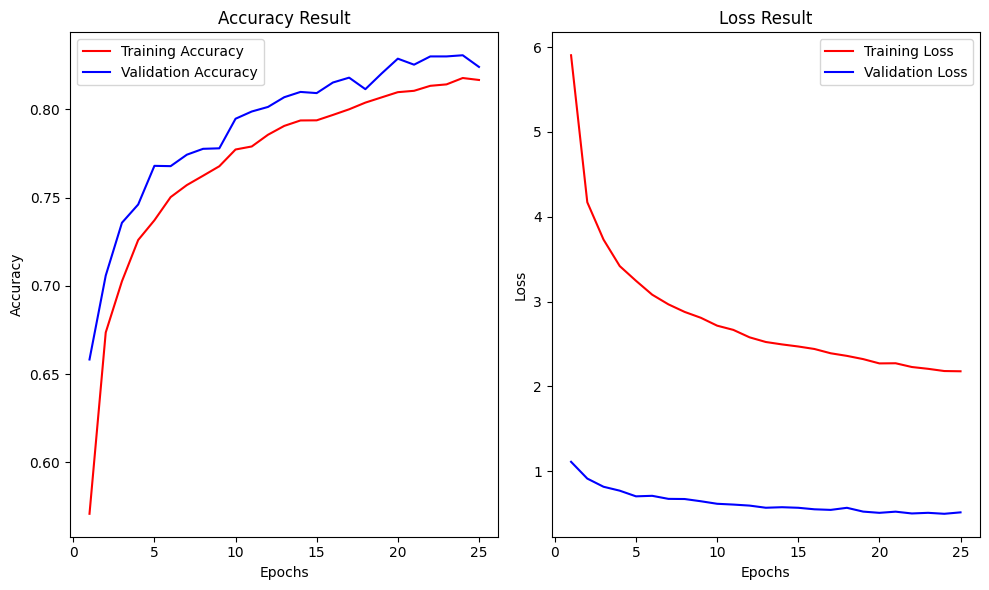

In [37]:

# Plotting results
epochs = range(1, len(history['train_loss']) + 1)
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs, history['train_acc'], 'r', label='Training Accuracy')
plt.plot(epochs, history['valid_acc'], 'b', label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Result')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, history['train_loss'], 'r', label='Training Loss')
plt.plot(epochs, history['valid_loss'], 'b', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Result')
plt.legend()

plt.tight_layout()
plt.show()


In [39]:

# Evaluate the model
def evaluate(model, data_loader):
    model.eval()
    running_loss = 0.0
    corrects = 0
    total = 0
    all_labels = []
    all_preds = []
    
    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            corrects += torch.sum(preds == labels.data)
            total += labels.size(0)
            
            # Collect all labels and predictions for classification report
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
    
    avg_loss = running_loss / len(data_loader.dataset)
    accuracy = corrects.double() / total
    
    return avg_loss, accuracy, all_labels, all_preds

# Evaluate on the training set
train_loss, train_acc, train_labels, train_preds = evaluate(model, train_loader)
print(f'Training Loss: {train_loss:.4f} Accuracy: {train_acc:.4f}')

# Evaluate on the validation set
valid_loss, valid_acc, valid_labels, valid_preds = evaluate(model, valid_loader)
print(f'Validation Loss: {valid_loss:.4f} Accuracy: {valid_acc:.4f}')


Training Loss: 0.4600 Accuracy: 0.8441
Validation Loss: 0.5042 Accuracy: 0.8299


In [41]:
# Generate classification report for training set
class_names = train_dataset.classes
print("Training Set Classification Report:")
print(classification_report(train_labels, train_preds, target_names=class_names))


Training Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.79      0.94      0.85      2016
                                 Apple___Black_rot       0.93      0.81      0.87      1987
                          Apple___Cedar_apple_rust       0.88      0.96      0.92      1760
                                   Apple___healthy       0.93      0.90      0.91      2008
                    Cauliflower_Bacterial spot rot       0.82      0.83      0.82       173
                             Cauliflower_Black Rot       0.77      0.90      0.83       100
                          Cauliflower_Downy Mildew       0.69      0.47      0.56       177
                               Cauliflower_Healthy       0.94      0.93      0.93       206
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.77      0.87      0.82      2729
                       Corn_(maize)___Commo

In [43]:
# Generate classification report for validation set
print("Validation Set Classification Report:")
print(classification_report(valid_labels, valid_preds, target_names=class_names))


Validation Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.77      0.93      0.84       504
                                 Apple___Black_rot       0.94      0.85      0.89       497
                          Apple___Cedar_apple_rust       0.84      0.97      0.90       440
                                   Apple___healthy       0.91      0.89      0.90       502
                    Cauliflower_Bacterial spot rot       0.85      0.84      0.84        93
                             Cauliflower_Black Rot       0.76      0.89      0.82        70
                          Cauliflower_Downy Mildew       0.66      0.39      0.49        95
                               Cauliflower_Healthy       0.93      0.86      0.89       104
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.81      0.88      0.84       820
                       Corn_(maize)___Com

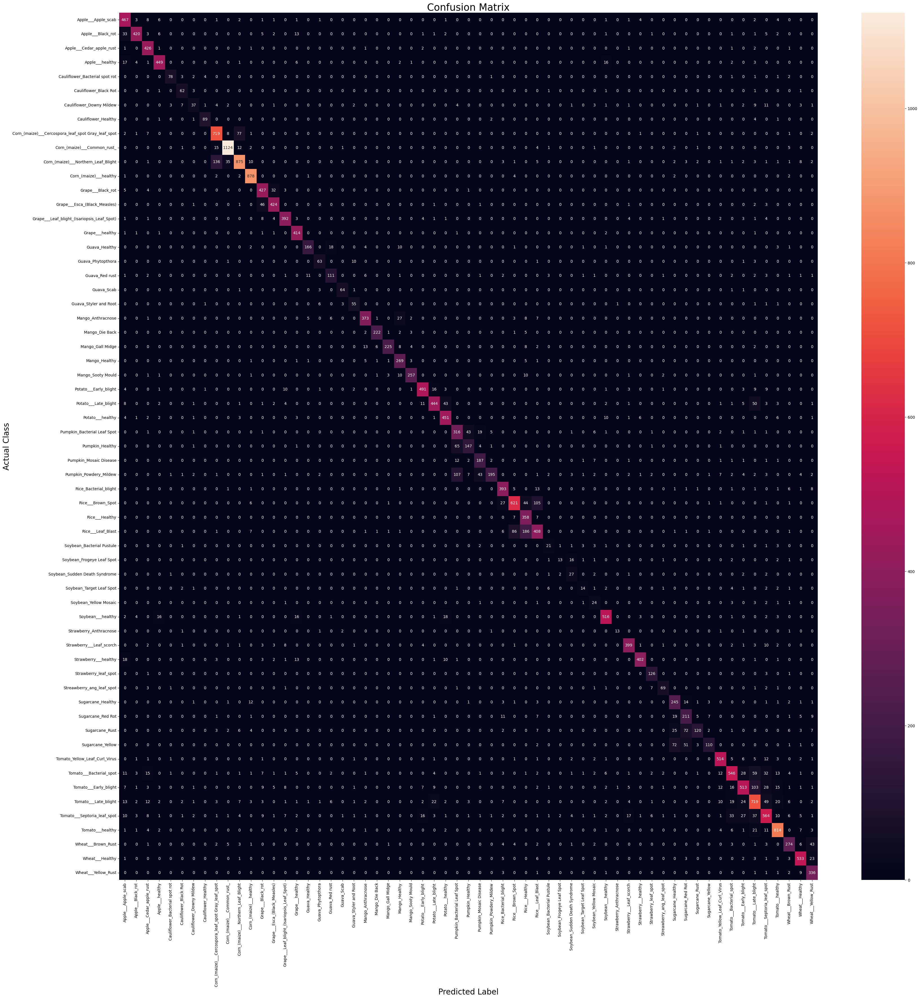

In [45]:
# Generate confusion matrix
cm = confusion_matrix(valid_labels, valid_preds, labels=range(len(class_names)))
plt.figure(figsize=(40, 40))
sns.heatmap(cm, annot=True, fmt='d', annot_kws={'size': 10}, xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label', fontsize=20)
plt.ylabel("Actual Class", fontsize=20)
plt.title('Confusion Matrix', fontsize=25)
plt.show()

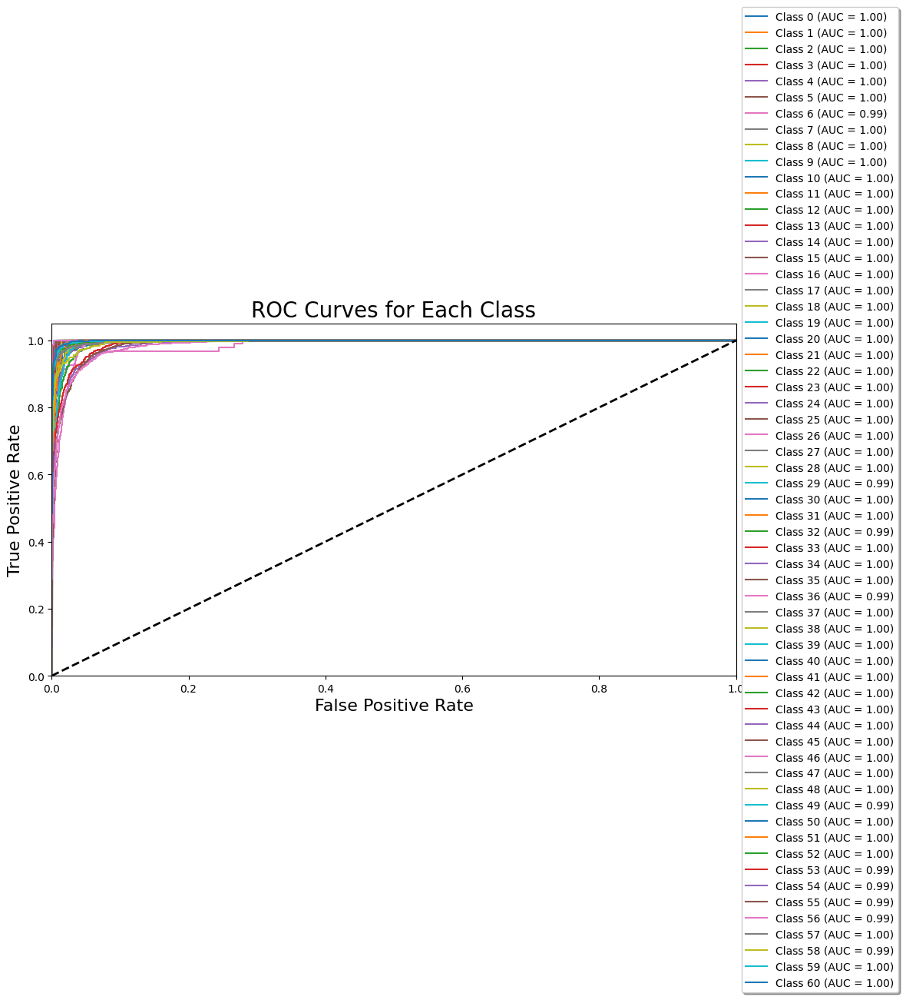

In [49]:
# Plot ROC curves
def plot_roc_curves(model, data_loader, num_classes):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # Get probabilities
            probs = torch.nn.functional.softmax(outputs, dim=1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(probs.cpu().numpy())

    # Binarize the labels
    y_true = label_binarize(all_labels, classes=range(num_classes))
    y_score = np.array(all_preds)

    # Compute ROC curves and ROC AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(14, 10))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curves for Each Class', fontsize=20)

    # Position the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fancybox=True, shadow=True, ncol=1)
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for legend

    plt.show()

# Plot ROC curves for the validation set
plot_roc_curves(model, valid_loader, len(class_names))


C:\Users\ACER\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ACER\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\ACER\AppData\Local\Temp\ipykernel_15888\2071180900.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.co

Test Loss: 0.6014 Accuracy: 0.7902
Test Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.62      1.00      0.77         5
                                 Apple___Black_rot       1.00      1.00      1.00         5
                          Apple___Cedar_apple_rust       0.83      1.00      0.91         5
                                   Apple___healthy       1.00      0.80      0.89         5
                    Cauliflower_Bacterial spot rot       1.00      1.00      1.00         5
                             Cauliflower_Black Rot       0.83      1.00      0.91         5
                          Cauliflower_Downy Mildew       1.00      0.60      0.75         5
                               Cauliflower_Healthy       1.00      1.00      1.00         5
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.71      1.00      0.83         5
            

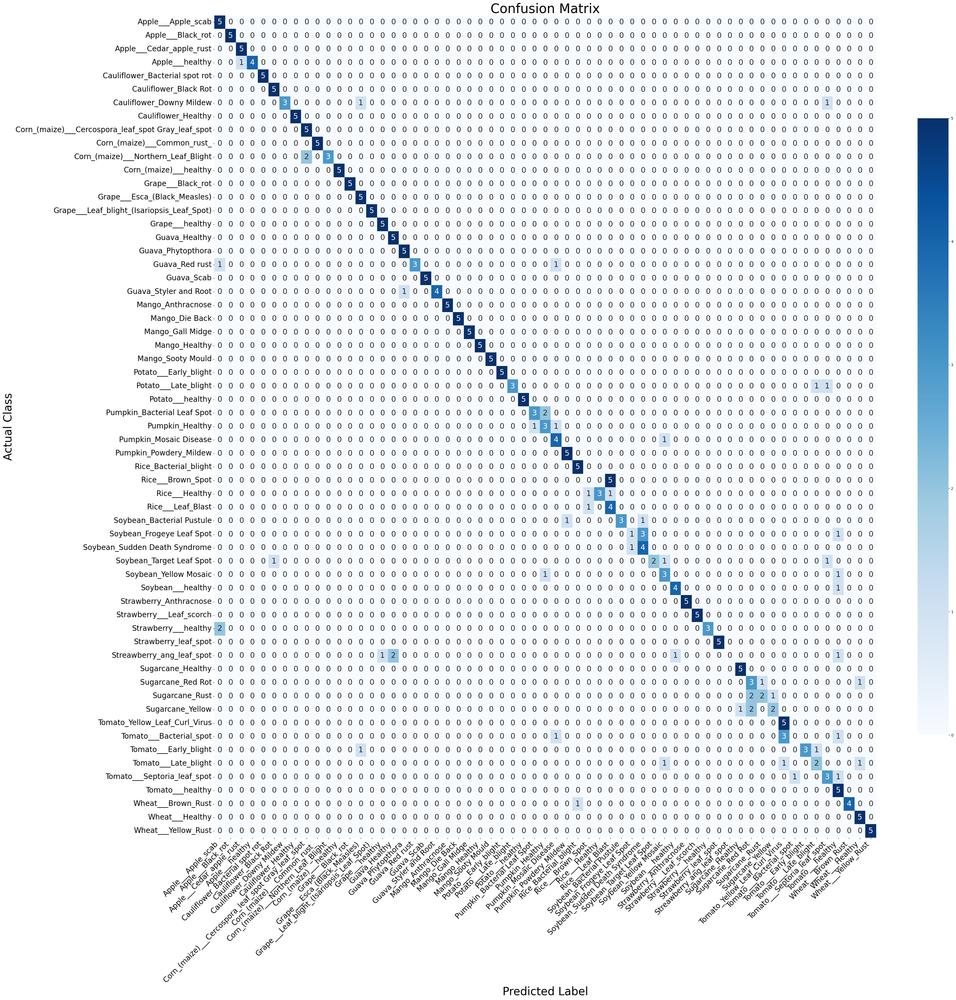

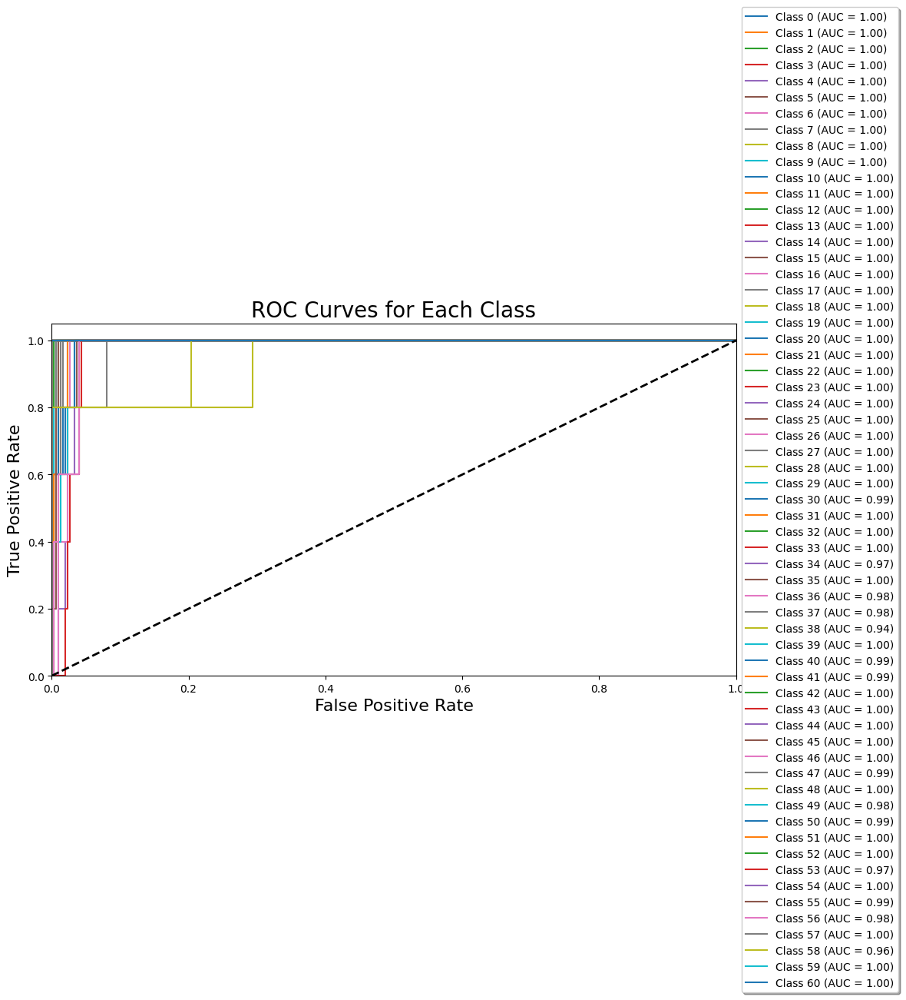

In [55]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the criterion
criterion = nn.CrossEntropyLoss()

# Load the test dataset
test_transform = transforms.Compose([
    transforms.Resize(128),
    transforms.CenterCrop(128),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/test/', transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=8, pin_memory=True)

# Load the AlexNet model
model = models.alexnet(pretrained=True)
model.classifier[6] = nn.Linear(model.classifier[6].in_features, len(test_dataset.classes))
model.load_state_dict(torch.load('alexnet.pth'))
model = model.to(device)

# Evaluate the model on the test set
def evaluate(model, data_loader):
    model.eval()
    running_loss = 0.0
    corrects = 0
    total = 0
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            corrects += torch.sum(preds == labels.data)
            total += labels.size(0)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    avg_loss = running_loss / len(data_loader.dataset)
    accuracy = corrects.double() / total

    return avg_loss, accuracy, all_labels, all_preds

test_loss, test_acc, test_labels, test_preds = evaluate(model, test_loader)
print(f'Test Loss: {test_loss:.4f} Accuracy: {test_acc:.4f}')

# Generate classification report for the test set
class_names = test_dataset.classes
print("Test Set Classification Report:")
print(classification_report(test_labels, test_preds, target_names=class_names, zero_division=0))

# Generate confusion matrix
cm = confusion_matrix(test_labels, test_preds, labels=range(len(class_names)))

plt.figure(figsize=(40, 40))  # Increase the figure size for better readability
sns.heatmap(cm, annot=True, fmt='d', annot_kws={'size': 20}, cmap="Blues", 
            xticklabels=class_names, yticklabels=class_names, cbar_kws={'shrink': 0.75})
plt.xlabel('Predicted Label', fontsize=30)
plt.ylabel("Actual Class", fontsize=30)
plt.title('Confusion Matrix', fontsize=35)
plt.xticks(fontsize=20, rotation=45, ha="right")  # Rotate x-axis labels for better readability
plt.yticks(fontsize=20, rotation=0)  # Keep y-axis labels horizontal
plt.show()

# Define the plot_roc_curves function
def plot_roc_curves(model, data_loader, num_classes):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # Get probabilities
            probs = torch.nn.functional.softmax(outputs, dim=1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(probs.cpu().numpy())

    # Binarize the labels
    y_true = label_binarize(all_labels, classes=range(num_classes))
    y_score = np.array(all_preds)

    # Compute ROC curves and ROC AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(14, 10))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curves for Each Class', fontsize=20)

    # Position the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fancybox=True, shadow=True, ncol=1)
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for legend

    plt.show()

# Plot ROC curves for the test set
plot_roc_curves(model, test_loader, len(class_names))


### DenseNet

In [15]:
# device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
# # Set device
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# # model.to(device)

In [17]:
# Define the DenseNet model
model = models.densenet121(pretrained=True)
model.classifier = nn.Linear(model.classifier.in_features, len(train_dataset.classes))

C:\Users\ACER\anaconda3\envs\planttest\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ACER\anaconda3\envs\planttest\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [19]:
# Move model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device.type == 'cuda':
    print(f"Using GPU: {torch.cuda.get_device_name(0)}")
else:
    print("Using CPU")
model = model.to(device)

Using GPU: NVIDIA GeForce RTX 4060 Laptop GPU


In [21]:

# Define transformations for data augmentation and normalization
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.RandomResizedCrop(128),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load datasets
train_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/train/', transform=transform)
valid_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/valid/', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=8, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False, num_workers=8, pin_memory=True)


In [23]:
# # Wrap model with DataParallel if more than one GPU is available
# if torch.cuda.device_count() > 1:
#     model = nn.DataParallel(model)

# model.to(device)


In [27]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm import tqdm

# Unfreeze more layers for fine-tuning
for param in model.features[:10].parameters():
    param.requires_grad = False

# Define criterion and optimizer with a different optimizer and learning rate scheduler
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(filter(lambda p: p.requires_grad, model.parameters()), lr=0.001, momentum=0.9, weight_decay=1e-4)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3)

# Gradient accumulation settings
accumulation_steps = 4

# Updated Mixed Precision Training Setup
scaler = torch.amp.GradScaler()

# Function to print current learning rate
def print_lr(optimizer):
    for param_group in optimizer.param_groups:
        print(f"Current learning rate: {param_group['lr']}")

# Train the model with real-time progress updates
def train_model(model, train_loader, valid_loader, criterion, optimizer, scheduler, num_epochs=25):
    history = {'train_loss': [], 'valid_loss': [], 'train_acc': [], 'valid_acc': []}
    
    for epoch in range(num_epochs):
        # Training Phase
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        for i, (images, labels) in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")):
            images, labels = images.to(device), labels.to(device)
            
            optimizer.zero_grad()  # Reset gradients
            
            # Mixed precision forward pass
            with torch.amp.autocast(device_type='cuda'):  # Specify 'cuda' for GPU
                outputs = model(images)
                loss = criterion(outputs, labels)
                
            # Scaled backward pass
            scaler.scale(loss).backward()
            
            if (i + 1) % accumulation_steps == 0:
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad()
            
            # Statistics
            running_loss += loss.item() * accumulation_steps
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
        epoch_loss = running_loss / len(train_loader)
        epoch_acc = correct / total
        
        # Validation Phase
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for images, labels in valid_loader:
                images, labels = images.to(device), labels.to(device)
                with torch.amp.autocast(device_type='cuda'):  # Specify 'cuda' for GPU
                    outputs = model(images)
                    loss = criterion(outputs, labels)
                    val_loss += loss.item()
                    
                    _, predicted = torch.max(outputs.data, 1)
                    val_total += labels.size(0)
                    val_correct += (predicted == labels).sum().item()
        
        val_loss /= len(valid_loader)
        val_acc = val_correct / val_total
        
        # Save history
        history['train_loss'].append(epoch_loss)
        history['valid_loss'].append(val_loss)
        history['train_acc'].append(epoch_acc)
        history['valid_acc'].append(val_acc)
        
        # Adjust learning rate and print it
        scheduler.step(val_loss)
        print_lr(optimizer)
        
        # Print the full summary for the epoch
        print(f"\nEpoch [{epoch+1}/{num_epochs}] - "
              f"Train Loss: {epoch_loss:.4f}, Train Accuracy: {epoch_acc:.4f}, "
              f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}")
    
    return history


In [31]:
# Train the model
history = train_model(model, train_loader, valid_loader, criterion, optimizer, scheduler, num_epochs=25)

Epoch 1/25: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:35<00:00,  7.48it/s]


Current learning rate: 0.001

Epoch [1/25] - Train Loss: 7.0211, Train Accuracy: 0.5475, Validation Loss: 1.0820, Validation Accuracy: 0.6895


Epoch 2/25: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:37<00:00,  7.45it/s]


Current learning rate: 0.001

Epoch [2/25] - Train Loss: 3.5872, Train Accuracy: 0.7327, Validation Loss: 0.7609, Validation Accuracy: 0.7633


Epoch 3/25: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:32<00:00,  7.55it/s]


Current learning rate: 0.001

Epoch [3/25] - Train Loss: 2.9147, Train Accuracy: 0.7706, Validation Loss: 0.6335, Validation Accuracy: 0.7949


Epoch 4/25: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:34<00:00,  7.51it/s]


Current learning rate: 0.001

Epoch [4/25] - Train Loss: 2.5338, Train Accuracy: 0.7973, Validation Loss: 0.5676, Validation Accuracy: 0.8140


Epoch 5/25: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:43<00:00,  7.31it/s]


Current learning rate: 0.001

Epoch [5/25] - Train Loss: 2.3356, Train Accuracy: 0.8116, Validation Loss: 0.5234, Validation Accuracy: 0.8236


Epoch 6/25: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:37<00:00,  7.44it/s]


Current learning rate: 0.001

Epoch [6/25] - Train Loss: 2.1629, Train Accuracy: 0.8236, Validation Loss: 0.4906, Validation Accuracy: 0.8350


Epoch 7/25: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:59<00:00,  6.99it/s]


Current learning rate: 0.001

Epoch [7/25] - Train Loss: 2.0194, Train Accuracy: 0.8339, Validation Loss: 0.4532, Validation Accuracy: 0.8454


Epoch 8/25: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [05:49<00:00,  7.18it/s]


Current learning rate: 0.001

Epoch [8/25] - Train Loss: 1.9221, Train Accuracy: 0.8401, Validation Loss: 0.4368, Validation Accuracy: 0.8517


Epoch 9/25: 100%|██████████████████████████████████████████████████████████████████| 2511/2511 [06:03<00:00,  6.91it/s]


Current learning rate: 0.001

Epoch [9/25] - Train Loss: 1.8525, Train Accuracy: 0.8455, Validation Loss: 0.4305, Validation Accuracy: 0.8531


Epoch 10/25: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:52<00:00,  7.12it/s]


Current learning rate: 0.001

Epoch [10/25] - Train Loss: 1.7702, Train Accuracy: 0.8522, Validation Loss: 0.4060, Validation Accuracy: 0.8614


Epoch 11/25: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [06:04<00:00,  6.88it/s]


Current learning rate: 0.001

Epoch [11/25] - Train Loss: 1.7067, Train Accuracy: 0.8563, Validation Loss: 0.3966, Validation Accuracy: 0.8625


Epoch 12/25: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [06:04<00:00,  6.89it/s]


Current learning rate: 0.001

Epoch [12/25] - Train Loss: 1.6647, Train Accuracy: 0.8597, Validation Loss: 0.3751, Validation Accuracy: 0.8697


Epoch 13/25: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:46<00:00,  7.25it/s]


Current learning rate: 0.001

Epoch [13/25] - Train Loss: 1.6187, Train Accuracy: 0.8652, Validation Loss: 0.3627, Validation Accuracy: 0.8749


Epoch 14/25: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:55<00:00,  7.06it/s]


Current learning rate: 0.001

Epoch [14/25] - Train Loss: 1.5851, Train Accuracy: 0.8661, Validation Loss: 0.3601, Validation Accuracy: 0.8759


Epoch 15/25: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:53<00:00,  7.11it/s]


Current learning rate: 0.001

Epoch [15/25] - Train Loss: 1.5187, Train Accuracy: 0.8721, Validation Loss: 0.3518, Validation Accuracy: 0.8790


Epoch 16/25: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:49<00:00,  7.18it/s]


Current learning rate: 0.001

Epoch [16/25] - Train Loss: 1.5140, Train Accuracy: 0.8713, Validation Loss: 0.3407, Validation Accuracy: 0.8819


Epoch 17/25: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:35<00:00,  7.48it/s]


Current learning rate: 0.001

Epoch [17/25] - Train Loss: 1.4761, Train Accuracy: 0.8749, Validation Loss: 0.3334, Validation Accuracy: 0.8850


Epoch 18/25: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:34<00:00,  7.51it/s]


Current learning rate: 0.001

Epoch [18/25] - Train Loss: 1.4426, Train Accuracy: 0.8779, Validation Loss: 0.3254, Validation Accuracy: 0.8893


Epoch 19/25: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:47<00:00,  7.23it/s]


Current learning rate: 0.001

Epoch [19/25] - Train Loss: 1.4109, Train Accuracy: 0.8789, Validation Loss: 0.3213, Validation Accuracy: 0.8879


Epoch 20/25: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:59<00:00,  6.98it/s]


Current learning rate: 0.001

Epoch [20/25] - Train Loss: 1.3937, Train Accuracy: 0.8822, Validation Loss: 0.3225, Validation Accuracy: 0.8891


Epoch 21/25: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [06:05<00:00,  6.87it/s]


Current learning rate: 0.001

Epoch [21/25] - Train Loss: 1.3729, Train Accuracy: 0.8841, Validation Loss: 0.3064, Validation Accuracy: 0.8935


Epoch 22/25: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:50<00:00,  7.17it/s]


Current learning rate: 0.001

Epoch [22/25] - Train Loss: 1.3671, Train Accuracy: 0.8820, Validation Loss: 0.3080, Validation Accuracy: 0.8925


Epoch 23/25: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:48<00:00,  7.20it/s]


Current learning rate: 0.001

Epoch [23/25] - Train Loss: 1.3257, Train Accuracy: 0.8864, Validation Loss: 0.2961, Validation Accuracy: 0.8989


Epoch 24/25: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:52<00:00,  7.13it/s]


Current learning rate: 0.001

Epoch [24/25] - Train Loss: 1.3052, Train Accuracy: 0.8889, Validation Loss: 0.2900, Validation Accuracy: 0.8978


Epoch 25/25: 100%|█████████████████████████████████████████████████████████████████| 2511/2511 [05:56<00:00,  7.04it/s]


Current learning rate: 0.001

Epoch [25/25] - Train Loss: 1.2856, Train Accuracy: 0.8905, Validation Loss: 0.2800, Validation Accuracy: 0.9025


In [33]:
# Save the model
torch.save(model.state_dict(), 'densenet.pth')
print("Model saved as densenet.pth")


Model saved as densenet.pth


In [94]:
import torch
import torch.nn as nn
from torchinfo import summary
from torchvision import models

# Define the DenseNet model
model = models.densenet121(pretrained=True)
model.classifier = nn.Linear(model.classifier.in_features, len(train_dataset.classes))

# Example batch size
batch_size = 32

# Use the summary function to print the model summary
summary(model, input_size=(batch_size, 3, 224, 224))

C:\Users\ACER\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Layer (type:depth-idx)                   Output Shape              Param #
DenseNet                                 [32, 61]                  --
├─Sequential: 1-1                        [32, 1024, 7, 7]          --
│    └─Conv2d: 2-1                       [32, 64, 112, 112]        9,408
│    └─BatchNorm2d: 2-2                  [32, 64, 112, 112]        128
│    └─ReLU: 2-3                         [32, 64, 112, 112]        --
│    └─MaxPool2d: 2-4                    [32, 64, 56, 56]          --
│    └─_DenseBlock: 2-5                  [32, 256, 56, 56]         --
│    │    └─_DenseLayer: 3-1             [32, 32, 56, 56]          45,440
│    │    └─_DenseLayer: 3-2             [32, 32, 56, 56]          49,600
│    │    └─_DenseLayer: 3-3             [32, 32, 56, 56]          53,760
│    │    └─_DenseLayer: 3-4             [32, 32, 56, 56]          57,920
│    │    └─_DenseLayer: 3-5             [32, 32, 56, 56]          62,080
│    │    └─_DenseLayer: 3-6             [32, 32, 56, 56]    

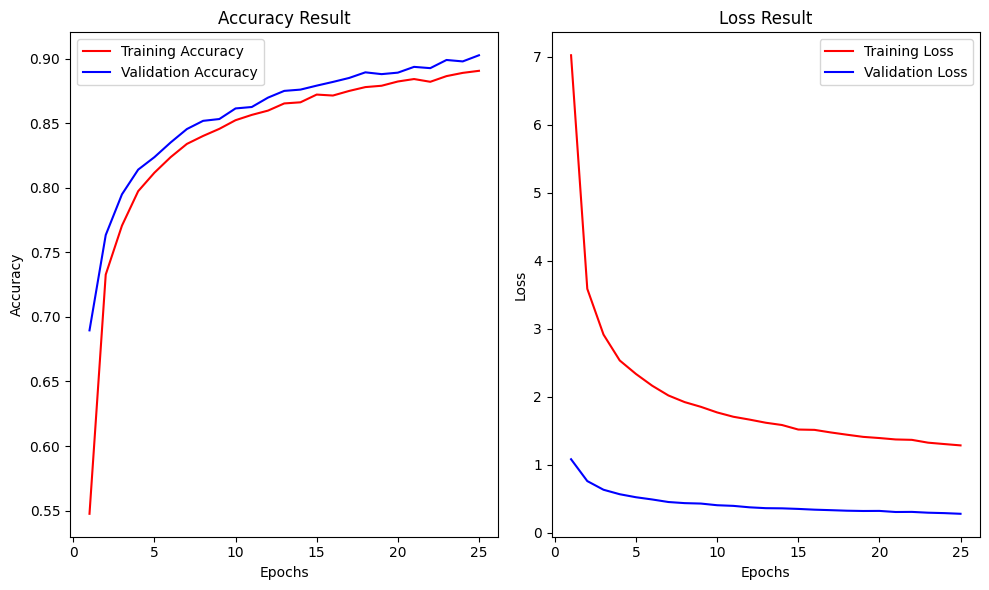

In [35]:
# Plotting results
epochs = range(1, len(history['train_loss']) + 1)
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs, history['train_acc'], 'r', label='Training Accuracy')
plt.plot(epochs, history['valid_acc'], 'b', label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Result')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, history['train_loss'], 'r', label='Training Loss')
plt.plot(epochs, history['valid_loss'], 'b', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Result')
plt.legend()

plt.tight_layout()
plt.show()

In [37]:

# Evaluate the model
def evaluate(model, data_loader):
    model.eval()
    running_loss = 0.0
    corrects = 0
    total = 0
    all_labels = []
    all_preds = []
    
    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            corrects += torch.sum(preds == labels.data)
            total += labels.size(0)
            
            # Collect all labels and predictions for classification report
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
    
    avg_loss = running_loss / len(data_loader.dataset)
    accuracy = corrects.double() / total
    
    return avg_loss, accuracy, all_labels, all_preds

# Evaluate on the training set
train_loss, train_acc, train_labels, train_preds = evaluate(model, train_loader)
print(f'Training Loss: {train_loss:.4f} Accuracy: {train_acc:.4f}')

# Evaluate on the validation set
valid_loss, valid_acc, valid_labels, valid_preds = evaluate(model, valid_loader)
print(f'Validation Loss: {valid_loss:.4f} Accuracy: {valid_acc:.4f}')


Training Loss: 0.2579 Accuracy: 0.9088
Validation Loss: 0.2790 Accuracy: 0.9036


In [39]:
# Generate classification report for training set
class_names = train_dataset.classes
print("Training Set Classification Report:")
print(classification_report(train_labels, train_preds, target_names=class_names))


Training Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.96      0.95      0.95      2016
                                 Apple___Black_rot       0.95      0.97      0.96      1987
                          Apple___Cedar_apple_rust       0.97      0.98      0.97      1760
                                   Apple___healthy       0.96      0.96      0.96      2008
                    Cauliflower_Bacterial spot rot       0.95      0.96      0.95       173
                             Cauliflower_Black Rot       0.78      0.92      0.84       100
                          Cauliflower_Downy Mildew       0.84      0.68      0.75       177
                               Cauliflower_Healthy       1.00      0.98      0.99       206
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.81      0.92      0.86      2729
                       Corn_(maize)___Commo

In [41]:
# Generate classification report for validation set
print("Validation Set Classification Report:")
print(classification_report(valid_labels, valid_preds, target_names=class_names))


Validation Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.96      0.94      0.95       504
                                 Apple___Black_rot       0.94      0.96      0.95       497
                          Apple___Cedar_apple_rust       0.94      0.96      0.95       440
                                   Apple___healthy       0.95      0.97      0.96       502
                    Cauliflower_Bacterial spot rot       0.94      0.95      0.94        93
                             Cauliflower_Black Rot       0.88      0.99      0.93        70
                          Cauliflower_Downy Mildew       0.92      0.63      0.75        95
                               Cauliflower_Healthy       0.97      0.95      0.96       104
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.81      0.93      0.87       820
                       Corn_(maize)___Com

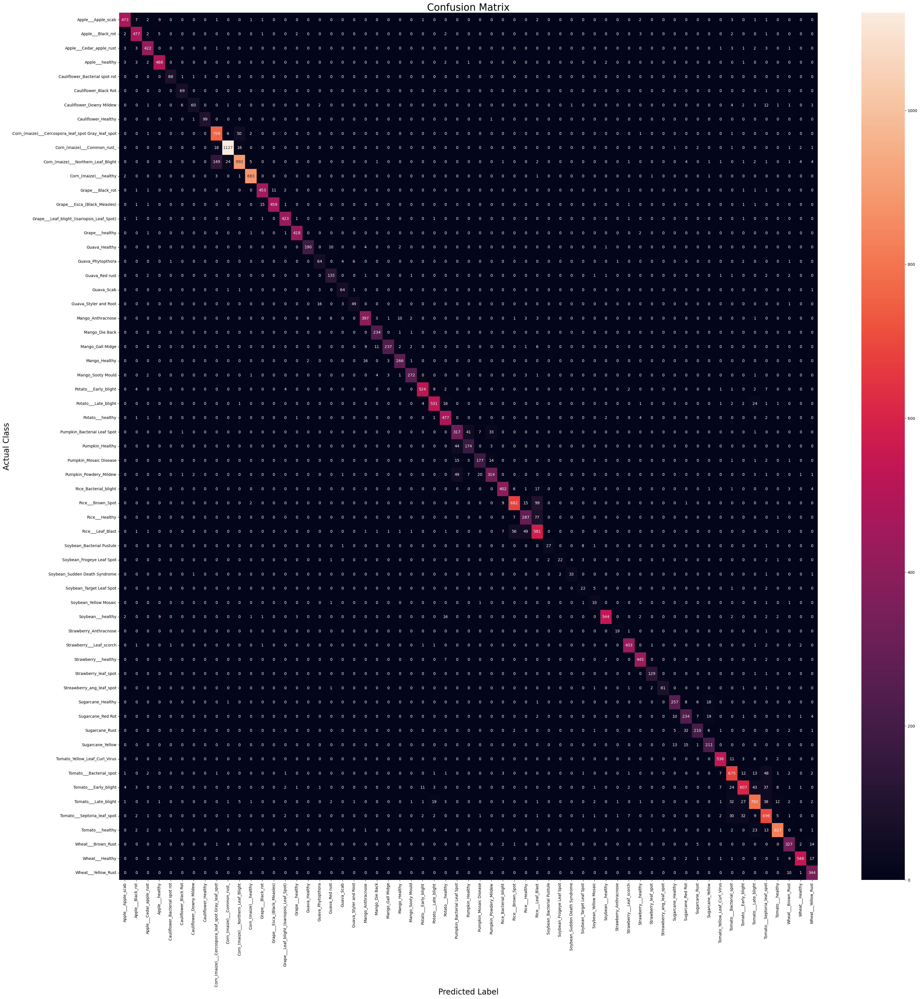

In [43]:
# Generate confusion matrix
cm = confusion_matrix(valid_labels, valid_preds, labels=range(len(class_names)))
plt.figure(figsize=(40, 40))
sns.heatmap(cm, annot=True, fmt='d', annot_kws={'size': 10}, xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label', fontsize=20)
plt.ylabel("Actual Class", fontsize=20)
plt.title('Confusion Matrix', fontsize=25)
plt.show()


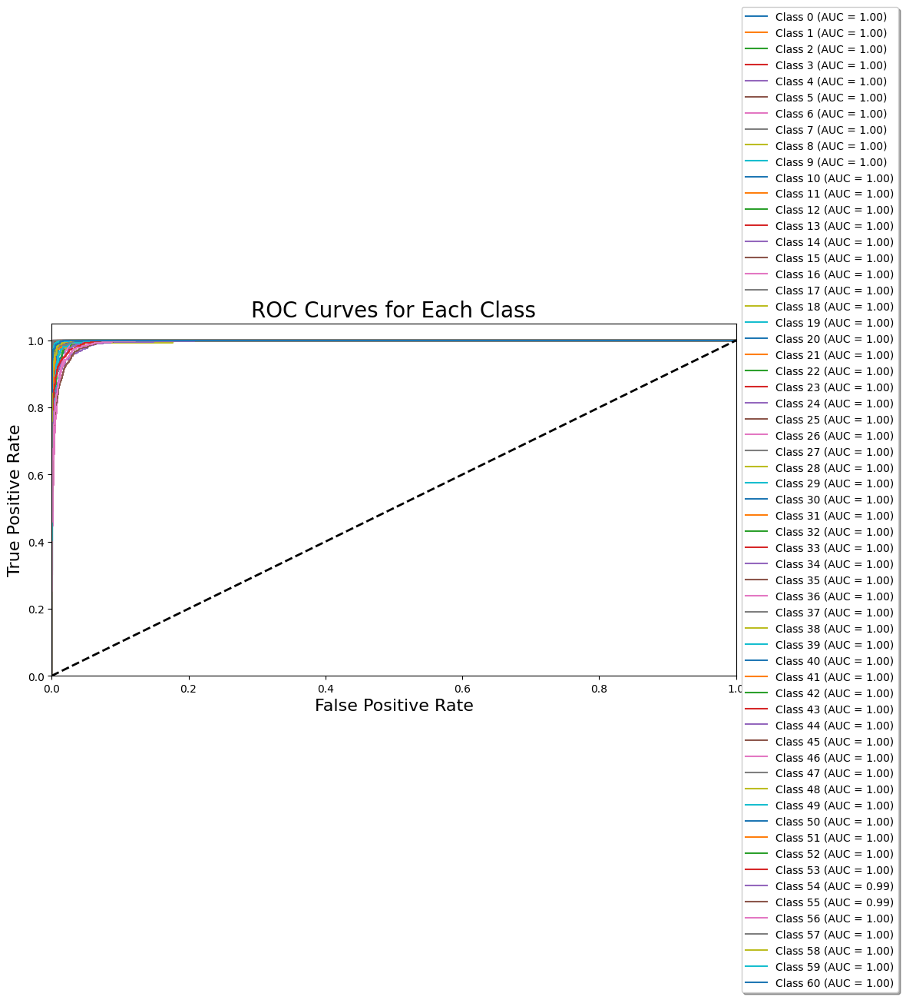

In [47]:
# Plot ROC curves
def plot_roc_curves(model, data_loader, num_classes):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # Get probabilities
            probs = torch.nn.functional.softmax(outputs, dim=1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(probs.cpu().numpy())

    # Binarize the labels
    y_true = label_binarize(all_labels, classes=range(num_classes))
    y_score = np.array(all_preds)

    # Compute ROC curves and ROC AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(14, 10))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curves for Each Class', fontsize=20)

    # Position the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fancybox=True, shadow=True, ncol=1)
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for legend

    plt.show()

# Plot ROC curves for the validation set
plot_roc_curves(model, valid_loader, len(class_names))

C:\Users\ACER\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ACER\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\ACER\AppData\Local\Temp\ipykernel_15888\2829154235.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://g

Test Loss: 0.4204 Accuracy: 0.8361
Test Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      0.80      0.89         5
                                 Apple___Black_rot       1.00      1.00      1.00         5
                          Apple___Cedar_apple_rust       1.00      1.00      1.00         5
                                   Apple___healthy       1.00      1.00      1.00         5
                    Cauliflower_Bacterial spot rot       1.00      1.00      1.00         5
                             Cauliflower_Black Rot       1.00      1.00      1.00         5
                          Cauliflower_Downy Mildew       1.00      0.40      0.57         5
                               Cauliflower_Healthy       1.00      1.00      1.00         5
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.80      0.80      0.80         5
            

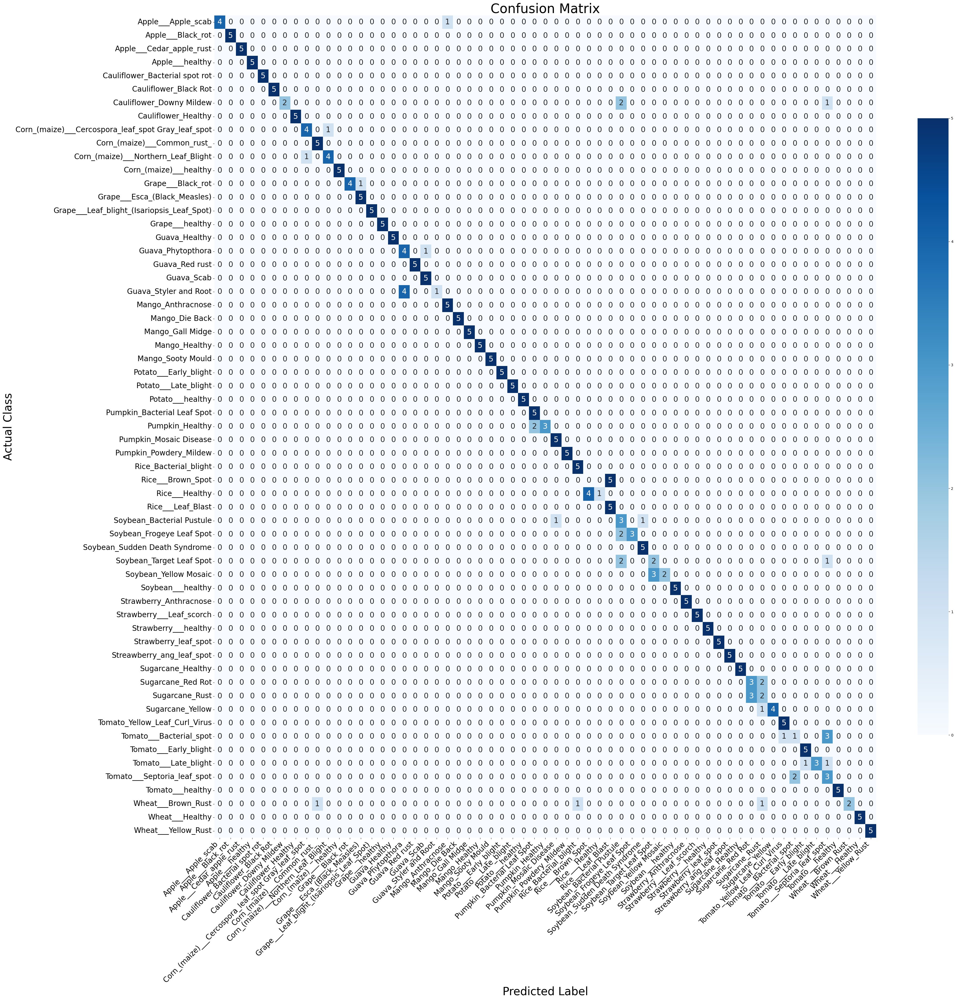

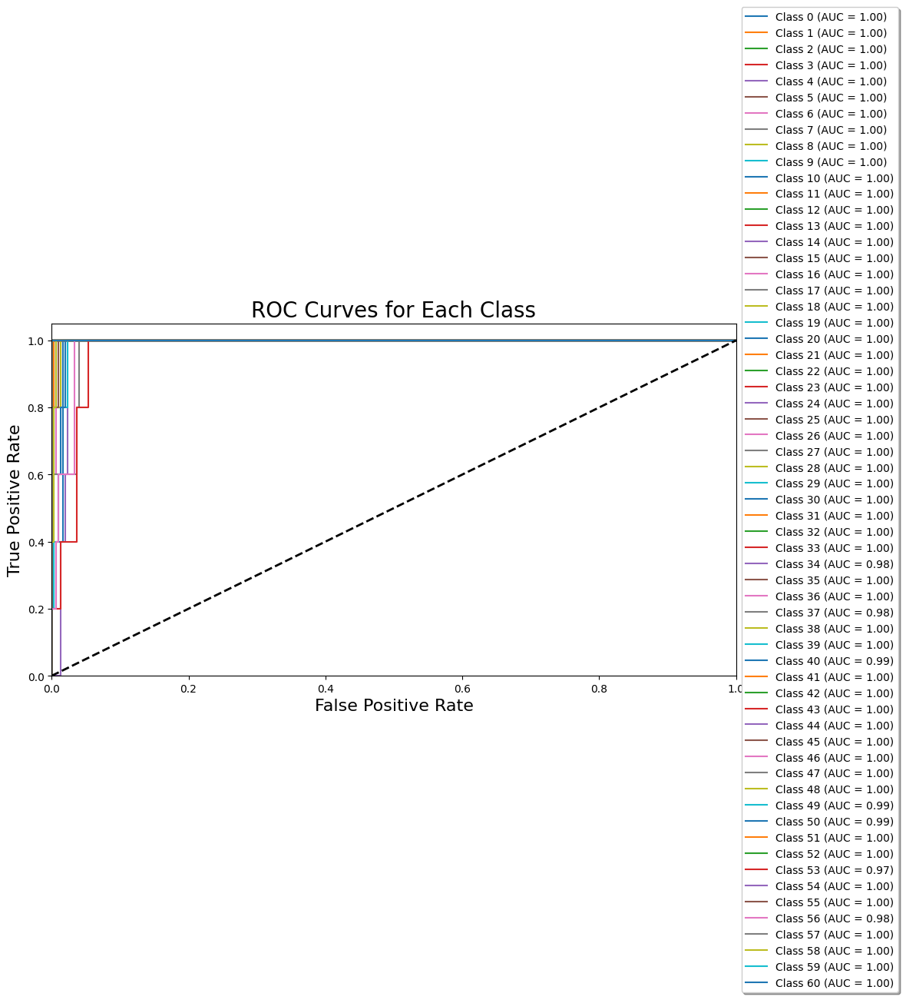

In [49]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from torchvision import models

# Define the criterion
criterion = nn.CrossEntropyLoss()

# Load the test dataset
test_transform = transforms.Compose([
    transforms.Resize(128),
    transforms.CenterCrop(128),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/test/', transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=8, pin_memory=True)

# Load the model
model = models.densenet121(pretrained=True)
model.classifier = nn.Linear(model.classifier.in_features, len(test_dataset.classes))
model.load_state_dict(torch.load('densenet.pth'))
model = model.to(device)

# Evaluate the model on the test set
def evaluate(model, data_loader):
    model.eval()
    running_loss = 0.0
    corrects = 0
    total = 0
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            corrects += torch.sum(preds == labels.data)
            total += labels.size(0)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    avg_loss = running_loss / len(data_loader.dataset)
    accuracy = corrects.double() / total

    return avg_loss, accuracy, all_labels, all_preds

test_loss, test_acc, test_labels, test_preds = evaluate(model, test_loader)
print(f'Test Loss: {test_loss:.4f} Accuracy: {test_acc:.4f}')

# Generate classification report for the test set
class_names = test_dataset.classes
print("Test Set Classification Report:")
print(classification_report(test_labels, test_preds, target_names=class_names))

# Generate confusion matrix
cm = confusion_matrix(test_labels, test_preds, labels=range(len(class_names)))

plt.figure(figsize=(40, 40))  # Increase the figure size for better readability
sns.heatmap(cm, annot=True, fmt='d', annot_kws={'size': 20}, cmap="Blues", 
            xticklabels=class_names, yticklabels=class_names, cbar_kws={'shrink': 0.75})
plt.xlabel('Predicted Label', fontsize=30)
plt.ylabel("Actual Class", fontsize=30)
plt.title('Confusion Matrix', fontsize=35)
plt.xticks(fontsize=20, rotation=45, ha="right")  # Rotate x-axis labels for better readability
plt.yticks(fontsize=20, rotation=0)  # Keep y-axis labels horizontal
plt.show()

# Define the plot_roc_curves function
def plot_roc_curves(model, data_loader, num_classes):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # Get probabilities
            probs = torch.nn.functional.softmax(outputs, dim=1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(probs.cpu().numpy())

    # Binarize the labels
    y_true = label_binarize(all_labels, classes=range(num_classes))
    y_score = np.array(all_preds)

    # Compute ROC curves and ROC AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(14, 10))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curves for Each Class', fontsize=20)

    # Position the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fancybox=True, shadow=True, ncol=1)
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for legend

    plt.show()

# Plot ROC curves for the test set
plot_roc_curves(model, test_loader, len(class_names))


## Efficient Net

In [23]:
pip install efficientnet-pytorch

Note: you may need to restart the kernel to use updated packages.


In [52]:
# device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
# # Set device
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# # model.to(device)

In [25]:
from efficientnet_pytorch import EfficientNet
# Define the EfficientNet model
model = EfficientNet.from_pretrained('efficientnet-b0')
model._fc = nn.Linear(model._fc.in_features, len(train_dataset.classes))


Loaded pretrained weights for efficientnet-b0


In [27]:
# Move model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device.type == 'cuda':
    print(f"Using GPU: {torch.cuda.get_device_name(0)}")
else:
    print("Using CPU")
model = model.to(device)

Using GPU: NVIDIA GeForce RTX 4060 Laptop GPU


In [29]:

# Define transformations for data augmentation and normalization
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.RandomResizedCrop(128),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load datasets
train_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/train/', transform=transform)
valid_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/valid/', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=8, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False, num_workers=8, pin_memory=True)


In [76]:
# # Wrap model with DataParallel if more than one GPU is available
# if torch.cuda.device_count() > 1:
#     model = nn.DataParallel(model)

# model.to(device)


In [78]:

# Define criterion and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# Gradient accumulation settings
accumulation_steps = 4

# Train the model
def train_model(model, train_loader, valid_loader, criterion, optimizer, num_epochs=20):
    history = {'train_loss': [], 'valid_loss': [], 'train_acc': [], 'valid_acc': []}
    
    for epoch in range(num_epochs):
        # Training Phase
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        with tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", unit='batch') as tepoch:
            for i, (images, labels) in enumerate(tepoch):
                images, labels = images.to(device), labels.to(device)
                
                # Forward pass
                outputs = model(images)
                loss = criterion(outputs, labels)
                
                # Backward pass and optimization
                loss = loss / accumulation_steps  # Scale loss for gradient accumulation
                loss.backward()
                
                if (i + 1) % accumulation_steps == 0:
                    optimizer.step()
                    optimizer.zero_grad()
                
                # Statistics
                running_loss += loss.item() * accumulation_steps
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()
                
                # Update progress bar description
                tepoch.set_postfix(train_loss=running_loss / total, train_acc=correct / total)
        
        epoch_loss = running_loss / len(train_loader)
        epoch_acc = correct / total
        
        # Validation Phase
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for images, labels in valid_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()
        
        val_loss /= len(valid_loader)
        val_acc = val_correct / val_total
        
        # Save history
        history['train_loss'].append(epoch_loss)
        history['valid_loss'].append(val_loss)
        history['train_acc'].append(epoch_acc)
        history['valid_acc'].append(val_acc)
        
        # Print the full summary for the epoch
        print(f"Epoch [{epoch+1}/{num_epochs}], "
              f"train_acc: {epoch_acc:.4f}, train_loss: {epoch_loss:.4f}, "
              f"valid_loss: {val_loss:.4f}, valid_acc: {val_acc:.4f}")
    
    return history


In [82]:
# Train the model
history = train_model(model, train_loader, valid_loader, criterion, optimizer)

Epoch 1/20: 100%|███████████████████████████| 2511/2511 [05:44<00:00,  7.28batch/s, train_acc=0.865, train_loss=0.0131]


Epoch [1/20], train_acc: 0.8653, train_loss: 0.4182, valid_loss: 0.2984, valid_acc: 0.8991


Epoch 2/20: 100%|████████████████████████████| 2511/2511 [05:40<00:00,  7.37batch/s, train_acc=0.89, train_loss=0.0104]


Epoch [2/20], train_acc: 0.8905, train_loss: 0.3312, valid_loss: 0.2430, valid_acc: 0.9158


Epoch 3/20: 100%|██████████████████████████| 2511/2511 [05:42<00:00,  7.34batch/s, train_acc=0.904, train_loss=0.00899]


Epoch [3/20], train_acc: 0.9037, train_loss: 0.2877, valid_loss: 0.2103, valid_acc: 0.9265


Epoch 4/20: 100%|██████████████████████████| 2511/2511 [05:37<00:00,  7.43batch/s, train_acc=0.914, train_loss=0.00803]


Epoch [4/20], train_acc: 0.9137, train_loss: 0.2568, valid_loss: 0.1939, valid_acc: 0.9329


Epoch 5/20: 100%|███████████████████████████| 2511/2511 [05:43<00:00,  7.31batch/s, train_acc=0.92, train_loss=0.00736]


Epoch [5/20], train_acc: 0.9199, train_loss: 0.2355, valid_loss: 0.1829, valid_acc: 0.9354


Epoch 6/20: 100%|██████████████████████████| 2511/2511 [05:41<00:00,  7.34batch/s, train_acc=0.926, train_loss=0.00676]


Epoch [6/20], train_acc: 0.9260, train_loss: 0.2164, valid_loss: 0.1634, valid_acc: 0.9423


Epoch 7/20: 100%|███████████████████████████| 2511/2511 [05:36<00:00,  7.46batch/s, train_acc=0.93, train_loss=0.00634]


Epoch [7/20], train_acc: 0.9305, train_loss: 0.2029, valid_loss: 0.1507, valid_acc: 0.9466


Epoch 8/20: 100%|██████████████████████████| 2511/2511 [05:41<00:00,  7.36batch/s, train_acc=0.936, train_loss=0.00587]


Epoch [8/20], train_acc: 0.9363, train_loss: 0.1879, valid_loss: 0.1506, valid_acc: 0.9459


Epoch 9/20: 100%|██████████████████████████| 2511/2511 [05:46<00:00,  7.24batch/s, train_acc=0.937, train_loss=0.00571]


Epoch [9/20], train_acc: 0.9372, train_loss: 0.1826, valid_loss: 0.1405, valid_acc: 0.9512


Epoch 10/20: 100%|█████████████████████████| 2511/2511 [05:39<00:00,  7.39batch/s, train_acc=0.941, train_loss=0.00542]


Epoch [10/20], train_acc: 0.9406, train_loss: 0.1735, valid_loss: 0.1300, valid_acc: 0.9526


Epoch 11/20: 100%|█████████████████████████| 2511/2511 [05:37<00:00,  7.44batch/s, train_acc=0.944, train_loss=0.00517]


Epoch [11/20], train_acc: 0.9440, train_loss: 0.1654, valid_loss: 0.1306, valid_acc: 0.9531


Epoch 12/20: 100%|█████████████████████████| 2511/2511 [05:33<00:00,  7.53batch/s, train_acc=0.945, train_loss=0.00497]


Epoch [12/20], train_acc: 0.9448, train_loss: 0.1588, valid_loss: 0.1221, valid_acc: 0.9572


Epoch 13/20: 100%|█████████████████████████| 2511/2511 [05:37<00:00,  7.44batch/s, train_acc=0.946, train_loss=0.00482]


Epoch [13/20], train_acc: 0.9461, train_loss: 0.1541, valid_loss: 0.1220, valid_acc: 0.9566


Epoch 14/20: 100%|███████████████████████████| 2511/2511 [05:39<00:00,  7.40batch/s, train_acc=0.95, train_loss=0.0046]


Epoch [14/20], train_acc: 0.9498, train_loss: 0.1471, valid_loss: 0.1137, valid_acc: 0.9601


Epoch 15/20: 100%|██████████████████████████| 2511/2511 [05:30<00:00,  7.59batch/s, train_acc=0.95, train_loss=0.00449]


Epoch [15/20], train_acc: 0.9501, train_loss: 0.1437, valid_loss: 0.1175, valid_acc: 0.9598


Epoch 16/20: 100%|█████████████████████████| 2511/2511 [05:36<00:00,  7.45batch/s, train_acc=0.952, train_loss=0.00437]


Epoch [16/20], train_acc: 0.9520, train_loss: 0.1398, valid_loss: 0.1116, valid_acc: 0.9599


Epoch 17/20: 100%|█████████████████████████| 2511/2511 [05:47<00:00,  7.22batch/s, train_acc=0.952, train_loss=0.00431]


Epoch [17/20], train_acc: 0.9519, train_loss: 0.1380, valid_loss: 0.1049, valid_acc: 0.9635


Epoch 18/20: 100%|█████████████████████████| 2511/2511 [05:39<00:00,  7.39batch/s, train_acc=0.955, train_loss=0.00407]


Epoch [18/20], train_acc: 0.9555, train_loss: 0.1302, valid_loss: 0.0974, valid_acc: 0.9649


Epoch 19/20: 100%|█████████████████████████| 2511/2511 [05:33<00:00,  7.53batch/s, train_acc=0.955, train_loss=0.00408]


Epoch [19/20], train_acc: 0.9553, train_loss: 0.1306, valid_loss: 0.0980, valid_acc: 0.9649


Epoch 20/20: 100%|█████████████████████████| 2511/2511 [05:37<00:00,  7.44batch/s, train_acc=0.955, train_loss=0.00403]


Epoch [20/20], train_acc: 0.9554, train_loss: 0.1288, valid_loss: 0.0966, valid_acc: 0.9665


In [86]:
# Save the model
torch.save(model.state_dict(), 'efficientnet.pth')
print("Model saved as efficientnet.pth")


Model saved as efficientnet.pth


In [98]:
import torch
import torch.nn as nn
from torchinfo import summary
from torchvision import models

from efficientnet_pytorch import EfficientNet
# Define the EfficientNet model
model = EfficientNet.from_pretrained('efficientnet-b0')
model._fc = nn.Linear(model._fc.in_features, len(train_dataset.classes))

# Example batch size
batch_size = 32

# Use the summary function to print the model summary
summary(model, input_size=(batch_size, 3, 224, 224))

Loaded pretrained weights for efficientnet-b0


Layer (type:depth-idx)                             Output Shape              Param #
EfficientNet                                       [32, 61]                  --
├─Conv2dStaticSamePadding: 1-1                     [32, 32, 112, 112]        864
│    └─ZeroPad2d: 2-1                              [32, 3, 225, 225]         --
├─BatchNorm2d: 1-2                                 [32, 32, 112, 112]        64
├─MemoryEfficientSwish: 1-3                        [32, 32, 112, 112]        --
├─ModuleList: 1-4                                  --                        --
│    └─MBConvBlock: 2-2                            [32, 16, 112, 112]        --
│    │    └─Conv2dStaticSamePadding: 3-1           [32, 32, 112, 112]        288
│    │    └─BatchNorm2d: 3-2                       [32, 32, 112, 112]        64
│    │    └─MemoryEfficientSwish: 3-3              [32, 32, 112, 112]        --
│    │    └─Conv2dStaticSamePadding: 3-4           [32, 8, 1, 1]             264
│    │    └─MemoryEfficientSwish

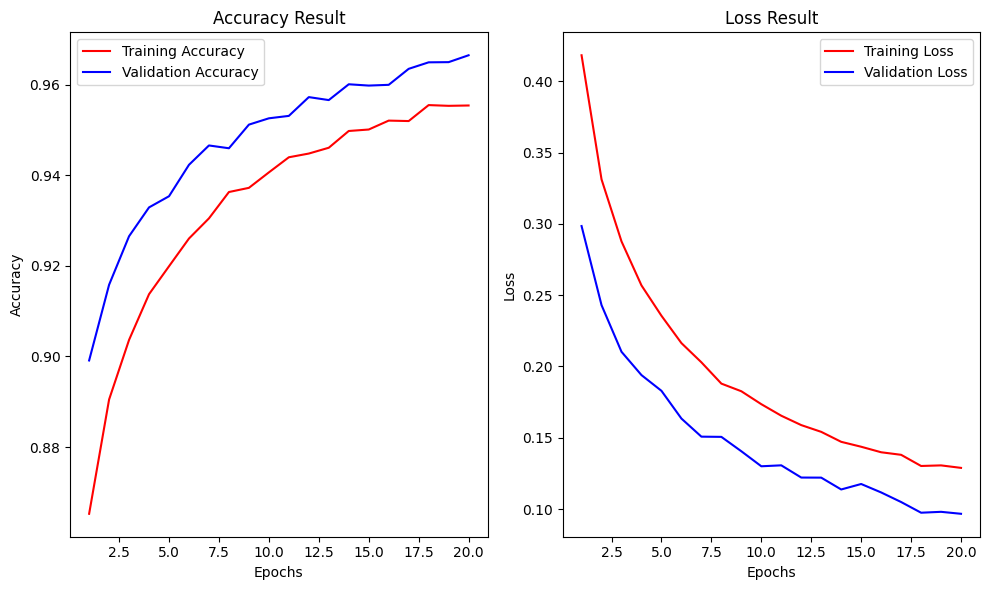

In [88]:
# Plotting results
epochs = range(1, len(history['train_loss']) + 1)
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs, history['train_acc'], 'r', label='Training Accuracy')
plt.plot(epochs, history['valid_acc'], 'b', label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Result')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, history['train_loss'], 'r', label='Training Loss')
plt.plot(epochs, history['valid_loss'], 'b', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Result')
plt.legend()

plt.tight_layout()
plt.show()


In [90]:
# Evaluate the model
def evaluate(model, data_loader):
    model.eval()
    running_loss = 0.0
    corrects = 0
    total = 0
    all_labels = []
    all_preds = []
    
    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            corrects += torch.sum(preds == labels.data)
            total += labels.size(0)
            
            # Collect all labels and predictions for classification report
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
    
    avg_loss = running_loss / len(data_loader.dataset)
    accuracy = corrects.double() / total
    
    return avg_loss, accuracy, all_labels, all_preds

# Evaluate on the training set
train_loss, train_acc, train_labels, train_preds = evaluate(model, train_loader)
print(f'Training Loss: {train_loss:.4f} Accuracy: {train_acc:.4f}')

# Evaluate on the validation set
valid_loss, valid_acc, valid_labels, valid_preds = evaluate(model, valid_loader)
print(f'Validation Loss: {valid_loss:.4f} Accuracy: {valid_acc:.4f}')


Training Loss: 0.0820 Accuracy: 0.9709
Validation Loss: 0.1021 Accuracy: 0.9646


In [92]:
# Generate classification report for training set
class_names = train_dataset.classes
print("Training Set Classification Report:")
print(classification_report(train_labels, train_preds, target_names=class_names))


Training Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.99      0.99      0.99      2016
                                 Apple___Black_rot       0.99      0.99      0.99      1987
                          Apple___Cedar_apple_rust       0.99      0.99      0.99      1760
                                   Apple___healthy       0.99      0.99      0.99      2008
                    Cauliflower_Bacterial spot rot       1.00      0.99      0.99       173
                             Cauliflower_Black Rot       0.96      1.00      0.98       100
                          Cauliflower_Downy Mildew       0.98      0.94      0.96       177
                               Cauliflower_Healthy       1.00      1.00      1.00       206
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.97      0.95      0.96      2729
                       Corn_(maize)___Commo

In [94]:
# Generate classification report for validation set
print("Validation Set Classification Report:")
print(classification_report(valid_labels, valid_preds, target_names=class_names))


Validation Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.99      0.99      0.99       504
                                 Apple___Black_rot       0.98      0.99      0.98       497
                          Apple___Cedar_apple_rust       1.00      1.00      1.00       440
                                   Apple___healthy       0.99      0.97      0.98       502
                    Cauliflower_Bacterial spot rot       1.00      0.99      0.99        93
                             Cauliflower_Black Rot       0.97      0.99      0.98        70
                          Cauliflower_Downy Mildew       0.97      0.94      0.95        95
                               Cauliflower_Healthy       0.99      1.00      1.00       104
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.97      0.94      0.96       820
                       Corn_(maize)___Com

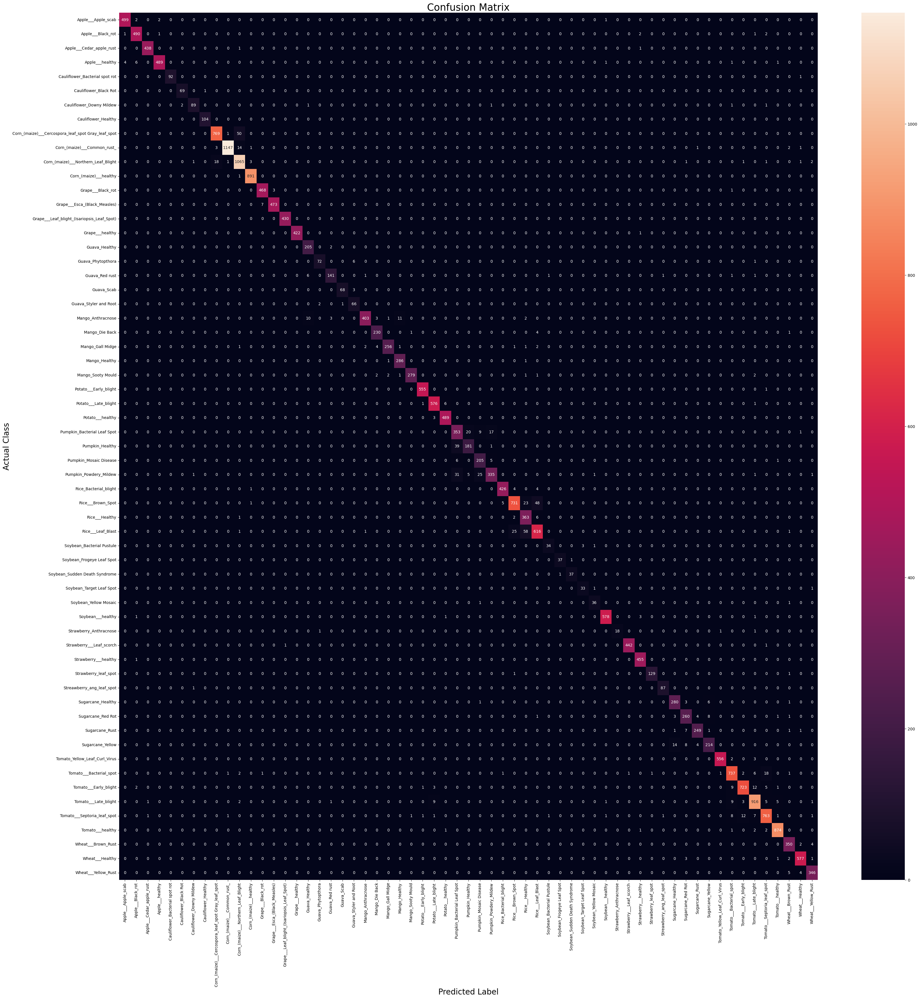

In [96]:

# Generate confusion matrix
cm = confusion_matrix(valid_labels, valid_preds, labels=range(len(class_names)))
plt.figure(figsize=(40, 40))
sns.heatmap(cm, annot=True, fmt='d', annot_kws={'size': 10}, xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label', fontsize=20)
plt.ylabel("Actual Class", fontsize=20)
plt.title('Confusion Matrix', fontsize=25)
plt.show()

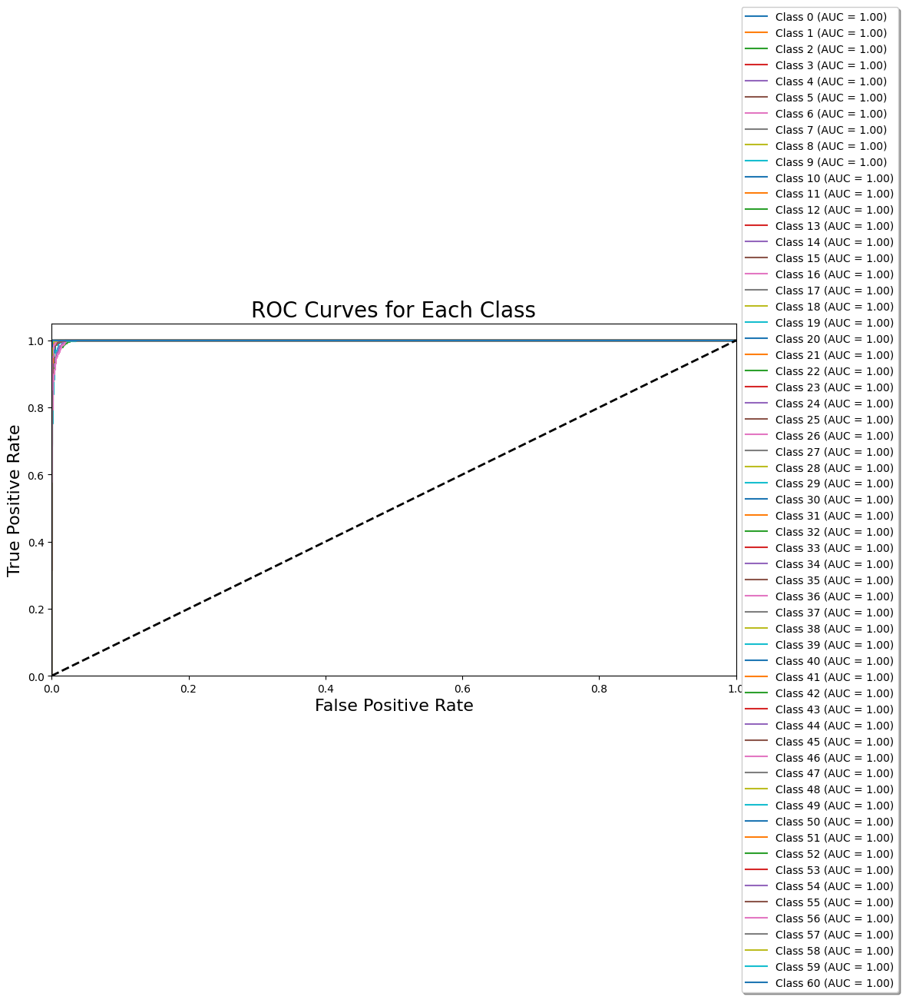

In [100]:
# Plot ROC curves
def plot_roc_curves(model, data_loader, num_classes):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # Get probabilities
            probs = torch.nn.functional.softmax(outputs, dim=1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(probs.cpu().numpy())

    # Binarize the labels
    y_true = label_binarize(all_labels, classes=range(num_classes))
    y_score = np.array(all_preds)

    # Compute ROC curves and ROC AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(14, 10))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.title('ROC Curves for Each Class', fontsize=20)

    # Position the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fancybox=True, shadow=True, ncol=1)
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for legend

    plt.show()

# Plot ROC curves for the validation set
plot_roc_curves(model, valid_loader, len(class_names))

Loaded pretrained weights for efficientnet-b0


C:\Users\ACER\AppData\Local\Temp\ipykernel_15888\161320415.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('efficientnet.pth'))


Test Loss: 0.0873 Accuracy: 0.9738
Test Set Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      1.00      1.00         5
                                 Apple___Black_rot       1.00      1.00      1.00         5
                          Apple___Cedar_apple_rust       1.00      1.00      1.00         5
                                   Apple___healthy       1.00      1.00      1.00         5
                    Cauliflower_Bacterial spot rot       1.00      1.00      1.00         5
                             Cauliflower_Black Rot       1.00      1.00      1.00         5
                          Cauliflower_Downy Mildew       1.00      1.00      1.00         5
                               Cauliflower_Healthy       1.00      1.00      1.00         5
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       1.00      1.00      1.00         5
            

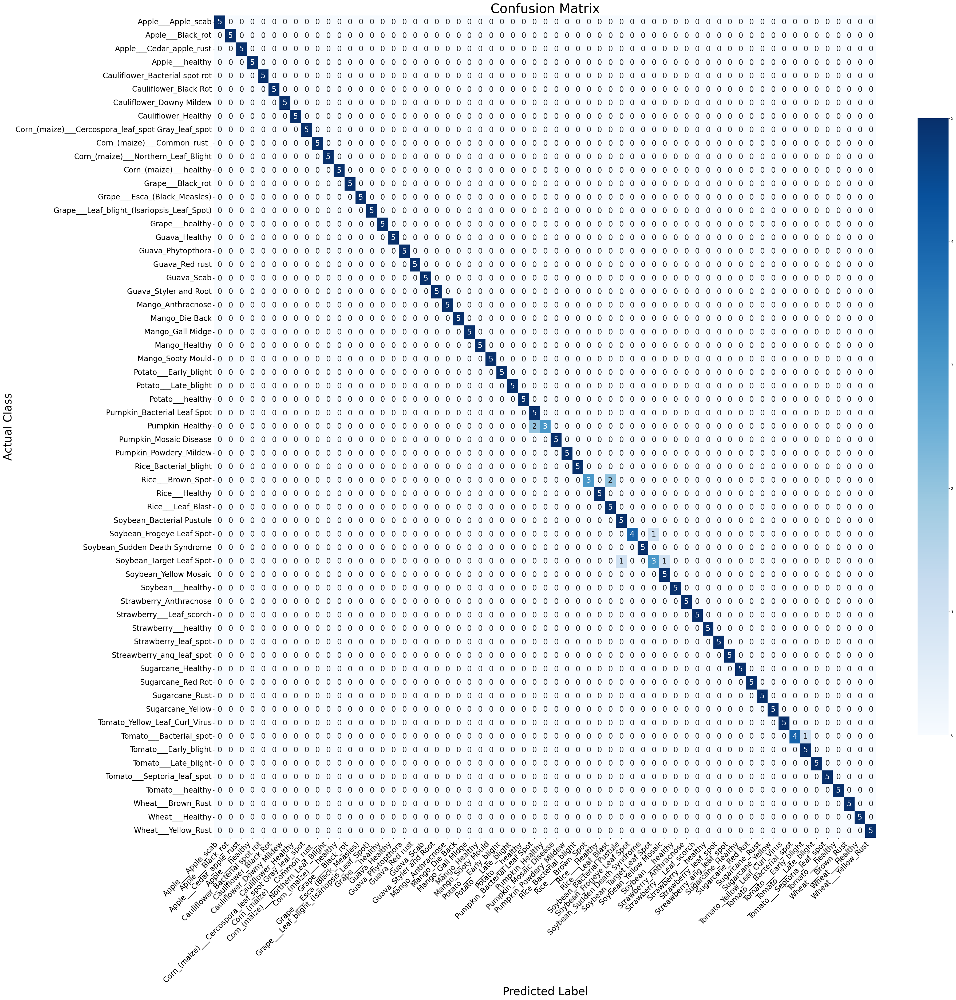

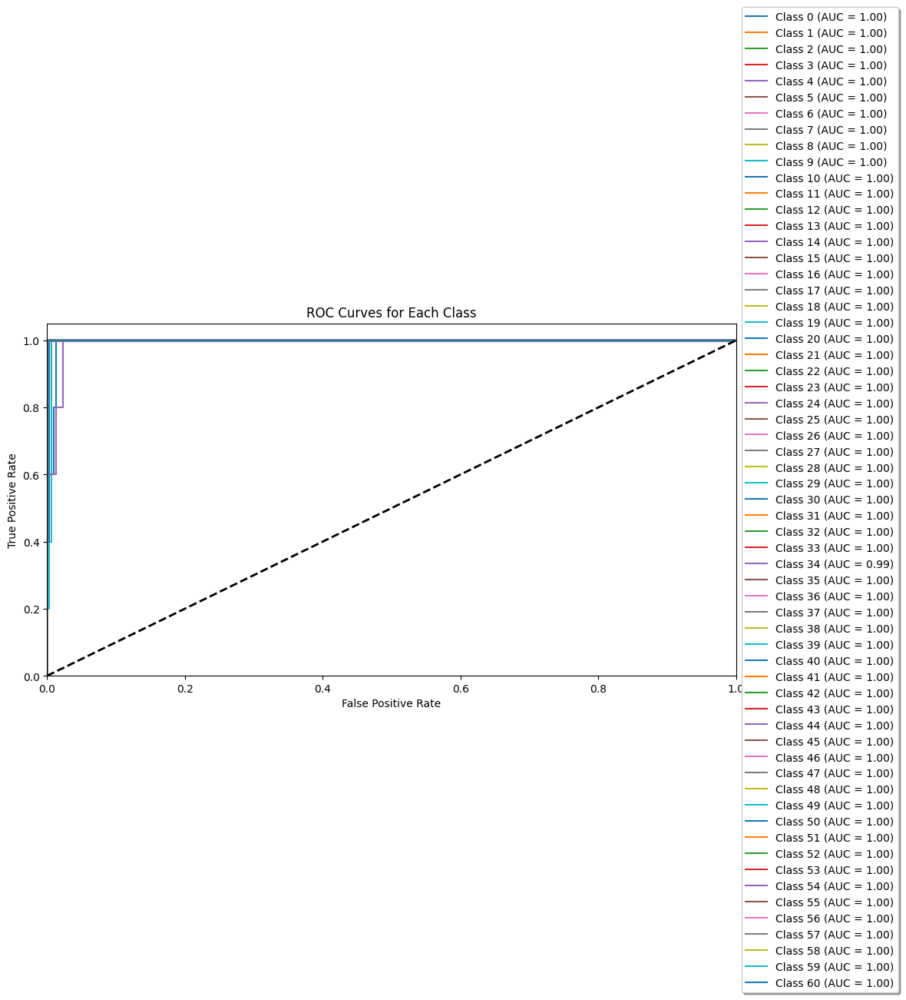

In [47]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from efficientnet_pytorch import EfficientNet

# Define the criterion
criterion = nn.CrossEntropyLoss()

# Load the test dataset
test_transform = transforms.Compose([
    transforms.Resize(128),
    transforms.CenterCrop(128),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_dataset = datasets.ImageFolder(root='C:/Users/ACER/Desktop/PlantDataset/test/', transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=8, pin_memory=True)

# Load the model
model = EfficientNet.from_pretrained('efficientnet-b0')
model._fc = nn.Linear(model._fc.in_features, len(test_dataset.classes))
model.load_state_dict(torch.load('efficientnet.pth'))
model = model.to(device)

# Evaluate the model on the test set
def evaluate(model, data_loader):
    model.eval()
    running_loss = 0.0
    corrects = 0
    total = 0
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            corrects += torch.sum(preds == labels.data)
            total += labels.size(0)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    avg_loss = running_loss / len(data_loader.dataset)
    accuracy = corrects.double() / total

    return avg_loss, accuracy, all_labels, all_preds

test_loss, test_acc, test_labels, test_preds = evaluate(model, test_loader)
print(f'Test Loss: {test_loss:.4f} Accuracy: {test_acc:.4f}')

# Generate classification report for the test set
class_names = test_dataset.classes
print("Test Set Classification Report:")
print(classification_report(test_labels, test_preds, target_names=class_names))

# Generate confusion matrix
cm = confusion_matrix(test_labels, test_preds, labels=range(len(class_names)))

plt.figure(figsize=(40, 40))  # Increase the figure size for better readability
sns.heatmap(cm, annot=True, fmt='d', annot_kws={'size': 20}, cmap="Blues", 
            xticklabels=class_names, yticklabels=class_names, cbar_kws={'shrink': 0.75})
plt.xlabel('Predicted Label', fontsize=30)
plt.ylabel("Actual Class", fontsize=30)
plt.title('Confusion Matrix', fontsize=35)
plt.xticks(fontsize=20, rotation=45, ha="right")  # Rotate x-axis labels for better readability
plt.yticks(fontsize=20, rotation=0)  # Keep y-axis labels horizontal
plt.show()


# Define the plot_roc_curves function
def plot_roc_curves(model, data_loader, num_classes):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # Get probabilities
            probs = torch.nn.functional.softmax(outputs, dim=1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(probs.cpu().numpy())

    # Binarize the labels
    y_true = label_binarize(all_labels, classes=range(num_classes))
    y_score = np.array(all_preds)

    # Compute ROC curves and ROC AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(14, 10))
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves for Each Class')

    # Position the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fancybox=True, shadow=True, ncol=1)
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for legend

    plt.show()

# Plot ROC curves for the test set
plot_roc_curves(model, test_loader, len(class_names))
